Some code in this notebook has been adapted from the work of Zhongy et al. and Greydanus et al. and from the report and code of Jonas Perolini.

Their code is available in the following repositories :[
Symplectic-ODENet](https://github.com/Physics-aware-AI/Symplectic-ODENet) and [hamiltonian-nn](https://github.com/greydanus/hamiltonian-nn)

Structure inspired from https://github.com/Physics-aware-AI/Symplectic-ODENet/blob/master/experiment-single-force/data.py

# Imports & Setting up directories

In [1]:
try:
    import google.colab
    IN_COLAB = True
except:
    IN_COLAB = False

if IN_COLAB:  
    PATH = './' # './drive/MyDrive/1_SP_Ham_func/'
    from google.colab import drive
    drive.mount('/content/drive')

    %cd /content/drive/MyDrive/1_SP_Ham_func/
    %pip install torchdiffeq
else:
    import sys; sys.path.insert(0, '..') 
    import os
    PATH = '../'


In [2]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

from torch.utils.data import Dataset, DataLoader, random_split
import torch

from torch.optim.lr_scheduler import LinearLR

from torchdiffeq import odeint_adjoint as odeint_adjoint 
# func must be a nn.Module when using the adjoint method
from torchdiffeq import odeint as odeint

import time as time
import json

# Code

## dynamics

In [3]:
def furuta_H(q1, p1, q2, p2, g, Jr, Lr, Mp, Lp):
    '''
    Description:
      Hamiltonian function for the Furuta pendulum 
    Inputs : 
      - q1,p1,q2,p2 (tensors) : Generalized coordinates 
    Outputs : 
      - H (tensor) : Hamiltonian function 
    Credits : 
      - Equations & constants are from Jonas's report
    ''' 

    # system constants
    Jp = (1/12)*Mp*Lp**2

    # function constants
    C1 = Jr + Mp*Lr**2
    C2 = (1/4)*Mp*Lp**2
    C3 = (-1/2)*Mp*Lp*Lr
    C4 = Jp+C2
    C5 = (1/2)*Mp*g*Lp

    # hamiltonian function
    # print('furuta_H','C4*p2**2',(C4*p2**2).shape)
    # print('furuta_H','C2*torch.sin(q1)**2 ',(C2*torch.sin(q1)**2 ).shape)
    # print('furuta_H','2*p1*p2*C3*torch.cos(q1)',(2*p1*p2*C3*torch.cos(q1)).shape)
    H = p1**2 * (C1+C2*torch.sin(q1)**2 )+ C4*p2**2-2*p1*p2*C3*torch.cos(q1)
    H = (1/2) * (H)/(C1*C4+C4*C2*torch.sin(q1)**2 - (C3**2) * (torch.cos(q1)**2)) 
    H = H + C5*(torch.cos(q1)+1)

    return H
    
def hamiltonian_fn_furuta(coords, g, Jr, Lr, Mp, Lp):
    '''
    Description:
      Hamiltonian function for the Furuta pendulum, wraps furuta_H so that it is 
      the right format for ODEint

    Inputs : 
      - coords (tensor) : vector containing generalized coordinates q1,p1,q2,p2

    Outputs :
      - H (tensor) : Scalar Hamiltonian function

    Credits : 
      This function takes the same structure as the one in the SymODEN repository
    '''
    q1,p1,q2,p2 = torch.chunk(coords,4,dim=-1) # torch.split(coords,1)
    # print('hamiltonian_fn_furuta','coords',coords.shape)
    # print('hamiltonian_fn_furuta','q1',q1.shape)
    H = furuta_H(q1, p1, q2, p2, g, Jr, Lr, Mp, Lp)
    # print('hamiltonian_fn_furuta','H',H.shape)
    return H

def coord_derivatives_furuta(t, coords, C_q1, C_q2, g, Jr, Lr, Mp, Lp, u_func, g_func):
    '''
    Description:
        Returns the derivatives of the generalized coordinates

    Inputs : 
      - coords (tensor) : vector containing generalized coordinates q1,p1,q2,p2
      - C_q1 (float) : coefficient of friction related to p1 ( and q1)
      - C_q2 (float) : coefficient of friction related to p2 ( and q2)

    Outputs :
      - dq1dt, dp1dt, dq2dt, dp2dt (tensors) : Derivatives w.r.t coords
    '''
    if coords.requires_grad is not True:
        coords.requires_grad=True

    # Hamiltonian function
    H = hamiltonian_fn_furuta(coords, g, Jr, Lr, Mp, Lp)
    # print('coord_derivatives_furuta','H',H.shape)
    # print('coord_derivatives_furuta','coords',coords.shape)
    # gradient of the hamiltornian function wrt the generalized coordinates
    dcoords = torch.autograd.grad(H.sum(), coords, create_graph=True) # !! might need to add H.sum() if batches used here later

    # dHdq1, dHdp1, dHdq2, dHdp2 = torch.split(dcoords[0], 1)
    dHdq1 , dHdp1, dHdq2 , dHdp2 = torch.chunk(dcoords[0],4,dim=-1)
    # print('coord_derivatives_furuta','dHdq1',dHdq1.shape)
    U = u_func.forward(t)
    G = g_func.forward(coords)
    # print('coord_derivatives_furuta','U',U.shape)
    # print('coord_derivatives_furuta','G',G.shape)
    # print('coord_derivatives_furuta','U * G[1]',(U * G[:,1]).shape)
    # print('coord_derivatives_furuta','U * G[0]',(U * G[:,0]).shape)
    # print('coord_derivatives_furuta','C_q1*dHdp1',(C_q1*dHdp1).shape)
    # print('coord_derivatives_furuta','U * G[:,0].unsqueeze(dim=-1)',((U * G[:,0]).unsqueeze(dim=-1)).shape)
    # print('coord_derivatives_furuta','U * G[:,0].unsqueeze(dim=1)',((U * G[:,0]).unsqueeze(dim=1)).shape)
    dq1dt =   dHdp1 + (U * G[:,0]).unsqueeze(dim=1)
    dp1dt = - dHdq1 - C_q1*dHdp1 + (U * G[:,1]).unsqueeze(dim=1)
    dq2dt =   dHdp2 + (U * G[:,2]).unsqueeze(dim=1)
    dp2dt = - dHdq2 - C_q2*dHdp2 + (U * G[:,3]).unsqueeze(dim=1)
    # print('coord_derivatives_furuta','dq1dt',dq1dt.shape)
    # print('coord_derivatives_furuta','dp1dt',dp1dt.shape)
    return dq1dt, dp1dt, dq2dt, dp2dt
    
def dynamics_fn_furuta(t, coords, C_q1, C_q2, g, Jr, Lr, Mp, Lp, u_func, g_func):
    '''
    Description:
    Function that returns the gradient (in form of a function) of a Hamiltonian function
    Inputs : 
      - t () : 
      - coords () : generalized coordinates
      - u () : system input
      - C () : dissipation coefficient

    Outputs :
      - S () : Symplectic gradient

    Credits : 
      - This function has a similar structure as the one in the SymODEN repository
    '''

    dq1dt, dp1dt, dq2dt, dp2dt = coord_derivatives_furuta(t, coords, C_q1, C_q2, g, Jr, Lr, Mp, Lp, u_func, g_func)

    S = torch.hstack((dq1dt, dp1dt, dq2dt, dp2dt))
    return S

''' Input functions '''

def chirp_fun(t,T=1.5,f0=1,f1=50, scale =1):
    # https://en.wikipedia.org/wiki/Chirp
    c = (f1-f0)/T
    return torch.sin(2*torch.pi*(c*t**2/2 + f0*t))*scale

def multi_sine(t, scale = 0.5):
    f = torch.tensor([2,10,3,4], device = t.device).unsqueeze(dim=1)
    A = torch.tensor([2,0.5,0.3,0.8], device = t.device).unsqueeze(dim=1)
    return (A*torch.sin(2*torch.pi*t*f)).sum(dim=0)*scale

def sine_fun(t, scale = 0.5, f=1):
    return (scale*torch.sin(2*torch.pi*t*f))

def step_fun(t, t1=0.05, scale=0.1):
    f = torch.zeros_like(t)
    f[t < t1] = 0
    f[~(t < t1)] = scale
    return f

class U_FUNC():
    def __init__(self, utype=None, params={}):
        super(U_FUNC).__init__()
        self.utype = utype
        self.params = params # dict containing params for the input function
        self.params['T'] = 1.5
        self.params['f0'] = 1
        self.params['f1'] = 10
        self.params['scale'] = 1


    def forward(self, t):  
        ''' time dependent input '''
        if self.utype == 'chirp':
            u = chirp_fun(t,
                            T=self.params['T'],
                            f0=self.params['f0'],
                            f1=self.params['f1'],
                            scale = self.params['scale'])
        elif self.utype == 'sine':
            u = sine_fun(t, scale = self.params['scale'], f=self.params['f1'])
        elif self.utype == 'tanh':
            u = (-torch.tanh((t-0.75)*4)+1)/100
        elif self.utype == 'multisine':
            u = multi_sine(t, scale = self.params['scale'])
        elif self.utype == 'step':
            u = step_fun(t, t1=0.5)
        elif self.utype is None:
            u = torch.zeros(t.shape, device=t.device)
        u.requires_grad=False
        return u

class G_FUNC():
    def __init__(self, gtype=None, params={}):
        super(G_FUNC).__init__()
        self.gtype = gtype
        self.params = params # dict containing params on
        self.params['q_ref']= torch.tensor([1.0],device=device)
    
    def forward(self, coords): 
        ''' state dependent input '''
        q1,p1,q2,p2 = torch.split(coords,1,dim=-1)
        if self.gtype=='simple':
            if len(q1.shape)==1:
                dimension = 0
            else:
                dimension = 1
            g = torch.stack((torch.zeros(q1.shape[0],device = q1.device),
                             torch.ones(q1.shape[0],device = q1.device), # this is not a mistake, because we use (q1,p1,q2,p2) as convention
                             torch.zeros(q1.shape[0],device = q1.device),
                            torch.ones(q1.shape[0],device = q1.device)), dim=dimension)
        
        # if self.gtype=='setpoint':
        #     if len(q.shape)==1:
        #         dimension = 0
        #     else:
        #         dimension = 1
        #     g = torch.stack((torch.zeros(q.shape[0]),torch.ones(q.shape[0])*q-self.params['q_ref']), dim=dimension)

        elif self.gtype is None:
            if len(q1.shape)==1:
                dimension = 0
            else:
                dimension = 1
            g = torch.stack((torch.zeros(q1.shape[0],device = q1.device),
                             torch.zeros(q1.shape[0],device = q1.device), # this is not a mistake, because we use (q1,p1,q2,p2) as convention
                             torch.zeros(q1.shape[0],device = q1.device),
                            torch.zeros(q1.shape[0],device = q1.device)), dim=dimension)
            # g = torch.zeros((4, q1.shape[0]), device = q1.device)
        g.requires_grad = False
        return g

## trajectories

### single

In [4]:
'''Functions to generate the trajectories'''

def get_trajectory_furuta(device, init_method, num_trajectories, u_func=None, g_func=None, time_steps=20, y0=None, noise_std=0.0, Ts = 0.005, C_q1=0.0, 
                          C_q2=0.0, g = 9.81, Jr = 5.72*1e-5, Lr = 0.085, Mp = 0.024, Lp = 0.129):   
    '''
    Description:

    Inputs:

    Outputs:
      
    '''

     # sampling time

    t_eval = torch.linspace(1, time_steps, time_steps, device=device) * Ts # evaluated times vector
    t_span = [Ts, time_steps*Ts] # [t_start, t_end]

    # get initial state
    if y0 is None:
        y0 = get_init_state(num_trajectories, init_method)
        y0 = y0.to(device) 

    # solve the differential equation using odeint
    q_p = odeint(func=lambda t, coords: dynamics_fn_furuta(t, coords, C_q1, C_q2, g, Jr, Lr, Mp, Lp, u_func, g_func), 
                 y0=y0, t=t_eval, method='rk4', options=dict(step_size=Ts)) 

    q1,p1,q2,p2 = torch.chunk(q_p,4,dim=-1)
    
    # q1, p1, q2, p2 = torch.chunk(q_p, 4, 1) 

    # u = u_func.forward(t_eval)
    # g = g_func.forward(q_p)

    # add noise 
    if noise_std:
        q1 = (q1+torch.randn(q1.shape, device=device)*noise_std).squeeze().detach()
        p1 = (p1+torch.randn(p1.shape, device=device)*noise_std*torch.max(p1)).squeeze().detach()
        q2 = (q2+torch.randn(q2.shape, device=device)*noise_std).squeeze().detach()
        p2 = (p2+torch.randn(p2.shape, device=device)*noise_std*torch.max(p2)).squeeze().detach()
    else:
        q1 = q1.squeeze().detach()
        p1 = p1.squeeze().detach()
        q2 = q2.squeeze().detach()
        p2 = p2.squeeze().detach()
    # .detach() because the pytorch computational graph is no longer needed
    # only the value is needed 
    # .squeeze() to have a desired dimentionality
    # *torch.max(p) otherwise noise is too big compared to the generalized momentum

    return  q1, p1, q2, p2, t_eval.detach() # u, g, q1, p1, q2, p2, t_eval.detach() 

In [5]:
def get_init_state(n, init_method):
    '''
      Returns initial states q1,p1,q2,p2 for the Furuta pendulum 
      The angular velocities ( /generalized momenmtums) are set to zero
    Inputs : 
      None
    Outputs : 
      y0(tensor) : inital condition
      
    '''
    y0 = torch.zeros(n,4)

    if init_method == 'random_nozero':
        x = torch.ones(n)
        mask = torch.full((n,), fill_value=0.5).bernoulli().bool()
        x[mask] = torch.zeros(len(x[mask])).uniform_(0.3, 2)
        x[~mask] = torch.zeros(len(x[~mask])).uniform_(0.3, 2)
    elif init_method == 'random_closetozero':
        x = torch.zeros(n).uniform_(-0.3, 0.3)
    elif init_method == 'random_closetopi':
        x = torch.zeros(n).uniform_(torch.pi-0.3, torch.pi+0.3)

    y0[:,0] = x

    y0[:,2] = torch.zeros(n).uniform_(2, 6) # random_uniform_two_interval() 

    y0[:,1] = torch.zeros(n) # p1 = 0
    y0[:,3] = torch.zeros(n) # p2 = 0
    return y0

### energy

In [6]:
def coord_derivatives_furuta_energy(t, coords, C_q1, C_q2, g, Jr, Lr, Mp, Lp, u_func, g_func):
    '''
    Description:
        Returns the derivatives of the generalized coordinates

    Inputs : 
      - coords (tensor) : vector containing generalized coordinates q1,p1,q2,p2
      - C_q1 (float) : coefficient of friction related to p1 ( and q1)
      - C_q2 (float) : coefficient of friction related to p2 ( and q2)

    Outputs :
      - dq1dt, dp1dt, dq2dt, dp2dt (tensors) : Derivatives w.r.t coords
    '''
    if coords.requires_grad is not True:
        coords.requires_grad=True

    # Hamiltonian function
    H = hamiltonian_fn_furuta(coords, g, Jr, Lr, Mp, Lp)

    # gradient of the hamiltornian function wrt the generalized coordinates
    dcoords = torch.autograd.grad(H.sum(), coords, create_graph=True) # !! might need to add H.sum() if batches used here later

    dHdq1 , dHdp1, dHdq2 , dHdp2 = torch.chunk(dcoords[0],4,dim=-1)

    U = u_func.forward(t)
    G = g_func.forward(coords)

    dq1dt =   dHdp1.squeeze() + (U * G[:,0]).unsqueeze(dim=1)
    dp1dt = - dHdq1.squeeze() - C_q1*dHdp1.squeeze() + (U * G[:,1]).unsqueeze(dim=1)
    dq2dt =   dHdp2.squeeze() + (U * G[:,2]).unsqueeze(dim=1)
    dp2dt = - dHdq2.squeeze() - C_q2*dHdp2.squeeze() + (U * G[:,3]).unsqueeze(dim=1)

    return dq1dt, dp1dt, dq2dt, dp2dt

In [7]:
''' ENERGY functions '''

def energy_furuta(dq1dt, dq2dt, q1, g, Jr, Lr, Mp, Lp):
    '''
    Description:

    Inputs:

    Outpus:
      
    '''
    # system constants
    Jp = (1/12)*Mp*Lp**2

    # function constants
    C1 = Jr + Mp*Lr**2
    C2 = (1/4)*Mp*Lp**2
    C3 = (-1/2)*Mp*Lp*Lr
    C4 = Jp+C2
    C5 = (1/2)*Mp*g*Lp
    
    E = (1/2)* dq2dt**2 * (C1+C2*torch.sin(q1)**2)+ dq2dt*dq1dt*C3*torch.cos(q1)
    E = E +(1/2)*dq1dt**2 *C4+C5*torch.cos(q1)+C5

    return E

def get_energy_furuta(device, time_steps, Ts, u_func, g_func, q1, p1, q2, p2, C_q1, C_q2, g, Jr, Lr, Mp, Lp):
    '''
    Description:

    Inputs:

    Outpus:
      
    '''
    energy=[]
    derivatives=[]
    t = torch.linspace(1, time_steps, time_steps, device=device) * Ts
    #for t, coords in (t, torch.stack((q1, p1, q2, p2),dim=1)):
    coords = torch.stack((q1, p1, q2, p2),dim=-1)
    # for i in range(len(t)):

    dq1dt, dp1dt, dq2dt, dp2dt = coord_derivatives_furuta_energy(t, coords,
                                                            C_q1, C_q2, g, Jr, Lr, Mp, Lp,u_func, g_func)

      # q1_n = coords[i,0]
      # energy.append(energy_furuta(dq1dt,dq2dt,q1_n, g, Jr, Lr, Mp, Lp))
      # derivatives.append(torch.hstack((dq1dt, dp1dt, dq2dt, dp2dt)))
    energy = energy_furuta(dq1dt,dq2dt,q1, g, Jr, Lr, Mp, Lp)
    # energy = torch.hstack(energy).detach()
    # derivatives = torch.vstack(derivatives).detach()
    derivatives = torch.stack((dq1dt, dp1dt, dq2dt, dp2dt),dim=-1)
    return energy, derivatives

def get_energy_furuta_newtonian(q1, dq1dt, q2, dq2dt, C_q1, C_q2, g, Jr, Lr, Mp, Lp):
    '''
    Description:

    Inputs:

    Outpus:
      
    '''
    energy=[]
    derivatives=[]
    for coords in torch.stack((q1, dq1dt, dq2dt),dim=1):

      q1_n = coords[0]
      dq1dt = coords[1]
      dq2dt = coords[2]
      energy.append(energy_furuta(dq1dt,dq2dt,q1_n, g, Jr, Lr, Mp, Lp))

    energy = torch.hstack(energy).detach()
    return energy

### multiple trajectories

In [8]:
''' MULTIPLE TRAJECTORIES '''

def multiple_trajectories_furuta(device,init_method, time_steps, num_trajectories, u_func=None, g_func=None, 
                          y0=torch.tensor([1.0,0.0,1.0,0.0]), Ts = 0.005,
                          noise_std=0.0, C_q1=0.0, C_q2=0.0, g = 9.81, 
                          Jr = 5.72*1e-5, Lr = 0.085, Mp = 0.024, Lp = 0.129, energ_deriv=True):
    '''
    Description:

    Inputs:

    Outpus:
    
    '''
    # the first trajectory 
    q1, p1, q2, p2, t_eval = get_trajectory_furuta(device, init_method, num_trajectories, u_func, g_func, time_steps, y0, noise_std, 
                                                   Ts, C_q1, C_q2, g, Jr, Lr, 
                                                   Mp , Lp) # u, G, 
    energy = []
    derivatives = []
    # # G = G.unsqueeze(dim=0)
    if energ_deriv:
      energy, derivatives = get_energy_furuta(device,time_steps, Ts, u_func, g_func, q1, p1, q2, p2, C_q1, C_q2, g, Jr, Lr, Mp, Lp)
      # derivatives = derivatives.unsqueeze(dim=0)

    q1, p1, q2, p2, energy, derivatives = q1.permute(1,0), p1.permute(1,0), q2.permute(1,0), p2.permute(1,0), energy.permute(1,0), derivatives.permute(1,0,2)
    # for _ in range(num_trajectories-1):
    #     # the trajectories 2 to num_trajectories
    #     q1_n, p1_n, q2_n, p2_n, t_eval_n = get_trajectory_furuta(device, init_method, u_func, g_func, time_steps, 
    #                                                              y0, noise_std, 
    #                                                             Ts, C_q1, C_q2, g, Jr, Lr, 
    #                                                             Mp , Lp) # u_n, G_n, 
    #     energy_n, derivatives_n = get_energy_furuta(device, time_steps, Ts, u_func, g_func, q1_n, p1_n, q2_n, p2_n, C_q1, C_q2, g, Jr, Lr, Mp, Lp)

    #     q1 = torch.vstack((q1, q1_n))
    #     p1 = torch.vstack((p1, p1_n))
    #     q2 = torch.vstack((q2, q2_n))
    #     p2 = torch.vstack((p2, p2_n))
    #     # u = torch.vstack((u, u_n))
    #     # G  = torch.vstack((G, G_n.unsqueeze(dim=0)))

    #     if energ_deriv:
    #         energy = torch.vstack((energy, energy_n))
    #         derivatives  = torch.vstack((derivatives, derivatives_n.unsqueeze(dim=0)))
    #     # t_eval = torch.vstack((t_eval, t_eval_n))
      
    # if num_trajectories == 1 :
    #     # so that the vectors will have the correct dimensions if only 1
    #     # trajectory is requested
    #     q1 = q1.unsqueeze(dim=0)
    #     p1 = p1.unsqueeze(dim=0)
    #     q2 = q2.unsqueeze(dim=0)
    #     p2 = p2.unsqueeze(dim=0)
    #     # u = u.unsqueeze(dim=0)
    #     if energ_deriv:
    #       energy = energy.unsqueeze(dim=0)

    #     # t_eval = t_eval.unsqueeze(dim=0)

    return q1, p1, q2, p2, energy, derivatives, t_eval # u, G, 

## dataset & dataloader

In [9]:
class TrajectoryDataset_furuta(Dataset):
    '''
    Description:

    Inputs:

    Outpus:
    
    '''
    def __init__(self, q1, p1, q2, p2, t_eval, #energy=torch.tensor(False), 
                 derivatives, coord_type='hamiltonian' ): # u, G, 
        self.t_eval = t_eval
        self.coord_type = coord_type
        self.q1 = q1 # [num_trajectories, time_steps]
        self.p1 = p1 # [num_trajectories, time_steps]
        self.q2 = q2 # [num_trajectories, time_steps]
        self.p2 = p2 # [num_trajectories, time_steps]
        # self.u = u # [num_trajectories, time_steps]
        # self.G = G # [num_trajectories, time_steps, (g1,g2,g3,g4)]

        self.dq1dt = derivatives[:,:,0] # [num_trajectories, time_steps, (dq1/dt,dp1/dt,dq2/dt,dp2/dt)]
        self.dq2dt = derivatives[:,:,2]

        
    def __len__(self):
        return len(self.q1)

    def __getitem__(self, idx):
        
        if self.coord_type == 'hamiltonian':

            q1 = self.q1[idx]
            p1 = self.p1[idx]
            q2 = self.q2[idx]
            p2 = self.p2[idx]
            # u = self.u[idx]
            # G = self.G[idx]
            x = torch.stack((q1,p1,q2,p2),dim=1) #,u
            # x = torch.hstack((x,G))
            
        if self.coord_type == 'newtonian':

            q1 = self.q1[idx]
            q2 = self.q2[idx]
            dq1dt = self.dq1dt[idx]
            dq2dt = self.dq2dt[idx]
            
            x = torch.vstack((q1,dq1dt,q2,dq2dt))
            
        t_eval = self.t_eval

        return x, t_eval



def data_loader_furuta(q1, p1, q2, p2, energy, derivatives, t_eval, batch_size,
                       shuffle = True, proportion = 0.5, coord_type='hamiltonian'): # u, G,
    '''
    Description:

    Inputs:

    Outpus:
      
    '''
    # split  into train and test 
    full_dataset = TrajectoryDataset_furuta(q1, p1, q2, p2, t_eval,derivatives, coord_type=coord_type) # u, G, 
    if proportion:

        train_size = int(proportion * len(full_dataset))
        test_size = len(full_dataset) - train_size

        train_dataset, test_dataset = random_split(full_dataset, [train_size, test_size])
        
        test_loader = DataLoader(
            test_dataset,
            batch_size,
            shuffle
            )    
    else:
      # if proportion is set to None don't split the dataset
        train_dataset = full_dataset
        energy_train = energy
        derivatives_train = derivatives
        t_eval_train = t_eval
        test_loader = None

    # create the dataloader object from the custom dataset
    train_loader = DataLoader(
        train_dataset,
        batch_size,
        shuffle
        )
       
    return train_loader, test_loader

## models

### base models

#### MLP

In [10]:
def choose_nonlinearity(name):
    '''
    From the SymODEN repository

    Description:

    Inputs:

    Outpus:
      
    '''
    nl = None
    if name == 'tanh':
        nl = torch.tanh
    elif name == 'x+sin(x)^2':
        nl = lambda x: x + torch.sin(x).pow(2)
    else:
        raise ValueError("nonlinearity not recognized")
    return nl

class hidden_Layer(torch.nn.Module):
    '''
    Fully connected layer with activation function
    '''
    def __init__(self,hidden_dim, activation='tanh'):
        super().__init__()
        self.fc = torch.nn.Linear(hidden_dim,hidden_dim)
        self.activation = choose_nonlinearity(activation)# activation function

    def forward(self, x):
        x=self.activation(self.fc(x))
        return x


class MLP(torch.nn.Module):
    '''
    MLP with number of hidden layers as a parameter
    '''
    def __init__(self, input_dim=2, hidden_dim=90, nb_hidden_layers=4, output_dim=1, activation='x+sin(x)^2'):
        super(MLP, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, hidden_dim)
        self.hidden_layers = torch.nn.Sequential(
            *(hidden_Layer(hidden_dim, activation)
              for _ in range(nb_hidden_layers))
        ) # trick from EE-559 to define hidden layers
        self.fc2 = torch.nn.Linear(hidden_dim, output_dim)
        self.activation = choose_nonlinearity(activation) # activation function

    def forward(self, x):
        h = self.activation( self.fc1(x) )
        h = self.hidden_layers(h) 
        return self.fc2(h)

#### ResNets

In [11]:
class ResNet_config1(torch.nn.Module):
    '''
    Model compose of [ MLP - RESBLOCK1 - RESBLOCK2] used in the following way:
    First we train the model with only the MLP, then we introduce RESBLOCK1 when we increase the horizon, 
    but initialise RESBLOCK1 with very small weights, 
    '''
    def __init__(self, resblock_list, num_blocks =4, input_dim=4, hidden_dim=90, nb_hidden_layers=1, output_dim=1, activation_res='x+sin(x)^2', activation_mlp='x+sin(x)^2'):
        super(ResNet_config1, self).__init__()
        
        self.resblocks = [MLP(input_dim=output_dim, hidden_dim=hidden_dim, nb_hidden_layers=nb_hidden_layers,
                                 output_dim=output_dim, activation=activation_res) for _ in range(num_blocks)]

        self.mlp = MLP(input_dim=input_dim, hidden_dim=hidden_dim, nb_hidden_layers=nb_hidden_layers,
                                 output_dim=output_dim, activation=activation_mlp)
        
        self.resblock_list = resblock_list
        self.make_params_small() # make the resblock parameters small
        
    def forward(self, x):

        y = self.mlp(x)

        for i in self.resblock_list:
            y = self.resblocks[i](y) + y

        return y
    
    def make_params_small(self):
        with torch.no_grad():
            for i in range(len(self.resblocks)):
                for param in self.resblocks[i].parameters():
                    param.copy_(param/1000)


In [12]:
# sanity checks

In [13]:
# a = ResNet_config1(resblock_list=[0], num_blocks = 2, input_dim=4, hidden_dim=70, 
                # nb_hidden_layers=2, output_dim=1, activation_res='x+sin(x)^2', activation_mlp='x+sin(x)^2')


In [14]:
# a.resblock_list

In [15]:
# a.resblock_list = [0,1]
# a.resblock_list

In [16]:
# count_parameters(a.mlp)

In [17]:
# count_parameters(a.resblocks[0])

In [18]:
# with torch.no_grad():
#     for i in range(len(a.resblocks)):
#         for param in a.resblocks[i].parameters():
#             print(param)

In [19]:
# a.mlp

In [20]:
# (a.resblocks)

In [21]:
# count_parameters(MLP(input_dim=1, hidden_dim=25, nb_hidden_layers=2,
                                #  output_dim=1, activation='tanh'))

In [22]:
class ResNet_config2(torch.nn.Module):
    '''
    MLP with number of hidden layers as a parameter
    '''
    def __init__(self, resblock_list, num_blocks =4, input_dim=4, hidden_dim=25, nb_hidden_layers=2, output_dim=1, activation_res='x+sin(x)^2', activation_mlp='x+sin(x)^2'):
        super(ResNet_config2, self).__init__()

        self.resblocks = [MLP(input_dim=input_dim, hidden_dim=hidden_dim, nb_hidden_layers=nb_hidden_layers,
                                 output_dim=output_dim, activation=activation_res) for _ in range(num_blocks)]

        self.mlp = MLP(input_dim=4, hidden_dim=25, nb_hidden_layers=2,
                                 output_dim=1, activation=activation_mlp)
        
        self.resblock_list = resblock_list

    def forward(self, x):
        y = x

        for i in self.resblock_list:
            y = self.resblocks[i](y) + y

        y = self.mlp(y)
        return y

    def init_new_resblocks(self,i,j):
        # i and j are the new resblocks to be initialised
        # in our simple case we introduce reblocks 1 and 2 between resblocks 0 and 3

        with torch.no_grad():
            for param1, param2, param3, param4 in zip(self.resblocks[i-1].parameters(),self.resblocks[i].parameters(), self.resblocks[j].parameters(), self.resblocks[j+1].parameters()):

                param2.copy_((param1 + param2)/2)
                param3.copy_((param3 + param4)/2)


In [23]:
# model.H_net.init_new_resblocks(1,2)
# b = ResNet_config2(resblock_list = [0,3], num_blocks = 4, input_dim=4, hidden_dim=25, nb_hidden_layers=2, output_dim=1, activation='tanh')

In [24]:
# b = ResNet_config2(resblock_list = [0,3], num_blocks = 4, input_dim=4, hidden_dim=25, nb_hidden_layers=2, output_dim=1, activation='tanh')

In [25]:
# b.resblocks[1]

In [26]:
# b.init_new_resblocks(1,2)

In [27]:
# b.resblock_list

In [28]:
# b.init_new_resblocks
# b.resblock_list=[0,1,2,3]

In [29]:
# b.resblock_list

In [30]:
# count_parameters(b)

In [31]:
# i = 1
# j = 2
# with torch.no_grad():
#     for param1, param2, param3, param4 in zip(b.resblocks[i-1].parameters(),b.resblocks[i].parameters(), b.resblocks[j].parameters(), b.resblocks[j+1].parameters()):
#         # param2.data = (param1.data + param2.data)/2
#         # param3.data = (param3.data + param4.data)/2
#         param2.copy_((param1 + param2)/2)
#         param3.copy_((param3 + param4)/2)
#         print(param2)

In [32]:
# i = 1
# j = 2
# for param1, param2, param3, param4 in zip(b.resblocks[i-1].parameters(),b.resblocks[i].parameters(), b.resblocks[j].parameters(), b.resblocks[j+1].parameters()):
#     print(param2)

### simple mlp

In [33]:
class Simple_MLP(torch.nn.Module):
    '''
    Modified version of the original SymODEN_R module from symoden repository
    Similar to unconstrained ODE HNN from the report

    '''
    def __init__(self, input_dim, H_net=None, device=None):
        super(Simple_MLP, self).__init__()
        self.H_net = H_net

        self.device = device
        self.input_dim = input_dim
        
        # add learnable dissipation coefficients
        self.C1_dissip = torch.nn.Parameter(torch.tensor([0.02]).sqrt()) # torch.nn.Parameter(torch.randn(1)+1) # torch.nn.Parameter(torch.tensor([0.5])) 
        self.C1_dissip.requires_grad = True
        self.C2_dissip = torch.nn.Parameter(torch.tensor([0.02]).sqrt()) # torch.nn.Parameter(torch.randn(1)+1) # torch.nn.Parameter(torch.tensor([0.5])) 
        self.C2_dissip.requires_grad = True

    def forward(self, t, x):
        with torch.enable_grad():
            q_p = x

            # q1,p1,q2,p2 = torch.chunk(x,4,dim=-1)

            q_p.requires_grad_(True)

            H = self.H_net(q_p)

            # .sum() to sum up the hamiltonian funcs of a batch
            dH = torch.autograd.grad(H.sum(), q_p, create_graph=True)

            dH = dH[0]

            dHdq1 , dHdp1, dHdq2 , dHdp2 = torch.chunk(dH,4,dim=-1)

            dq1dt = dHdp1
            dp1dt = -dHdq1 - self.C1_dissip.pow(2)*dHdp1
            dq2dt = dHdp2
            dp2dt = -dHdq2 - self.C2_dissip.pow(2)*dHdp2

            # symplectic gradient 
            S_h = torch.cat((dq1dt, dp1dt, dq2dt, dp2dt), 
                            dim=-1) 

            return S_h


### autoencoder

In [34]:
class Autoencoder(torch.nn.Module):
    '''
    '''
    def __init__(self, nb_hidden_layers=1,  hidden_dim=64, activation='tanh', config = 'latent'):
        super(Autoencoder, self).__init__()
        
        self.config = config
        if self.config == 'latent':
                enc_in_dim = 4
                enc_out_dim = 2
                dec_in_dim = 4
                dec_out_dim = 4

        elif self.config == 'encoded':
                enc_in_dim = 4
                enc_out_dim = 4
                dec_in_dim = 4
                dec_out_dim = 4

        self.encoder = MLP(input_dim=enc_in_dim, hidden_dim=hidden_dim, 
                           nb_hidden_layers=nb_hidden_layers, output_dim=enc_out_dim, activation=activation)
        
        self.decoder = MLP(input_dim=dec_in_dim, hidden_dim=hidden_dim, 
                           nb_hidden_layers=nb_hidden_layers, output_dim=dec_out_dim, activation=activation)

    def forward(self, x): # x is (q, q_dot)

        if self.config == 'latent':
                q1, p1, q2, p2 = torch.split(x,1,dim=-1)

                p_hat = self.encoder(x) # coordinates in the latent space

                z = torch.stack((q1[:,:,0],p_hat[:,:,0],q2[:,:,0],p_hat[:,:,1]),dim=2) # input known q and encoded z into decoder
                
                x_hat = self.decoder(z) # coordinates back in the original space but using the decoder

                # x_hat = torch.stack((q1[:,:,0],q_dot_hat[:,:,0],q2[:,:,0],q_dot_hat[:,:,1]),dim=2)

                # x_hat = torch.stack((q1[:,:,0],q_dot_hat[:,:,0],q2[:,:,0],q_dot_hat[:,:,1]),dim=2)
        if self.config == 'encoded':
                z = self.encoder(x)
                x_hat = self.decoder(z)

        return z , x_hat

### Nes_HDNN

In [35]:
class Nes_HDNN(torch.nn.Module):
    '''
    Modified version of the original SymODEN_R module from symoden repository
    Similar to unconstrained ODE HNN from the report

    '''
    def __init__(self, u_func = None, G_net=None, H_net=None, device=None):
        super(Nes_HDNN, self).__init__()
        self.H_net = H_net
        self.G_net = G_net
        self.u_func = u_func
        self.device = device
        
        # add learnable dissipation coefficients
        self.C1_dissip = torch.nn.Parameter(torch.tensor([0.02]).sqrt()) # torch.nn.Parameter(torch.randn(1)+1) # torch.nn.Parameter(torch.tensor([0.5])) 
        self.C1_dissip.requires_grad = True
        self.C2_dissip = torch.nn.Parameter(torch.tensor([0.02]).sqrt()) # torch.nn.Parameter(torch.randn(1)+1) # torch.nn.Parameter(torch.tensor([0.5])) 
        self.C2_dissip.requires_grad = True

    def forward(self, t, x):
        with torch.enable_grad():
            q_p = x[:,:4]

            # q1,p1,q2,p2 = torch.chunk(x,4,dim=-1)

            q_p.requires_grad_(True)

            H = self.H_net(q_p)

            # .sum() to sum up the hamiltonian funcs of a batch
            dH = torch.autograd.grad(H.sum(), q_p, create_graph=True)

            dH = dH[0]

            dHdq1 , dHdp1, dHdq2 , dHdp2 = torch.chunk(dH,4,dim=-1)

            if self.G_net:
                G = self.G_net.forward(q_p)
                # print(G.device)
            else:
                G = x[:,5:]
            if self.u_func:
                u = self.u_func.forward(t)
                # print(u.device)
            else:
                u = x[:,4]
            # print('q_p',q_p.shape)
            # print('G',G.shape)
            # print('u',u.shape, u)
            # print('dHdq1',dHdq1.shape)
            
            dq1dt = dHdp1 
            dp1dt = -dHdq1 + (G[:,1].T*u).unsqueeze(dim=1) # - self.C1_dissip.pow(2)*dHdp1 
            dq2dt = dHdp2 
            dp2dt = -dHdq2 + (G[:,3].T*u).unsqueeze(dim=1) # - self.C2_dissip.pow(2)*dHdp2 

            # symplectic gradient 
            # zeros = torch.zeros_like(dq1dt)
            S_h = torch.cat((dq1dt, dp1dt, dq2dt, dp2dt), dim=-1) #, zeros, zeros, zeros, zeros, zeros
            return S_h

    def freeze_G_net(self, freeze=True): 
        """
        Only freez the G_net parameters
        Inputs
            freeze(bool) : True = freeze the parameters; False = don't
        
        outputs:
            None

        """
        for param in self.G_net.parameters(): 
            param.requires_grad = (not freeze)

    def freeze_H_net(self, freeze=True): 
        """
        Only freez the H_net parameters
        Inputs
            freeze(bool) : True = freeze the parameters; False = don't
      
        outputs:
            None
        """
        for param in self.H_net.parameters(): 
            param.requires_grad = (not freeze)

## plots

### for data

In [36]:
def plot_traj_furuta(t_eval, q1, p1, q2, p2, energy=torch.tensor(False),
                     title = 'Trajectory of the generalized coordinates', coord_type='hamiltonian'):
    '''
    This function plots the generalised variables q1, p1, q2, p2, and the energy 
    at the time t_eval at which they were evaluated
    Inputs:
      t_eval (tensor) : vector containing evaluation times of the generalized coordinates
      q1 (tensor) : generalized position q1
      p1 (tensor) : generalized momentum p1
      q2 (tensor) : generalized position q1
      p2 (tensor) : generalized momentum p2
      energy (tensor) : energy evaluated at the provided coordinates, if
          not provided, it will not appear in the plot (default = torch.tensor(False))
    Outputs:
      None
    '''
    # TODO : make this work for two columns
    if torch.any(energy):
        
        fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5,figsize=(15, 4),constrained_layout=True, sharex=True)# , sharey=True)
        ax5.plot(t_eval, energy, label='energy')

        # ax1.legend()
        ax5.set_title('Energy', fontsize=10)
        ax5.set_xlabel('time (s)')
        ax5.set_ylabel('E')
        ax5.set_ylim((0,torch.max(energy)*1.1))
    else:
       fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(12, 4),constrained_layout=True, sharex=True)# , sharey=True)


    ax1.plot(t_eval, q1, label='q1')
    ax2.plot(t_eval, p1, label='p1')
    ax3.plot(t_eval, q2, label='q2')
    ax4.plot(t_eval, p2, label='p2')

    #ax1.legend()
    ax1.set_title('generalized position (q1)', fontsize=10)
    ax1.set_xlabel('time[s]')
    ax1.set_ylabel('q1[rad]')

    #ax2.legend()
    ax2.set_title('generalized momentum (p1)', fontsize=10)
    ax2.set_xlabel('time [s]')
    ax2.set_ylabel('p1')

    ax3.set_title('generalized position (q2)', fontsize=10)
    ax3.set_xlabel('time [s]')
    ax3.set_ylabel('q2[rad]')

    ax4.set_title('generalized momentum (p2)', fontsize=10)
    ax4.set_xlabel('time [s]')
    ax4.set_ylabel('p2')
    
    if coord_type == 'newtonian':
        ax2.set_title(r'$\dot{q1}[rad/s]$', fontsize=10)
        ax2.set_ylabel(r'$\dot{q1}[rad/s]$')
        ax4.set_title(r'$\dot{q2}[rad/s]$', fontsize=10)
        ax4.set_ylabel(r'$\dot{q2}[rad/s]$')

    fig.suptitle(title, fontsize=12)
    plt.show()
    return

In [37]:
def plot_traj_furuta_withinput(t_eval, q1, p1, q2, p2, energy=torch.tensor(False), input=torch.tensor(False),
                     title = 'Trajectory of the generalized coordinates', coord_type='hamiltonian'):
    '''
    This function plots the generalised variables q1, p1, q2, p2, and the energy 
    at the time t_eval at which they were evaluated
    Inputs:
      t_eval (tensor) : vector containing evaluation times of the generalized coordinates
      q1 (tensor) : generalized position q1
      p1 (tensor) : generalized momentum p1
      q2 (tensor) : generalized position q1
      p2 (tensor) : generalized momentum p2
      energy (tensor) : energy evaluated at the provided coordinates, if
          not provided, it will not appear in the plot (default = torch.tensor(False))
    Outputs:
      None
    '''
    # TODO : make this work for two columns

    fig, ax = plt.subplots(2, 4,figsize=(15, 4),constrained_layout=True, sharex=True)# , sharey=True)
    if torch.any(energy):
      ax[1,0].plot(t_eval, energy, label='energy')
      ax[1,0].set_title('Energy', fontsize=10)
      ax[1,0].set_xlabel('time (s)')
      ax[1,0].set_ylabel('E')
      ax[1,0].set_ylim((0,torch.max(energy)*1.1))

    ax[1,1].plot(t_eval, input)
    ax[1,1].set_title('Input', fontsize=10)
    ax[1,1].set_xlabel('time (s)')
    ax[1,1].set_ylabel('U')

    ax[0,0].plot(t_eval, q1, label='q1')
    ax[0,0].set_title('generalized position (q1)', fontsize=10)
    ax[0,0].set_xlabel('time[s]')
    ax[0,0].set_ylabel('q1[rad]')

    ax[0,1].plot(t_eval, p1, label='p1')
    ax[0,1].set_title('generalized momentum (p1)', fontsize=10)
    ax[0,1].set_xlabel('time [s]')
    ax[0,1].set_ylabel('p1')

    ax[0,2].plot(t_eval, q2, label='q2')
    ax[0,2].set_title('generalized position (q2)', fontsize=10)
    ax[0,2].set_xlabel('time [s]')
    ax[0,2].set_ylabel('q2[rad]')

    ax[0,3].plot(t_eval, p2, label='p2')
    ax[0,3].set_title('generalized momentum (p2)', fontsize=10)
    ax[0,3].set_xlabel('time [s]')
    ax[0,3].set_ylabel('p2')
    
    if coord_type == 'newtonian':
        ax[0,2].set_title(r'$\dot{q1}[rad/s]$', fontsize=10)
        ax[0,2].set_ylabel(r'$\dot{q1}[rad/s]$')
        ax[0,4].set_title(r'$\dot{q2}[rad/s]$', fontsize=10)
        ax[0,4].set_ylabel(r'$\dot{q2}[rad/s]$')

    fig.suptitle(title, fontsize=12)
    plt.show()
    return

### for results

In [38]:
def plot_furuta_hat_nom(device, model, u_func, g_func, utype, gtype, data_loader_t,n,t_max, C_q1, C_q2, g, Jr, Lr, Mp, Lp,
                        title = 'Trajectory of the generalized coordinates'#, coord_type='hamiltonian'
                     , file_path=None):
    '''
    Description:
      This function plots the generalised variables q p, the energy at the time
      t_eval at which they were evaluated
    Inputs:
      t_eval ()
      q ()
      p () 
    Outputs:
      None
    '''
    u, x_nom, t_eval = next(iter(data_loader_t))

    t_eval = t_eval[0,:] # otherwise it is by batch
    time_steps = len(t_eval)
    Ts = t_eval[0]
    # predicted trajectory
    x_hat = odeint(model, x_nom[:, :, 0], t_eval, method='rk4').detach()
    x_hat = x_hat.detach()

    q1_hat = x_hat[:,n,0] # to do: make this concise with torch split or chunck
    p1_hat = x_hat[:,n,1]
    q2_hat = x_hat[:,n,2]
    p2_hat = x_hat[:,n,3]

    E_hat, _ = get_energy_furuta(device, time_steps, Ts, u_func, g_func, utype, gtype, q1_hat, p1_hat, q2_hat, p2_hat, C_q1, C_q2, g, Jr, Lr, Mp, Lp)
    H_hat = furuta_H(q1_hat, p1_hat, q2_hat, p2_hat, g, Jr, Lr, Mp, Lp)
    # H_hat = model.H_net(x_hat[:,0,:]).detach().squeeze()

    # nominal trajectory
    q1_nom = x_nom[n,0,:]
    p1_nom = x_nom[n,1,:]
    q2_nom = x_nom[n,2,:]
    p2_nom = x_nom[n,3,:]

    E_nom, _ = get_energy_furuta(device, time_steps, Ts, u_func, g_func, utype, gtype, q1_nom, p1_nom, q2_nom, p2_nom, C_q1, C_q2, g, Jr, Lr, Mp, Lp)
    H_nom = furuta_H(q1_nom, p1_nom, q2_nom, p2_nom, g, Jr, Lr, Mp, Lp)


    fig, ax = plt.subplots(2, 3, figsize=(15, 4), constrained_layout=True, sharex=True)# , sharey=True)

    # to do : make a for loop to add multiple plots
    # predicted
    # plot nominal and predicted trajectory on same plot
    #

    # for x in [t_eval, q1_hat, p1_hat, q2_hat, p2_hat, E_hat, H_hat, q1_nom, p1_nom, q2_nom, p2_nom, E_nom, H_nom] :
    #     x = x.detach().cpu() # transfering everything to cpu memory
    #     print(x.device)
    t_eval = t_eval.cpu()


    for q1, p1, q2, p2, E, H, label in [[q1_nom, p1_nom, q2_nom, p2_nom, E_nom, H_nom,'nominal']]:
        q1 = q1.cpu() 
        p1 = p1.cpu() 
        q2 = q2.cpu() 
        p2 = p2.cpu() 
        E = E.cpu() 
        H = H.cpu() 
        
        ax[0,0].plot(t_eval, q1, label=label)
        ax[1,0].plot(t_eval, p1, label=label)
        ax[0,1].plot(t_eval, q2, label=label)
        ax[1,1].plot(t_eval, p2, label=label)
        ax[0,2].plot(t_eval, E, label=label)
        ax[1,2].plot(t_eval, H, label=label)



    for q1, p1, q2, p2, E, H, label in [[q1_hat, p1_hat, q2_hat, p2_hat, E_hat, H_hat,'prediction']]:
      
        q1 = q1.cpu() 
        p1 = p1.cpu() 
        q2 = q2.cpu() 
        p2 = p2.cpu() 
        E = E.cpu() 
        H = H.cpu() 
        ax[0,0].plot(t_eval[:t_max], q1[:t_max], label='train', c='g')
        ax[0,0].plot(t_eval[t_max-1:], q1[t_max-1:], label=label, c='r')

        ax[1,0].plot(t_eval[:t_max], p1[:t_max], label='train', c='g')
        ax[1,0].plot(t_eval[t_max-1:], p1[t_max-1:], label=label, c='r')

        ax[0,1].plot(t_eval[:t_max], q2[:t_max], label='train', c='g')
        ax[0,1].plot(t_eval[t_max-1:], q2[t_max-1:], label=label, c='r')

        ax[1,1].plot(t_eval[:t_max], p2[:t_max], label='train', c='g')
        ax[1,1].plot(t_eval[t_max-1:], p2[t_max-1:], label=label, c='r')

        ax[0,2].plot(t_eval[:t_max], E[:t_max], label='train', c='g')
        ax[0,2].plot(t_eval[t_max-1:], E[t_max-1:], label=label, c='r')

        ax[1,2].plot(t_eval[:t_max], H[:t_max], label='train', c='g')
        ax[1,2].plot(t_eval[t_max-1:], H[t_max-1:], label=label, c='r')






    # for j in range(3): # show all of the legends
    #   for i in range(2):
    
    ax[0,0].legend()

    # add labels and titles on every plot
    ax[0,0].set_title('generalized position (q1)', fontsize=10)
    ax[0,0].set_xlabel('time[s]')
    ax[0,0].set_ylabel('q1[rad]')

    ax[1,0].set_title('generalized momentum (p1)', fontsize=10)
    ax[1,0].set_xlabel('time [s]')
    ax[1,0].set_ylabel('p1')

    ax[0,1].set_title('generalized position (q2)', fontsize=10)
    ax[0,1].set_xlabel('time [s]')
    ax[0,1].set_ylabel('q2[rad]')

    ax[1,1].set_title('generalized momentum (p2)', fontsize=10)
    ax[1,1].set_xlabel('time [s]')
    ax[1,1].set_ylabel('p2')

    ax[0,2].set_title('Energy', fontsize=10)
    ax[0,2].set_xlabel('time (s)')
    ax[0,2].set_ylabel('E')
    #ax[0,2].set_ylim(bottom=0)
    #ax[0,2].set_ylim(0,torch.max(torch.cat((E_hat.cpu() ,E_nom.cpu())))*1.1) # because sometimes it won't appear on the plot

    ax[1,2].set_title('Hamiltonian', fontsize=10)
    ax[1,2].set_xlabel('time (s)')
    ax[1,2].set_ylabel('H')

    # add larger title on top
    fig.suptitle(title, fontsize=12)

    if file_path is not None:
        plt.savefig(file_path, format="png",dpi=400)#,bbox_inches='tight') # dpi
        # plt.savefig(file_path, format="pdf", bbox_inches="tight")
    plt.show()
    return

def plot_longer_horizon_furuta(device, model, u_func, g_func, utype, gtype, test_loader, t1, t2, C_q1, C_q2, g, Jr, Lr, Mp, Lp, 
                               title = 'Trajectory after longer horizon', file_path=None,):
    '''

    Description:

    Inputs:

    Outpus:
      
    '''
    u, x_nom, t_eval = next(iter(test_loader))

    t_eval = t_eval[0,t1:t2]

    time_steps = len(t_eval)
    Ts = t_eval[0]

    # test trajectories
    x_hat = odeint(model, x_nom[:, :, 0], t_eval, method='rk4').detach()
    x_hat = x_hat.detach()

    q1_hat = x_hat[t1:t2,0,0] # to do: make this concise with torch split or chunck
    p1_hat = x_hat[t1:t2,0,1]
    q2_hat = x_hat[t1:t2,0,2]
    p2_hat = x_hat[t1:t2,0,3]

    E_hat, _ = get_energy_furuta(device, time_steps, Ts, u_func, g_func, utype, gtype, q1_hat, p1_hat, q2_hat, p2_hat, C_q1, C_q2, g, Jr, Lr, Mp, Lp) 
    H_hat = furuta_H(q1_hat, p1_hat, q2_hat, p2_hat, g, Jr, Lr, Mp, Lp)
    # H_hat = model.H_net(x_hat[t1:t2,0,:]).detach().squeeze()

    # nominal trajectories
    q1_nom = x_nom[0,0,t1:t2]
    p1_nom = x_nom[0,1,t1:t2]
    q2_nom = x_nom[0,2,t1:t2]
    p2_nom = x_nom[0,3,t1:t2]

    E_nom, _ = get_energy_furuta(device, time_steps, Ts, u_func, g_func, utype, gtype, q1_nom, p1_nom, q2_nom, p2_nom, C_q1, C_q2, g, Jr, Lr, Mp, Lp)
    H_nom = furuta_H(q1_nom, p1_nom, q2_nom, p2_nom, g, Jr, Lr, Mp, Lp)


    fig, ax = plt.subplots(2, 2, figsize=(15, 6), constrained_layout=True, sharex=True)# , sharey=True)

    t_eval = t_eval.cpu()
    for q1, p1, q2, p2, E, H, label in [[q1_hat, p1_hat, q2_hat, p2_hat, E_hat, H_hat,'prediction'],[q1_nom, p1_nom, q2_nom, p2_nom, E_nom, H_nom,'nominal']]:
        
        q1 = q1.cpu() 
        p1 = p1.cpu() 
        q2 = q2.cpu() 
        p2 = p2.cpu() 
        E = E.cpu() 
        H = H.cpu() 
        
        ax[0,0].plot(t_eval, q1, label=label)
        ax[0,1].plot(t_eval, q2, label=label)

        ax[1,0].plot(t_eval, E, label=label)
        ax[1,0].set_title('Energy', fontsize=10)
        ax[1,0].set_xlabel('time (s)')
        ax[1,0].set_ylabel('E')
          
        ax[1,1].plot(t_eval, H, label=label)
        ax[1,1].set_title('Hamiltonian', fontsize=10)
        ax[1,1].set_xlabel('time (s)')
        ax[1,1].set_ylabel('H')

    #ax[1,0].set_ylim(0,torch.max(torch.cat((E_hat.cpu() ,E_nom.cpu())))*1.1) # because sometimes it won't appear on the plot

    # for j in range(2): # show all of the legends
    #   for i in range(2):
    #     ax[i,j].legend()
    ax[0,1].legend()

    # add labels and titles on every plot
    ax[0,0].set_title('generalized position (q1)', fontsize=10)
    ax[0,0].set_xlabel('time[s]')
    ax[0,0].set_ylabel('q1[rad]')

    ax[0,1].set_title('generalized position (q2)', fontsize=10)
    ax[0,1].set_xlabel('time [s]')
    ax[0,1].set_ylabel('q2[rad]')
    fig.suptitle(title, fontsize=12)
    if file_path is not None:
        plt.savefig(file_path, format="png",dpi=400)#,bbox_inches='tight') # dpi
        # plt.savefig(file_path, format="pdf", bbox_inches="tight")
    plt.show()
    return 

def train_test_loss_plot(loss_train,loss_test, epochs, file_path=None,
                            horizons = [100,150,200,250,300],
                            horizon_steps = [200,400,550,700,850],
                            title='train and test loss per epoch' ):
    ''' 
    Description:

    Inputs:

    Outpus:

    '''
    fig, ax = plt.subplots(figsize=(10,4))
    # ,constrained_layout=True)
    # fig.tight_layout()

    plt.plot(epochs, loss_train, label='train')

    if not loss_test == []: # if loss_test exists
        plt.plot(epochs[::10], loss_test, label='test')

    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.yscale('log')
    plt.legend()
    plt.title(title)

    if horizons:
        for i, epoch_num in enumerate(horizon_steps[:-1]):
            ax.annotate(
            'horizon = %d'%horizons[i],
            xy=(epochs[epoch_num], loss_train[epoch_num]), xycoords='data',
            xytext=(-70, 100), textcoords='offset points',
            arrowprops=dict(arrowstyle="->",
                            #connectionstyle="arc,angleA=0,armA=50,rad=10"
                            connectionstyle="angle,angleA=0,angleB=90,rad=10"
                            ))
        ax.annotate(
        'horizon = %d'%horizons[-1],
        xy=(epochs[horizon_steps[-1]], loss_train[horizon_steps[-1]]), xycoords='data',
        xytext=(+20, 100), textcoords='offset points',
        arrowprops=dict(arrowstyle="->",
                        #connectionstyle="arc,angleA=0,armA=50,rad=10"
                        connectionstyle="angle,angleA=0,angleB=90,rad=10"
                        ))

    if file_path is not None:
        plt.savefig(file_path, format="png",dpi=400)#,bbox_inches='tight') # dpi
        # plt.savefig(file_path, format="pdf", bbox_inches="tight")
    plt.show()
   
    return

#### latest

In [39]:
def plot_furuta_hat_nom(device, model, u_func, g_func, utype, gtype, data_loader_t,n,t_max, C_q1, C_q2, g, Jr, Lr, Mp, Lp, t_plot=None, show_pred=True,only_pred=False,
                        title = 'Trajectory of the generalized coordinates'#, coord_type='hamiltonian'
                     , file_path=None):
    '''
    Description:
      This function plots the generalised variables q p, the energy at the time
      t_eval at which they were evaluated
    Inputs:
      t_eval ()
      q ()
      p () 
    Outputs:
      None
    '''

    x_nom, t_eval = next(iter(data_loader_t))

    t_eval = t_eval[0,:] # otherwise it is by batch
    time_steps = len(t_eval)

    if t_plot:
      time_steps = t_plot
      t_eval = t_eval[:t_plot]
    else:
      t_plot = time_steps
    

    Ts = t_eval[0]
    # predicted trajectory
    x_hat = odeint(model, x_nom[:, 0, :4], t_eval, method='rk4').detach()
    x_hat = x_hat.detach()

    q1_hat = x_hat[:,n,0] # to do: make this concise with torch split or chunck
    p1_hat = x_hat[:,n,1]
    q2_hat = x_hat[:,n,2]
    p2_hat = x_hat[:,n,3]

    E_hat, _ = get_energy_furuta(device, time_steps, Ts, u_func, g_func, q1_hat, p1_hat, q2_hat, p2_hat, C_q1, C_q2, g, Jr, Lr, Mp, Lp)
    H_hat = furuta_H(q1_hat, p1_hat, q2_hat, p2_hat, g, Jr, Lr, Mp, Lp)
    # H_hat = model.H_net(x_hat[:,0,:]).detach().squeeze()

    # nominal trajectory
    q1_nom = x_nom[n,:t_plot,0]
    p1_nom = x_nom[n,:t_plot,1]
    q2_nom = x_nom[n,:t_plot,2]
    p2_nom = x_nom[n,:t_plot,3]

    E_nom, _ = get_energy_furuta(device, time_steps, Ts, u_func, g_func, q1_nom, p1_nom, q2_nom, p2_nom, C_q1, C_q2, g, Jr, Lr, Mp, Lp)
    H_nom = furuta_H(q1_nom, p1_nom, q2_nom, p2_nom, g, Jr, Lr, Mp, Lp)

    fig, ax = plt.subplots(2, 3, figsize=(15, 4), constrained_layout=True, sharex=True)# , sharey=True)

    # to do : make a for loop to add multiple plots
    # predicted
    # plot nominal and predicted trajectory on same plot

    # for x in [t_eval, q1_hat, p1_hat, q2_hat, p2_hat, E_hat, H_hat, q1_nom, p1_nom, q2_nom, p2_nom, E_nom, H_nom]:
    #     x = x.detach().cpu() # transfering everything to cpu memory
    #     print(x.device)
    t_eval = t_eval.cpu()

    for q1, p1, q2, p2, E, H, label in [[q1_nom, p1_nom, q2_nom, p2_nom, E_nom, H_nom,'nominal']]:
        q1 = q1.cpu() 
        p1 = p1.cpu() 
        q2 = q2.cpu() 
        p2 = p2.cpu() 
        E = E.cpu() 
        H = H.cpu() 
        
        ax[0,0].plot(t_eval, q1, label=label)
        ax[1,0].plot(t_eval, p1, label=label)
        ax[0,1].plot(t_eval, q2, label=label)
        ax[1,1].plot(t_eval, p2, label=label)
        ax[0,2].plot(t_eval, E, label=label)
        ax[1,2].plot(t_eval, H, label=label)



    for q1, p1, q2, p2, E, H, label in [[q1_hat, p1_hat, q2_hat, p2_hat, E_hat, H_hat,'prediction']]:
      
        q1 = q1.cpu() 
        p1 = p1.cpu() 
        q2 = q2.cpu() 
        p2 = p2.cpu() 
        E = E.cpu() 
        H = H.cpu() 
        label_train = 'train'
        color = 'g'
        if only_pred:
          t_max = time_steps
          color = 'r'
          label_train = 'prediction'
          show_pred = False
        
        ax[0,0].plot(t_eval[:t_max], q1[:t_max], label=label_train, c=color)
        if show_pred:
            ax[0,0].plot(t_eval[t_max-1:], q1[t_max-1:], label=label, c='r')

        ax[1,0].plot(t_eval[:t_max], p1[:t_max], label=label_train, c=color)
        if show_pred:
            ax[1,0].plot(t_eval[t_max-1:], p1[t_max-1:], label=label, c='r')

        ax[0,1].plot(t_eval[:t_max], q2[:t_max], label=label_train, c=color)
        if show_pred:
            ax[0,1].plot(t_eval[t_max-1:], q2[t_max-1:], label=label, c='r')

        ax[1,1].plot(t_eval[:t_max], p2[:t_max], label=label_train, c=color)
        if show_pred:
            ax[1,1].plot(t_eval[t_max-1:], p2[t_max-1:], label=label, c='r')

        ax[0,2].plot(t_eval[:t_max], E[:t_max], label=label_train, c=color)
        if show_pred:
            ax[0,2].plot(t_eval[t_max-1:], E[t_max-1:], label=label, c='r')

        ax[1,2].plot(t_eval[:t_max], H[:t_max], label=label_train, c=color)
        if show_pred:
            ax[1,2].plot(t_eval[t_max-1:], H[t_max-1:], label=label, c='r')


    # for j in range(3): # show all of the legends
    #   for i in range(2):
    
    ax[0,0].legend()

    # add labels and titles on every plot
    ax[0,0].set_title('generalized position (q1)', fontsize=10)
    ax[0,0].set_xlabel('time[s]')
    ax[0,0].set_ylabel('q1[rad]')

    ax[1,0].set_title('generalized momentum (p1)', fontsize=10)
    ax[1,0].set_xlabel('time [s]')
    ax[1,0].set_ylabel('p1')

    ax[0,1].set_title('generalized position (q2)', fontsize=10)
    ax[0,1].set_xlabel('time [s]')
    ax[0,1].set_ylabel('q2[rad]')

    ax[1,1].set_title('generalized momentum (p2)', fontsize=10)
    ax[1,1].set_xlabel('time [s]')
    ax[1,1].set_ylabel('p2')

    ax[0,2].set_title('Energy', fontsize=10)
    ax[0,2].set_xlabel('time (s)')
    ax[0,2].set_ylabel('E')
    #ax[0,2].set_ylim(bottom=0)
    #ax[0,2].set_ylim(0,torch.max(torch.cat((E_hat.cpu() ,E_nom.cpu())))*1.1) # because sometimes it won't appear on the plot

    ax[1,2].set_title('Hamiltonian', fontsize=10)
    ax[1,2].set_xlabel('time (s)')
    ax[1,2].set_ylabel('H')

    # add larger title on top
    fig.suptitle(title, fontsize=12)

    if file_path is not None:
        plt.savefig(file_path, format="png",dpi=400)#,bbox_inches='tight') # dpi
        # plt.savefig(file_path, format="pdf", bbox_inches="tight")
    plt.show()
    return

### for training

In [40]:
def training_plot_old(t_eval, train_x, nominal_x):
    # train_x is [batch_size,(q1,p1,q2,p1),time_steps]
    # nominal_x is [time_steps, batch_size, (q1,p1,q2,p1)]

    fig, ax = plt.subplots(2, 2, figsize=(10, 5), constrained_layout=True, sharex=True)# , sharey=True)
    t_eval_cpu = t_eval.detach().cpu() 
    ax[0,0].plot(t_eval_cpu, train_x[:,0,0].detach().cpu(), label='train', c='g')
    ax[1,0].plot(t_eval_cpu, train_x[:,0,1].detach().cpu(), label='train', c='g')
    ax[0,1].plot(t_eval_cpu, train_x[:,0,2].detach().cpu(), label='train', c='g')
    ax[1,1].plot(t_eval_cpu, train_x[:,0,3].detach().cpu(), label='train', c='g')

    ax[0,0].plot(t_eval_cpu, nominal_x[0,0,:].detach().cpu(), label='nominal')
    ax[1,0].plot(t_eval_cpu, nominal_x[0,1,:].detach().cpu(), label='nominal')
    ax[0,1].plot(t_eval_cpu, nominal_x[0,2,:].detach().cpu(), label='nominal')
    ax[1,1].plot(t_eval_cpu, nominal_x[0,3,:].detach().cpu(), label='nominal')

    ax[0,0].set_title('generalized position (q1)', fontsize=10)
    ax[0,0].set_xlabel('time[s]')
    ax[0,0].set_ylabel('q1[rad]')

    ax[1,0].set_title('generalized momentum (p1)', fontsize=10)
    ax[1,0].set_xlabel('time [s]')
    ax[1,0].set_ylabel('p1')

    ax[0,1].set_title('generalized position (q2)', fontsize=10)
    ax[0,1].set_xlabel('time [s]')
    ax[0,1].set_ylabel('q2[rad]')

    ax[1,1].set_title('generalized momentum (p2)', fontsize=10)
    ax[1,1].set_xlabel('time [s]')
    ax[1,1].set_ylabel('p2')
    ax[1,1].legend()
    
    # add larger title on top
    fig.suptitle('intermediate plot of trajectories', fontsize=12)

    plt.show()
    return

In [41]:
def training_plot(t_eval, train_x, nominal_x):
    # train_x is [batch_size,(q1,p1,q2,p1),time_steps]
    # nominal_x is [time_steps, batch_size, (q1,p1,q2,p1)]

    fig, ax = plt.subplots(2, 2, figsize=(10, 5), constrained_layout=True, sharex=True)# , sharey=True)
    t_eval_cpu = t_eval.detach().cpu()
    # print('train_x',train_x.shape)#5 300 9
    # print('t_eval_cpu',t_eval_cpu.shape)#5 300 9
    # print('nominal_x',nominal_x.shape)#5 300 9

    ax[0,0].plot(t_eval_cpu, train_x[:,0,0].detach().cpu(), label='train', c='g')
    ax[1,0].plot(t_eval_cpu, train_x[:,0,1].detach().cpu(), label='train', c='g')
    ax[0,1].plot(t_eval_cpu, train_x[:,0,2].detach().cpu(), label='train', c='g')
    ax[1,1].plot(t_eval_cpu, train_x[:,0,3].detach().cpu(), label='train', c='g')
    # print(nominal_x.shape)
    ax[0,0].plot(t_eval_cpu, nominal_x[0,:,0].detach().cpu(), label='nominal')
    ax[1,0].plot(t_eval_cpu, nominal_x[0,:,1].detach().cpu(), label='nominal')
    ax[0,1].plot(t_eval_cpu, nominal_x[0,:,2].detach().cpu(), label='nominal')
    ax[1,1].plot(t_eval_cpu, nominal_x[0,:,3].detach().cpu(), label='nominal')

    ax[0,0].set_title('generalized position (q1)', fontsize=10)
    ax[0,0].set_xlabel('time[s]')
    ax[0,0].set_ylabel('q1[rad]')

    ax[1,0].set_title('generalized momentum (p1)', fontsize=10)
    ax[1,0].set_xlabel('time [s]')
    ax[1,0].set_ylabel('p1')

    ax[0,1].set_title('generalized position (q2)', fontsize=10)
    ax[0,1].set_xlabel('time [s]')
    ax[0,1].set_ylabel('q2[rad]')

    ax[1,1].set_title('generalized momentum (p2)', fontsize=10)
    ax[1,1].set_xlabel('time [s]')
    ax[1,1].set_ylabel('p2')
    ax[1,1].legend()
    
    # add larger title on top
    fig.suptitle('intermediate plot of trajectories', fontsize=12)

    plt.show()
    return

## utils

In [42]:
def set_device():
    # set device to GPU if available otherwise use CPU
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    if device.type == 'cuda':
        # if there is a GPU
        print (f'Available device : {torch.cuda.get_device_name(0)}') 
    else :
        print(device)
    return device

def set_furuta_params(which = 'fake'):

    if which == 'fake':
        # The "fake" set of furuta parameters to have similar magnitudes in q1 p1 q2 p2
        Ts = 0.005
        noise_std = 0.0
        C_q1 = 0.0
        C_q2 = 0.0
        g = 9.81
        Jr = 1*1e-5
        Lr = 0.5
        Mp = 5.0
        Lp = 0.1

    if which == 'real':
        # The set of furuta parameters similar to the real furuta
        Ts = 0.005
        noise_std = 0.0
        C_q1 = 0.0
        C_q2 = 0.0
        g = 9.81
        Jr = 5.72*1e-5
        Lr = 0.085
        Mp = 0.024
        Lp = 0.129
    
    return Ts, noise_std, C_q1, C_q2, g, Jr, Lr, Mp, Lp

def count_parameters(model):
    '''
    from https://discuss.pytorch.org/t/how-do-i-check-the-number-of-parameters-of-a-model/4325/9
    Description:

    Inputs:

    Outpus:
      
    '''
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


def load_model(device, hidden_dim=90, nb_hidden_layers=4):
    H_net = MLP(input_dim=4, hidden_dim=hidden_dim, nb_hidden_layers=nb_hidden_layers, output_dim=1, activation='x+sin(x)^2')
    model = Simple_MLP(input_dim=4, H_net=H_net, device=None) 
    model.to(device) 
    return model
    
def load_model_nes_hdnn(device, utype, u_func=None, hidden_dim=90, nb_hidden_layers=4):

    G_net = MLP(input_dim=4, hidden_dim=64, nb_hidden_layers=1, output_dim=2, activation='tanh')
    H_net = MLP(input_dim=4, hidden_dim=90, nb_hidden_layers=4, output_dim=1, activation='x+sin(x)^2')
    model = Nes_HDNN(utype=utype, u_func=u_func, G_net=G_net, H_net=H_net, device=device)
    model.to(device)
    return model 
    
def load_data_device(device, init_method, u_func=None, g_func=None, time_steps=40, num_trajectories=10, shuffle = False,
                     coord_type='hamiltonian', proportion=0.5, batch_size=1, 
                     Ts = 0.005, noise_std=0.0, C_q1=0.0, C_q2=0.0, 
                     g = 9.81, Jr = 1*1e-5, Lr = 0.5, Mp = 5.0, Lp = 0.5):
    '''
    Description:

    Inputs:

    Outpus:
    '''
    # create trajectories
    q1, p1, q2, p2, energy, derivatives, t_eval = multiple_trajectories_furuta('cpu', init_method, time_steps, num_trajectories, u_func, g_func,
                          None, Ts , noise_std, C_q1, C_q2, g, Jr,  Lr,  Mp, Lp) # u, G, 

    q1 = q1.to(device)
    p1 = p1.to(device)
    q2 = q2.to(device)
    p2 = p2.to(device)
    energy = energy.to(device)
    derivatives = derivatives.to(device)
    t_eval = t_eval.to(device)
    # u = u.to(device)
    # G = G.to(device)
    # if u_func is not None:
    #     u = u_func(t_eval, utype).to(device)
    # else:
    #     u = torch.zeros_like(t_eval,device=device)
    # stds = torch.tensor([q1.std(),p1.std(),q2.std(),p2.std()])

    # dataloader to load data in batches
    train_loader, test_loader = data_loader_furuta(q1, p1, q2, p2, energy, derivatives, t_eval, batch_size=batch_size,
                          shuffle = shuffle, proportion = proportion, coord_type=coord_type) # u, G, 
    return train_loader, test_loader #, stds

def save_stats(stats, stats_path):
    with open(stats_path, 'w') as file:
        file.write(json.dumps(stats)) # use `json.loads` to do the reverse  
    return

def read_dict(stats_path):
    # read the stats txt file
    with open(stats_path) as f:
        data = f.read()

    data = json.loads(data)
    return data

## Train

### loss

In [43]:
def L2_loss(u, v, w = False, dim = (0,1), param = 'L2'):
    # u nominal
    # v approximate
    # u and v expected with shape : [time_steps, batch_size , (q1,p1,q2,p1)] 

    if param == 'L2weighted':
        # mean only over time steps and batch_size 
        loss = (((u-v)).pow(2)).mul(w).mean(dim = dim ).sum()
    elif param == 'L2':
        loss = (((u-v)).pow(2)).mean(dim = dim ).sum()
    elif param == 'L2weighted2':
        loss = (((u-v).mul(w)).pow(2)).mean(dim = dim ).sum()

    return loss

### horizon

In [44]:
def select_horizon_list(step, epoch_number, horizon_list = [50,100,150,200,250,300], switch_steps = [200,200,200,150,150,150]):
    '''
    Description:

    Inputs:

    Outpus:
      
    '''
    # throw error if horizon_list and switch_steps not of the same length
    assert len(horizon_list)==len(switch_steps), ' horizon_list and switch_steps must have same length'

    if step <=switch_steps[0]:
        horizon = horizon_list[0]
        if step==0:
            print('horizon length :', horizon)

    for i in range(len(switch_steps)):
      if (step > sum(switch_steps[0:i]))&(step <= sum(switch_steps[0:i+1])):
          horizon = horizon_list[i]
          if step==sum(switch_steps[0:i])+1:
              print('horizon length :', horizon)

    if step > sum(switch_steps):
        horizon = horizon_list[-1]
        if step== sum(switch_steps)+1:
            print('horizon length :', horizon)
    return horizon 

def select_horizon_wschedule(step,optim,epoch_number, 
                             switch_steps = (200,200,150,150,150)       
                            ):
    '''
    Description:

    Inputs:

    Outpus:
      
    '''
    n1, n2, n3, n4, n5 = switch_steps
    # n1 number of steps with a horizon =  50
    # n2 number of steps with a horizon =  100
    # n3 number of steps with a horizon =  150
    # n4 number of steps with a horizon =  200
    # n5 number of steps with a horizon =  250
    # horizon = 300 for the remainder of training steps 

    if step <=n1:
        horizon = 50
        if step==0:
            print('horizon length :', horizon)
            # steps = n1
            # scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optim, steps)
        num_steps = 0   
        do_step = False
            
    elif (step > n1)&(step <= n1+n2):
        horizon = 100
        if step==n1+1:
            print('horizon length :', horizon)
            # steps = n2
            # scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optim, steps)
        num_steps = 0   
        do_step = False
    elif (step > n1+n2)&(step <= n1+n2+n3):
        horizon = 150
        if step==n1+n2+1:
            print('horizon length :', horizon)
            # steps = n3
            # scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optim, steps)
        num_steps = 0   
        do_step = False
    elif (step > n1+n2+n3)&(step <= n1+n2+n3+n4):
        horizon = 200
        if step==n1+n2+n3+1:
            print('horizon length :', horizon)
            # steps = n4
            # scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optim, steps)
        num_steps = 0     
        do_step = False
    elif (step > n1+n2+n3+n4)&(step <= n1+n2+n3+n4+n5):
        horizon = 250
        if step==n1+n2+n3+n4+1:
            print('horizon length :', horizon)
            # steps = n5
            # scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optim, steps)
        num_steps = 0     
        do_step = False
    else :
        horizon = 300
        do_step = True
        num_steps = 0
        if step==n1+n2+n3+n4+n5+1:
            print('horizon length :', horizon)
            num_steps = epoch_number - (n1+n2+n3+n4+n5)
            scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optim, num_steps)

    return horizon, num_steps

### train function

#### Usual

In [45]:
def train(model, Ts, train_loader, test_loader, w, grad_clip, lr_schedule, begin_decay, epoch_number, alternating=False, horizon=False, horizon_type=False,
          horizon_list = [50,100,150,200,250,300], 
          switch_steps = [200,200,200,150,150,150],
          epochs = 20, 
          loss_type = 'L2'):
    '''
    Description:

    Inputs:

    Outpus:
      
    '''
    ## TODO : make a function for one epoch
    ## first training steps on smaller amount of time_steps

    lr = 1e-3

    optim = torch.optim.AdamW(model.parameters(), lr, weight_decay=1e-4) # Adam
    if lr_schedule:
        scheduler = LinearLR(optim, start_factor=1.0, end_factor=0.5, total_iters=epochs-begin_decay)

    logs = {'train_loss': [], 'test_loss': []}
    # weight for loss function

    for step in range(epochs):
        
        train_loss = 0
        test_loss = 0
        t1 = time.time()

        if horizon_type == 'schedule':
            pass
        #     horizon, num_steps= select_horizon_wschedule(step,optim,
        #                                                   epoch_number,
        #                                                   switch_steps)
        #     if num_steps :
        #         scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optim, num_steps)
        elif horizon_type == 'auto': 
            horizon = select_horizon_list(step, epoch_number, horizon_list, switch_steps)
            
        model.train()
        for x, t_eval in iter(train_loader): 
            # x is [batch_size,time_steps,(q1,p1,q2,p1,u,g1,g2,g3,g4)]
            # print('xshape',x.shape)
            # print('tshape',t_eval.shape)
            t_eval = t_eval[0,:horizon]
            
            for i in range(2 if alternating else 1): # only runs once if alternating = False
                  if i==0 and alternating:
                      model.freeze_H_net(freeze=True)
                      model.freeze_G_net(freeze=False)
                  elif i==1 and alternating:
                      model.freeze_H_net(freeze=False)
                      model.freeze_G_net(freeze=True)

                  train_x_hat = odeint(model, x[:, 0, :4], t_eval, method='rk4', options=dict(step_size=Ts))     
                  # print('train_x_hat',train_x_hat.shape)       
                  # train_x_hat is [time_steps, batch_size, (q1,p1,q2,p1)] 

                  train_loss_mini = L2_loss(torch.permute(x[:, :horizon, :4], (1,0,2)) , train_x_hat[:,:,:4], w, param = loss_type)
                  # after permute x is [time_steps, batch_size, (q1,p1,q2,p1)]

                  # loss(u, v, w = False, dim = (0,1), param = loss_type)
                  if not step%10:
                      print(step%10)
                      t_plot = time.time()
                      training_plot(t_eval, train_x_hat[:,:,:4], x[:, :horizon, :4])
                      print('plot time :' , time.time()-t_plot)

                  train_loss = train_loss + train_loss_mini.item()

                  train_loss_mini.backward() 
                  if grad_clip : # gradient clipping to a norm of 1
                      
                      torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                  optim.step() 
                  optim.zero_grad()

                  if step>begin_decay and lr_schedule:
                      scheduler.step()
                  
                  # if (horizon == 'schedule') and do_step:
                  #   scheduler.step()

        t2 = time.time()
        train_time = t2-t1

        model.eval()
        if test_loader: 
            with torch.no_grad(): # we won't need gradients for testing
                if not (step%10): # run validation every 10 steps
                    for x, t_eval in iter(test_loader):
                        # run test data
                        t_eval = t_eval[0,:horizon]
      
                        test_x_hat = odeint(model, x[:, 0, :4], t_eval, method='rk4', options=dict(step_size=Ts))      
                        #test_loss_mini = L2_loss(torch.permute(x[:, :, :horizon], (2,0,1)) , test_x_hat[:horizon,:,:],w)
                        test_loss_mini = L2_loss(torch.permute(x[:, :horizon, :4], (1,0,2)) , test_x_hat[:horizon,:,:4], w, param = loss_type)

                        test_loss = test_loss + test_loss_mini.item()
                    test_time = time.time()-t2
                    print('epoch {:4d} | train time {:.2f} | train loss {:8e} | test loss {:8e} | test time {:.2f}  '
                          .format(step, train_time, train_loss, test_loss,test_time))
                    logs['test_loss'].append(test_loss)
                    
                else:
                    print('epoch {:4d} | train time {:.2f} | train loss {:8e} '
                          .format(step, train_time, train_loss))
        else:
            print('epoch {:4d} | train time {:.2f} | train loss {:8e} '
                  .format(step, train_time, train_loss))
        
        # logging
        logs['train_loss'].append(train_loss)
    return logs

#### Resnet train strategy 1

In [46]:
def train(model, Ts, train_loader, test_loader, w, grad_clip, lr_schedule, begin_decay, epoch_number, resnet_config = False,
        alternating=False, horizon=False, horizon_type=False,
        horizon_list = [50,100,150,200,250,300], 
        switch_steps = [200,200,200,150,150,150],
        epochs = 20, 
        loss_type = 'L2'):
    '''
    Description:

    Inputs:

    Outpus:
      
    '''
    ## TODO : make a function for one epoch
    ## first training steps on smaller amount of time_steps

    lr = 1e-3

    optim = torch.optim.AdamW(model.parameters(), lr, weight_decay=1e-4) # Adam
    if lr_schedule:
        scheduler = LinearLR(optim, start_factor=1.0, end_factor=0.5, total_iters=epochs-begin_decay)

    logs = {'train_loss': [], 'test_loss': []}
    # weight for loss function

    a.resblock_list = [0]

    for step in range(epochs):
        
        train_loss = 0
        test_loss = 0
        t1 = time.time()

        if horizon_type == 'schedule':
            pass
        #     horizon, num_steps= select_horizon_wschedule(step,optim,
        #                                                   epoch_number,
        #                                                   switch_steps)
        #     if num_steps :
        #         scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optim, num_steps)
        elif horizon_type == 'auto': 
            horizon = select_horizon_list(step, epoch_number, horizon_list, switch_steps)
        elif horizon_type == 'constant': 
            horizon = horizon
        # resnet strategy 1 :
        if resnet_config == 1:
            if step == switch_steps[0]:
                print('Model size increased')
                model.H_net.resblock_list = [0]
            if step == switch_steps[0]+switch_steps[1]:
                print('Model size increased')
                model.H_net.resblock_list = [0,1]
        
        # resnet strategy 2 :
        if resnet_config == 2:
            if step == switch_steps[0]: # init : [0,1,2,3,4,5,6,7]
                print('Model size increased')
                model.H_net.init_new_resblocks(1,2)
                model.H_net.resblock_list = [0,1,6,7]
                
            if step == switch_steps[0]+switch_steps[1]:
                print('Model size increased')
                model.H_net.resblock_list = [0,1]
                model.H_net.resblock_list = [0,1,2,5,6,7]

            if step == switch_steps[0]+switch_steps[1]+switch_steps[2]:
                print('Model size increased')
                model.H_net.resblock_list = [0,1]
                model.H_net.resblock_list = [0,1,2,3,4,5,6,7]
            # if step == switch_steps[0]+switch_steps[1]+switch_steps[2]+switch_steps[3]:
            #     model.H_net.resblock_list = [0,1]
            #     model.H_net.resblock_list = [0]


                
        model.train()
        for i_batch, (x, t_eval) in enumerate(train_loader): 
            # x is [batch_size,time_steps,(q1,p1,q2,p1,u,g1,g2,g3,g4)]
            # print('xshape',x.shape)
            # print('tshape',t_eval.shape)
            t_eval = t_eval[0,:horizon]
            
            for i in range(2 if alternating else 1): # only runs once if alternating = False
                  if i==0 and alternating:
                      model.freeze_H_net(freeze=True)
                      model.freeze_G_net(freeze=False)
                  elif i==1 and alternating:
                      model.freeze_H_net(freeze=False)
                      model.freeze_G_net(freeze=True)

                  train_x_hat = odeint(model, x[:, 0, :4], t_eval, method='rk4', options=dict(step_size=Ts))     
                  # print('train_x_hat',train_x_hat.shape)       
                  # train_x_hat is [time_steps, batch_size, (q1,p1,q2,p1)] 

                  train_loss_mini = L2_loss(torch.permute(x[:, :horizon, :4], (1,0,2)) , train_x_hat[:,:,:4], w, param = loss_type)
                  # after permute x is [time_steps, batch_size, (q1,p1,q2,p1)]

                  # loss(u, v, w = False, dim = (0,1), param = loss_type)
                  if (not step%10) and (i_batch ==0):
                      t_plot = time.time()
                      training_plot(t_eval, train_x_hat[:,:,:4], x[:, :horizon, :4])
                      print('plot time :' , time.time()-t_plot)

                  train_loss = train_loss + train_loss_mini.item()

                  train_loss_mini.backward() 
                  if grad_clip : # gradient clipping to a norm of 1
                      
                      torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                  optim.step() 
                  optim.zero_grad()

                  if step>begin_decay and lr_schedule:
                      scheduler.step()
                  
                  # if (horizon == 'schedule') and do_step:
                  #   scheduler.step()

        t2 = time.time()
        train_time = t2-t1

        model.eval()
        if test_loader: 
            with torch.no_grad(): # we won't need gradients for testing
                if not (step%10): # run validation every 10 steps
                    for x, t_eval in iter(test_loader):
                        # run test data
                        t_eval = t_eval[0,:horizon]
      
                        test_x_hat = odeint(model, x[:, 0, :4], t_eval, method='rk4', options=dict(step_size=Ts))      
                        #test_loss_mini = L2_loss(torch.permute(x[:, :, :horizon], (2,0,1)) , test_x_hat[:horizon,:,:],w)
                        test_loss_mini = L2_loss(torch.permute(x[:, :horizon, :4], (1,0,2)) , test_x_hat[:horizon,:,:4], w, param = loss_type)

                        test_loss = test_loss + test_loss_mini.item()
                    test_time = time.time()-t2
                    print('epoch {:4d} | train time {:.2f} | train loss {:8e} | test loss {:8e} | test time {:.2f}  '
                          .format(step, train_time, train_loss, test_loss,test_time))
                    logs['test_loss'].append(test_loss)
                    
                else:
                    print('epoch {:4d} | train time {:.2f} | train loss {:8e} '
                          .format(step, train_time, train_loss))
        else:
            print('epoch {:4d} | train time {:.2f} | train loss {:8e} '
                  .format(step, train_time, train_loss))
        
        # logging
        logs['train_loss'].append(train_loss)
    return logs

# Sanity checks

In [47]:
device = set_device()
Ts, noise_std, C_q1, C_q2, g, Jr, Lr, Mp, Lp = set_furuta_params(which = 'real')
utype = 'chirp'
u_func = U_FUNC(utype=utype)
u_func.params['T'] = 1.5
u_func.params['f0'] = 0
u_func.params['f1'] = 2
u_func.params['scale'] = 0.001
gtype='simple'
g_func = G_FUNC(gtype=gtype)
init_method = 'random_closetopi' # 'random_nozero' # 'random_closetopi'
time_steps=200
num_trajectories = 5

cpu


In [67]:
device = set_device()
Ts, noise_std, C_q1, C_q2, g, Jr, Lr, Mp, Lp = set_furuta_params(which = 'real')
utype = 'chirp'
u_func = U_FUNC(utype=utype)
u_func.params['T'] = 1.5
u_func.params['f0'] = 0
u_func.params['f1'] = 2
u_func.params['scale'] = 0.001
gtype = 'simple'
g_func = G_FUNC(gtype=gtype)
init_method = 'random_closetopi' # 'random_nozero' # 'random_closetopi'
time_steps = 800
num_trajectories = 1
# Ts = 0.005
# noise_std = 0.0
# C_q1 = 0.0
# C_q2 = 0.0
# g = 9.81
# Jr = 1*1e-5
# Lr = 0.5
# Mp = 5.0
# Lp = 0.1

cpu


In [68]:
num_trajectories = 100

In [69]:
q1, p1, q2, p2, t_eval = get_trajectory_furuta(device, init_method, num_trajectories, u_func, g_func, time_steps, None, noise_std, Ts, C_q1, 
                          C_q2, g, Jr, Lr, Mp, Lp)

In [70]:
q1.shape

torch.Size([800, 100])

In [71]:
energy, derivatives = get_energy_furuta(device, time_steps, Ts, u_func, g_func, q1, p1, q2, p2, C_q1, C_q2, g, Jr, Lr, Mp, Lp)

In [53]:
energy.shape

torch.Size([200, 100])

In [72]:
q1, p1, q2, p2, energy, derivatives, t_eval = multiple_trajectories_furuta('cpu', init_method, time_steps, num_trajectories, u_func, g_func, 
                          None, Ts,
                          noise_std, C_q1, C_q2, g, 
                          Jr, Lr, Mp, Lp, energ_deriv=True)

In [73]:
# print(u.shape)
# print(G.shape)
print(q1.shape)
print(p1.shape)
print(q2.shape)
print(p2.shape)
print(t_eval.shape)
print(energy.shape)
print(derivatives.shape)

torch.Size([100, 800])
torch.Size([100, 800])
torch.Size([100, 800])
torch.Size([100, 800])
torch.Size([800])
torch.Size([100, 800])
torch.Size([100, 800, 4])


In [ ]:
u=u_func.forward(t_eval).cpu().detach()
for n in range(10):

  plot_traj_furuta_withinput(t_eval.cpu().detach(),
   q1[n,:].cpu().detach(),
   p1[n,:].cpu().detach(),
   q2[n,:].cpu().detach(),
   p2[n,:].cpu().detach(), 
   energy = energy[n,:].cpu().detach(), input=u,
                      title = 'Trajectory of the generalized coordinates', coord_type='hamiltonian')

In [122]:
batch_size=10

In [123]:
train_loader, test_loader = data_loader_furuta(q1, p1, q2, p2, energy, derivatives, t_eval, batch_size,
                       shuffle = True, proportion = 0.0, coord_type='hamiltonian')

In [124]:
train_loader, test_loader = load_data_device(device, init_method, u_func, g_func, time_steps, num_trajectories, shuffle=False,
                     coord_type='hamiltonian', proportion=0.5, batch_size=10, 
                     Ts = Ts , noise_std = noise_std, C_q1 = C_q1, C_q2 = C_q2, 
                     g = g, Jr = Jr, Lr = Lr, Mp = Mp, Lp = Lp)

In [125]:
x.shape

torch.Size([10, 100, 4])

In [126]:
t_eval.shape

torch.Size([200])

In [127]:
x.shape

torch.Size([10, 100, 4])

In [130]:
t.shape

torch.Size([10, 200])

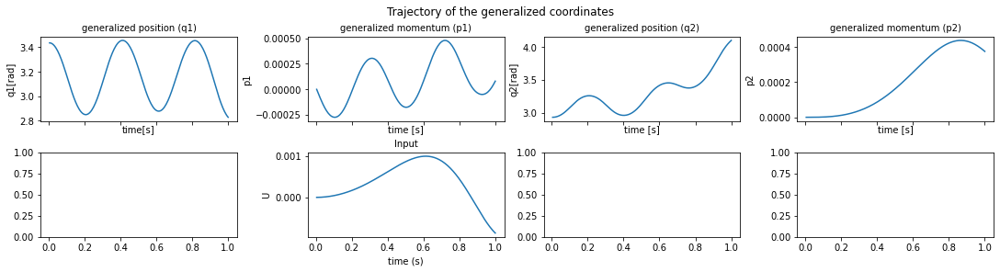

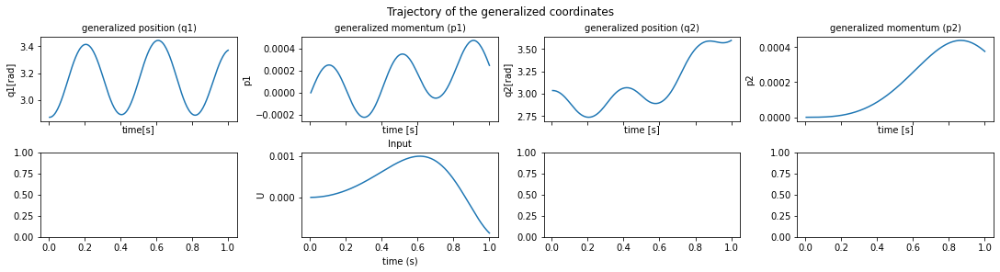

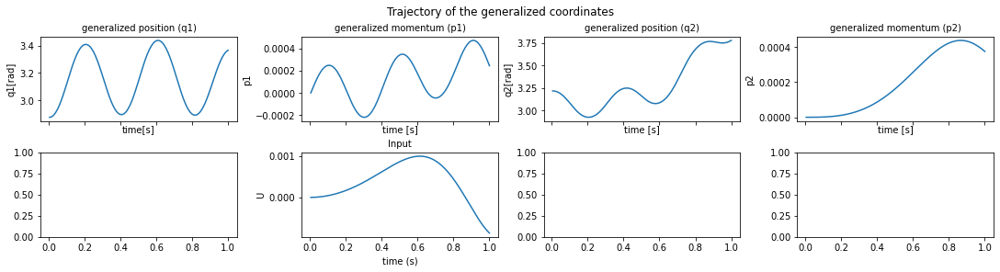

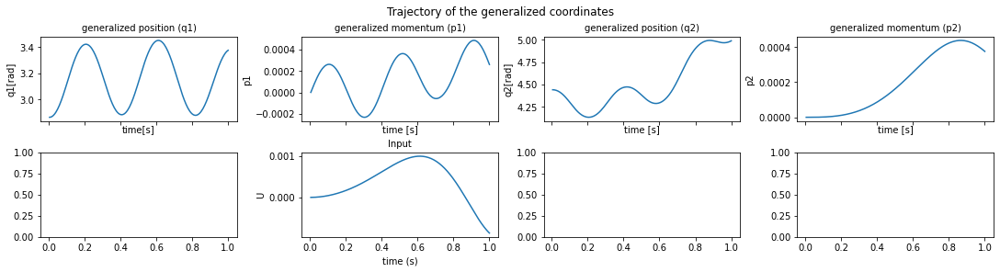

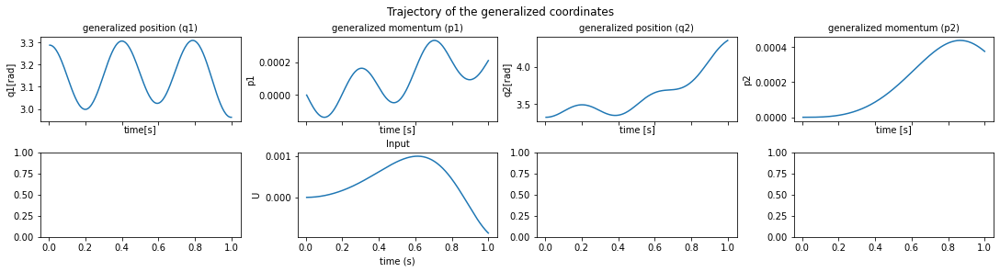

In [131]:
x,t = next(iter(train_loader))
for n in range(5):
  t_eval = t[0,:].cpu().detach()
  q1 = x[n,:,0].cpu().detach()
  p1 = x[n,:,1].cpu().detach()
  q2 = x[n,:,2].cpu().detach()
  p2 = x[n,:,3].cpu().detach()
  u = u_func.forward(t_eval).cpu().detach()
  G = g_func.forward(x[n,:,:4]).cpu().detach()
  plot_traj_furuta_withinput(t_eval, q1, p1, q2, p2,input=u,
                      title = 'Trajectory of the generalized coordinates', coord_type='hamiltonian')

In [ ]:
optimizer = torch.optim.AdamW(model.parameters(), 1e-4, weight_decay=1e-4)

In [ ]:
torch.optim.lr_scheduler.LinearLR(optimizer, start_factor=0.3333333333333333, end_factor=1.0, total_iters=5, last_epoch=- 1, verbose=False)

In [ ]:
max_epochs = 100
begin_decay=80
scheduler = LinearLR(optimizer, start_factor=1.0, end_factor=0.5, total_iters=max_epochs-begin_decay)
lrs = []

for epoch in range(max_epochs):
    if epoch>begin_decay:
        scheduler.step()
    lrs.append(scheduler.get_last_lr())

In [ ]:
plt.plot(lrs)

# Generate, load and save the dataset

In [75]:
device = set_device()
Ts, noise_std, C_q1, C_q2, g, Jr, Lr, Mp, Lp = set_furuta_params(which = 'real') # 'fake'
utype = 'chirp'
u_func = U_FUNC(utype=utype)
u_func.params['T'] = 1.5
u_func.params['f0'] = 0
u_func.params['f1'] = 2 # 4 # 1.4
u_func.params['scale'] = 0.001 # 0.5 # 0.1
gtype='simple'
g_func = G_FUNC(gtype=gtype)
init_method = 'random_closetopi' # 'random_nozero' # 'random_closetopi'
time_steps= 200
num_trajectories = 125
proportion = 0.8
batch_size = 100

cpu


In [76]:
train_loader, test_loader = load_data_device(device, init_method, 
                                            u_func, g_func, time_steps, 
                                            shuffle = False, 
                                            num_trajectories = num_trajectories, 
                                            coord_type = 'hamiltonian', 
                                            proportion = proportion, batch_size = batch_size, 
                                            Ts=Ts, noise_std=noise_std, C_q1=C_q1, C_q2=C_q2, 
                                            g = g, Jr = Jr, Lr = Lr, Mp = Mp, Lp = Lp)

In [341]:
suffix = 'Ts_{:.3f}_Jr_{:.2f}_Lr_{:.2f}_Mp_{:.2f}_Lp_{:.2f}'.format(Ts, Jr, Lr, Mp, Lp)
suffix = suffix + '_'+ utype+ '_resnet_config2_100traj'
print(suffix)

Ts_0.005_Jr_0.00_Lr_0.09_Mp_0.02_Lp_0.13_chirp_resnet_config2_100traj


In [342]:
train_loader_path = PATH + 'data/datasets/train_loader_' + suffix + '.pt'
test_loader_path = PATH + 'data/datasets/test_loader_' + suffix + '.pt'

In [343]:
# torch.save(train_loader, train_loader_path)
# if test_loader is not None:
#     torch.save(test_loader, test_loader_path)

In [344]:
# train_loader = torch.load(train_loader_path)
# test_loader = torch.load(test_loader_path)

# Training

#### Resnet config 1

In [345]:
horizon_list = [20,40,60]

In [346]:
switch_steps = [200,200,200]

In [347]:
H_net = ResNet_config1(resblock_list=[0], num_blocks = 2, input_dim=4, hidden_dim=70, 
                nb_hidden_layers=2, output_dim=1, activation_res='x+sin(x)^2', activation_mlp='x+sin(x)^2')
model = Nes_HDNN(u_func=u_func, G_net=g_func, H_net=H_net, device=device)
model.to(device)

num_params = count_parameters(model)
print(num_params)
weights = [1.0, 5.0, 10.0, 15.0] 

weights_title = ' | weights = ' + str(weights)
print('weights',weights)

print(len(horizon_list))
print(len(switch_steps))
epoch_number = sum(switch_steps)
print('total number of epochs',epoch_number)
sum(switch_steps[:25])
save_prefix = '{:d}e_w_{:05.1f}_{:05.1f}_{:05.1f}_{:05.1f}_p{:d}k_ts_{:1.3f}__'.format(epoch_number,weights[0],weights[1],weights[2],weights[3],int((num_params-num_params%1000)/1000),Ts)
save_prefix = save_prefix+ '_'+ utype+ '_'
print(save_prefix)

10363
weights [1.0, 5.0, 10.0, 15.0]
3
3
total number of epochs 600
600e_w_001.0_005.0_010.0_015.0_p10k_ts_0.005___chirp_


In [348]:
model.H_net.resblock_list

[0]

##### real trajectories batch  = 100

In [353]:
H_net = ResNet_config1(resblock_list=[0], num_blocks = 2, input_dim=4, hidden_dim=70, 
                nb_hidden_layers=2, output_dim=1, activation_res='x+sin(x)^2', activation_mlp='x+sin(x)^2')
model = Nes_HDNN(u_func=u_func, G_net=g_func, H_net=H_net, device=device)
model.to(device)

num_params = count_parameters(model)
print(num_params)
weights = [1.0, 10000.0, 10.0, 10000.0] 

weights_title = ' | weights = ' + str(weights)
print('weights',weights)

print(len(horizon_list))
print(len(switch_steps))
epoch_number = sum(switch_steps)
print('total number of epochs',epoch_number)
sum(switch_steps[:25])
save_prefix = '{:d}e_w_{:05.1f}_{:05.1f}_{:05.1f}_{:05.1f}_p{:d}k_ts_{:1.3f}__'.format(epoch_number,weights[0],weights[1],weights[2],weights[3],int((num_params-num_params%1000)/1000),Ts)
save_prefix = save_prefix+ '_'+ utype+ '_'
print(save_prefix)

10363
weights [1.0, 10000.0, 10.0, 10000.0]
3
3
total number of epochs 600
600e_w_001.0_10000.0_010.0_10000.0_p10k_ts_0.005___chirp_


horizon length : 20


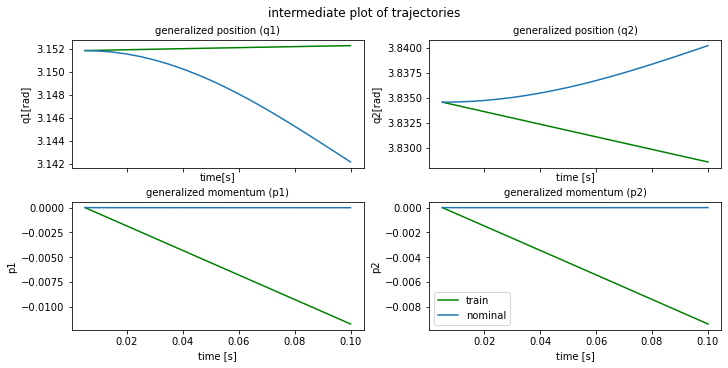

plot time : 0.6076517105102539
epoch    0 | train time 1.42 | train loss 7.162298e+03 | test loss 1.789495e+03 | test time 0.16  
horizon length : 20
epoch    1 | train time 0.81 | train loss 1.746519e+03 
epoch    2 | train time 0.73 | train loss 1.039350e+03 
epoch    3 | train time 0.76 | train loss 1.141168e+03 
epoch    4 | train time 0.71 | train loss 5.239398e+02 
epoch    5 | train time 0.83 | train loss 2.827690e+02 
epoch    6 | train time 0.71 | train loss 3.744129e+02 
epoch    7 | train time 0.77 | train loss 1.147210e+02 
epoch    8 | train time 0.68 | train loss 1.435103e+02 
epoch    9 | train time 0.76 | train loss 2.539403e+02 


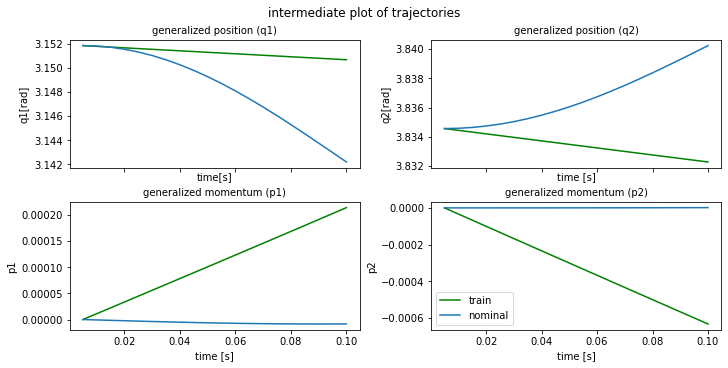

plot time : 0.6006700992584229
epoch   10 | train time 1.41 | train loss 1.667922e+02 | test loss 2.130465e+01 | test time 0.22  
epoch   11 | train time 1.00 | train loss 2.195997e+01 
epoch   12 | train time 1.20 | train loss 1.758214e+02 
epoch   13 | train time 1.26 | train loss 2.511409e+02 
epoch   14 | train time 1.09 | train loss 1.510072e+02 
epoch   15 | train time 1.01 | train loss 9.837109e+01 
epoch   16 | train time 1.09 | train loss 6.513705e+01 
epoch   17 | train time 1.20 | train loss 1.122755e+02 
epoch   18 | train time 0.82 | train loss 1.110434e+02 
epoch   19 | train time 0.93 | train loss 4.672405e+01 


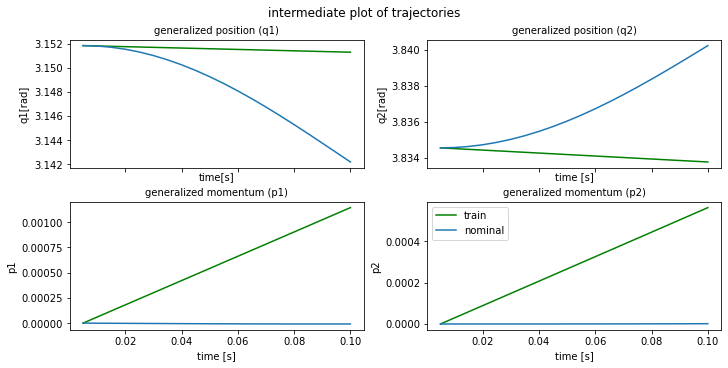

plot time : 0.7775692939758301
epoch   20 | train time 1.65 | train loss 6.639135e+01 | test loss 7.230597e+01 | test time 0.21  
epoch   21 | train time 1.16 | train loss 6.664285e+01 
epoch   22 | train time 1.50 | train loss 5.756032e+01 
epoch   23 | train time 1.24 | train loss 4.354539e+01 
epoch   24 | train time 0.90 | train loss 3.736678e+01 
epoch   25 | train time 0.97 | train loss 3.347511e+01 
epoch   26 | train time 0.99 | train loss 1.666368e+01 
epoch   27 | train time 1.06 | train loss 2.389065e+01 
epoch   28 | train time 1.25 | train loss 2.923420e+01 
epoch   29 | train time 1.07 | train loss 1.327254e+01 


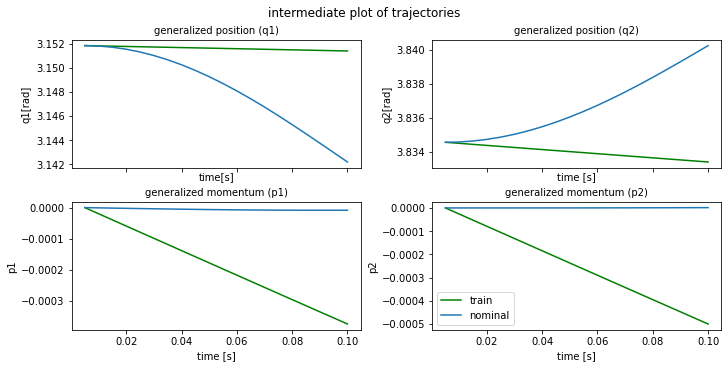

plot time : 0.6621167659759521
epoch   30 | train time 1.55 | train loss 1.048263e+01 | test loss 2.680675e+01 | test time 0.17  
epoch   31 | train time 1.03 | train loss 2.508049e+01 
epoch   32 | train time 1.14 | train loss 1.292170e+01 
epoch   33 | train time 1.23 | train loss 1.324604e+01 
epoch   34 | train time 1.01 | train loss 1.731204e+01 
epoch   35 | train time 1.15 | train loss 1.552799e+01 
epoch   36 | train time 1.26 | train loss 7.134830e+00 
epoch   37 | train time 1.12 | train loss 1.038593e+01 
epoch   38 | train time 0.99 | train loss 5.487798e+00 
epoch   39 | train time 1.03 | train loss 9.733251e+00 


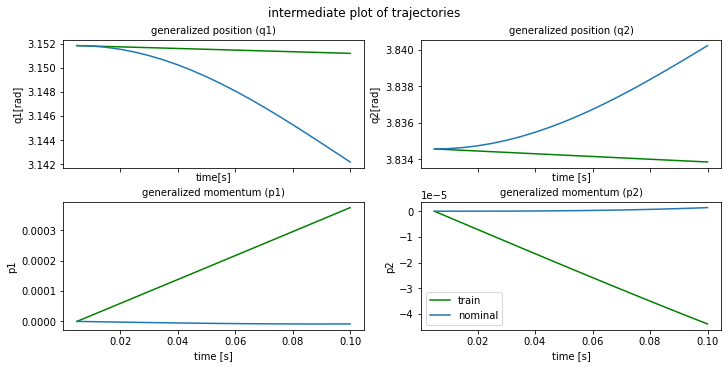

plot time : 0.8615071773529053
epoch   40 | train time 2.14 | train loss 8.411591e+00 | test loss 3.650876e+00 | test time 0.21  
epoch   41 | train time 1.08 | train loss 3.521220e+00 


KeyboardInterrupt: 

In [354]:
stats = train(model = model, 
            Ts = Ts, 
            train_loader = train_loader, 
            test_loader = test_loader, 
            w=torch.tensor(weights, device=device),
            grad_clip = True,
            lr_schedule = True,
            begin_decay = 2250, 
            resnet_config = 1,
            epoch_number = epoch_number, 
            alternating = False,
            horizon = False, 
            horizon_type = 'auto', 
            horizon_list = horizon_list, 
            switch_steps = switch_steps, 
            epochs = epoch_number, 
            loss_type = 'L2weighted2')

##### 100 trajectories batch = 20

horizon length : 20


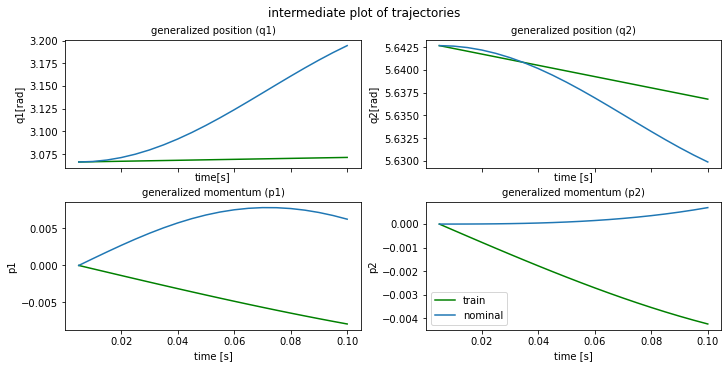

plot time : 0.6209831237792969
epoch    0 | train time 2.37 | train loss 2.915815e-01 | test loss 8.054437e-02 | test time 0.33  
horizon length : 20
epoch    1 | train time 1.69 | train loss 2.470674e-01 
epoch    2 | train time 1.62 | train loss 2.383203e-01 
epoch    3 | train time 1.61 | train loss 2.302475e-01 
epoch    4 | train time 1.62 | train loss 2.187927e-01 
epoch    5 | train time 1.56 | train loss 2.059246e-01 
epoch    6 | train time 1.69 | train loss 1.942655e-01 
epoch    7 | train time 1.51 | train loss 1.759161e-01 
epoch    8 | train time 1.61 | train loss 1.613658e-01 
epoch    9 | train time 1.63 | train loss 1.428040e-01 


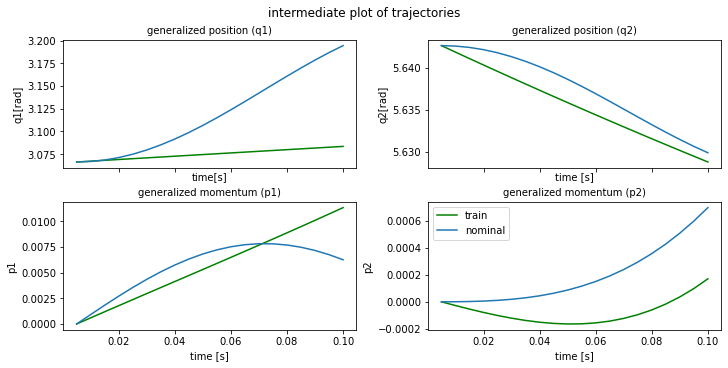

plot time : 0.6034932136535645
epoch   10 | train time 2.37 | train loss 1.265270e-01 | test loss 3.867824e-02 | test time 0.31  
epoch   11 | train time 1.67 | train loss 1.185584e-01 
epoch   12 | train time 1.61 | train loss 1.160942e-01 
epoch   13 | train time 1.60 | train loss 1.150297e-01 
epoch   14 | train time 1.64 | train loss 1.126091e-01 
epoch   15 | train time 1.57 | train loss 1.111582e-01 
epoch   16 | train time 1.58 | train loss 1.096235e-01 
epoch   17 | train time 1.70 | train loss 1.077665e-01 
epoch   18 | train time 1.77 | train loss 1.062284e-01 
epoch   19 | train time 1.98 | train loss 1.048846e-01 


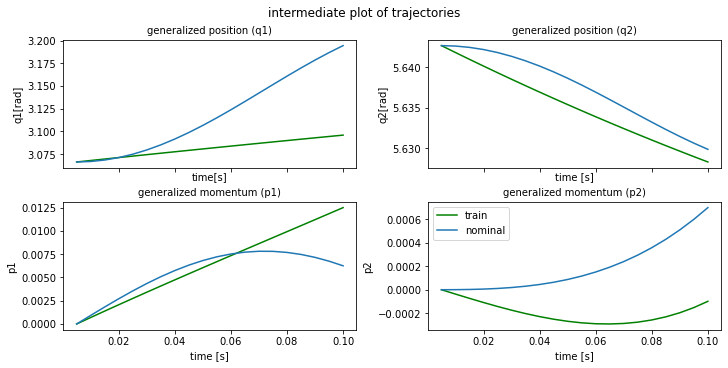

plot time : 0.5830121040344238
epoch   20 | train time 2.14 | train loss 1.033494e-01 | test loss 3.255799e-02 | test time 0.25  
epoch   21 | train time 1.20 | train loss 1.016587e-01 
epoch   22 | train time 2.14 | train loss 9.992997e-02 
epoch   23 | train time 2.23 | train loss 9.833076e-02 
epoch   24 | train time 1.95 | train loss 9.660967e-02 
epoch   25 | train time 1.78 | train loss 9.475815e-02 
epoch   26 | train time 2.01 | train loss 9.295895e-02 
epoch   27 | train time 1.88 | train loss 9.091998e-02 
epoch   28 | train time 2.01 | train loss 8.884759e-02 
epoch   29 | train time 1.85 | train loss 8.670434e-02 


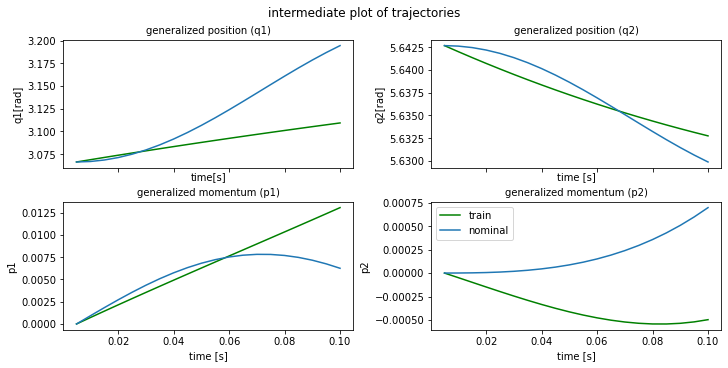

plot time : 0.7850830554962158
epoch   30 | train time 2.52 | train loss 8.494959e-02 | test loss 2.748950e-02 | test time 0.45  
epoch   31 | train time 1.62 | train loss 8.434501e-02 
epoch   32 | train time 1.86 | train loss 8.319279e-02 
epoch   33 | train time 1.87 | train loss 8.122677e-02 
epoch   34 | train time 1.92 | train loss 7.821434e-02 
epoch   35 | train time 2.03 | train loss 7.453169e-02 
epoch   36 | train time 2.00 | train loss 7.299224e-02 
epoch   37 | train time 1.89 | train loss 7.287365e-02 
epoch   38 | train time 2.09 | train loss 7.062441e-02 
epoch   39 | train time 1.96 | train loss 7.184953e-02 


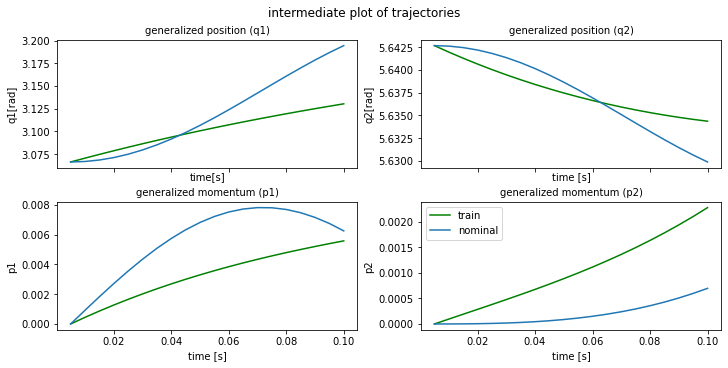

plot time : 0.6816070079803467
epoch   40 | train time 2.59 | train loss 6.967476e-02 | test loss 2.712012e-02 | test time 0.58  
epoch   41 | train time 1.95 | train loss 7.184878e-02 
epoch   42 | train time 2.04 | train loss 6.709381e-02 
epoch   43 | train time 1.87 | train loss 6.427908e-02 
epoch   44 | train time 2.03 | train loss 6.069694e-02 
epoch   45 | train time 2.35 | train loss 5.758028e-02 
epoch   46 | train time 2.06 | train loss 5.645860e-02 
epoch   47 | train time 2.08 | train loss 5.886912e-02 
epoch   48 | train time 2.18 | train loss 5.874773e-02 
epoch   49 | train time 2.17 | train loss 6.252801e-02 


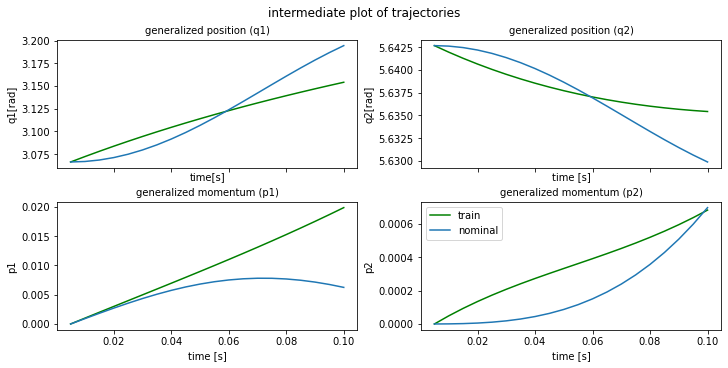

plot time : 0.6111693382263184
epoch   50 | train time 2.62 | train loss 5.962301e-02 | test loss 2.050088e-02 | test time 0.48  
epoch   51 | train time 2.02 | train loss 5.686636e-02 
epoch   52 | train time 2.07 | train loss 5.223089e-02 
epoch   53 | train time 2.07 | train loss 5.295600e-02 
epoch   54 | train time 2.02 | train loss 5.277925e-02 
epoch   55 | train time 2.31 | train loss 5.923517e-02 
epoch   56 | train time 2.39 | train loss 7.522854e-02 
epoch   57 | train time 2.16 | train loss 7.137683e-02 
epoch   58 | train time 2.06 | train loss 6.906525e-02 
epoch   59 | train time 2.35 | train loss 7.469670e-02 


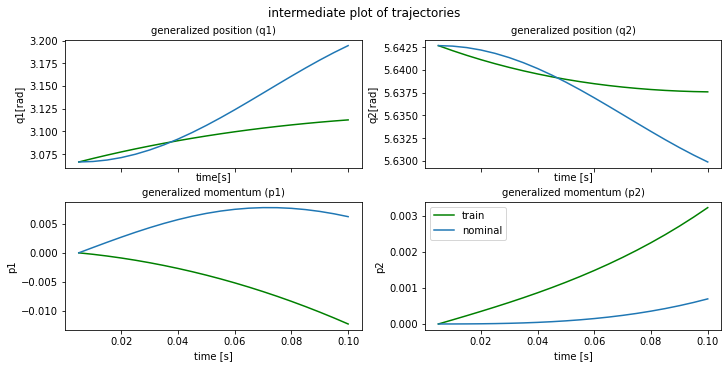

plot time : 0.6880221366882324
epoch   60 | train time 2.69 | train loss 6.911259e-02 | test loss 3.661140e-02 | test time 0.56  
epoch   61 | train time 1.94 | train loss 7.341309e-02 
epoch   62 | train time 2.26 | train loss 6.173696e-02 
epoch   63 | train time 2.04 | train loss 5.346106e-02 
epoch   64 | train time 2.19 | train loss 4.961641e-02 
epoch   65 | train time 2.01 | train loss 4.728185e-02 
epoch   66 | train time 2.03 | train loss 4.533953e-02 
epoch   67 | train time 2.55 | train loss 4.337952e-02 
epoch   68 | train time 2.53 | train loss 4.339745e-02 
epoch   69 | train time 2.55 | train loss 4.302397e-02 


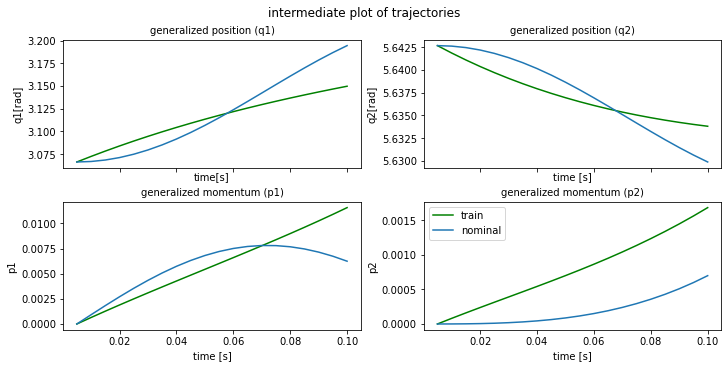

plot time : 0.8506944179534912
epoch   70 | train time 2.83 | train loss 4.111136e-02 | test loss 1.399628e-02 | test time 0.45  
epoch   71 | train time 2.30 | train loss 4.036281e-02 
epoch   72 | train time 1.93 | train loss 4.206791e-02 
epoch   73 | train time 2.24 | train loss 3.882318e-02 
epoch   74 | train time 2.21 | train loss 3.782324e-02 
epoch   75 | train time 2.25 | train loss 4.076321e-02 
epoch   76 | train time 2.54 | train loss 4.094144e-02 
epoch   77 | train time 2.27 | train loss 4.007344e-02 
epoch   78 | train time 2.16 | train loss 4.052813e-02 
epoch   79 | train time 2.32 | train loss 4.183118e-02 


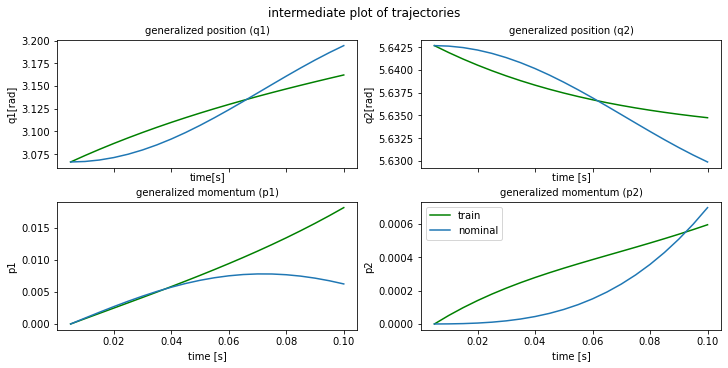

plot time : 0.8579795360565186
epoch   80 | train time 3.12 | train loss 4.548205e-02 | test loss 1.532157e-02 | test time 0.50  
epoch   81 | train time 2.47 | train loss 5.915795e-02 
epoch   82 | train time 1.86 | train loss 7.030341e-02 
epoch   83 | train time 2.25 | train loss 7.903923e-02 
epoch   84 | train time 2.54 | train loss 5.630504e-02 
epoch   85 | train time 1.91 | train loss 5.040628e-02 
epoch   86 | train time 2.12 | train loss 5.688583e-02 
epoch   87 | train time 2.52 | train loss 5.124962e-02 
epoch   88 | train time 2.79 | train loss 5.199361e-02 
epoch   89 | train time 2.03 | train loss 4.074674e-02 


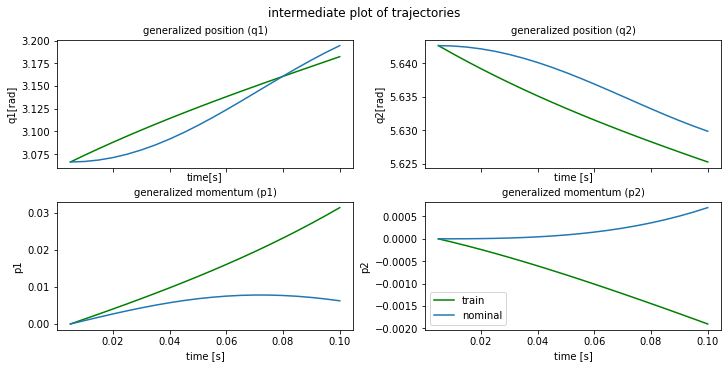

plot time : 0.7656481266021729
epoch   90 | train time 2.78 | train loss 4.066961e-02 | test loss 1.528272e-02 | test time 0.39  
epoch   91 | train time 1.89 | train loss 3.793714e-02 
epoch   92 | train time 2.41 | train loss 3.709213e-02 
epoch   93 | train time 2.00 | train loss 3.704532e-02 
epoch   94 | train time 2.24 | train loss 3.412821e-02 
epoch   95 | train time 2.02 | train loss 3.373918e-02 
epoch   96 | train time 1.91 | train loss 3.383335e-02 
epoch   97 | train time 2.09 | train loss 3.171310e-02 
epoch   98 | train time 2.01 | train loss 3.122514e-02 
epoch   99 | train time 2.12 | train loss 3.537059e-02 


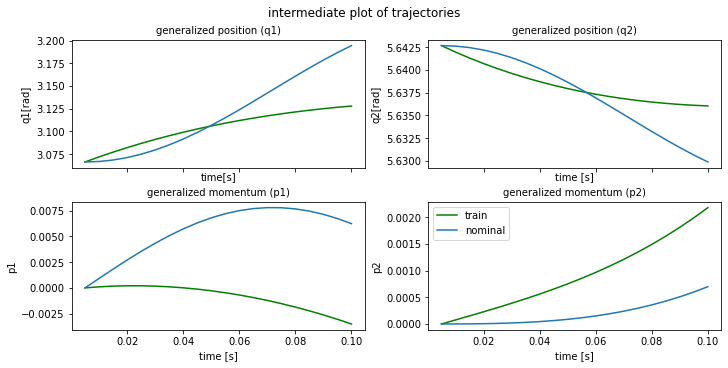

plot time : 0.578669548034668
epoch  100 | train time 2.58 | train loss 8.256629e-02 | test loss 9.468944e-02 | test time 0.35  
epoch  101 | train time 1.93 | train loss 1.129122e-01 
epoch  102 | train time 1.96 | train loss 4.026084e-02 
epoch  103 | train time 1.84 | train loss 3.716284e-02 
epoch  104 | train time 2.01 | train loss 4.223807e-02 
epoch  105 | train time 1.86 | train loss 4.547032e-02 
epoch  106 | train time 2.06 | train loss 4.917212e-02 
epoch  107 | train time 1.90 | train loss 6.324350e-02 
epoch  108 | train time 1.87 | train loss 6.678351e-02 
epoch  109 | train time 2.15 | train loss 8.367225e-02 


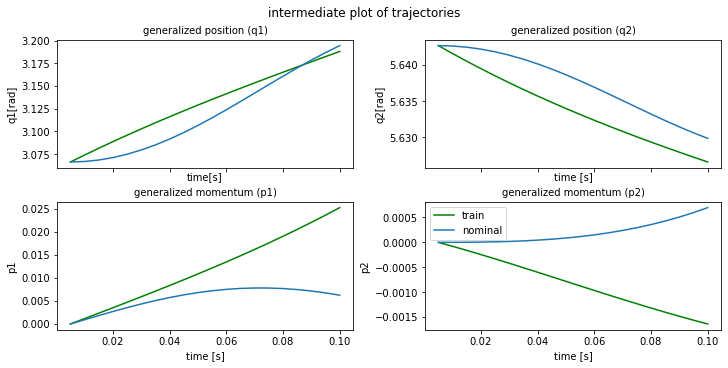

plot time : 0.5726728439331055
epoch  110 | train time 2.58 | train loss 4.049159e-02 | test loss 1.245876e-02 | test time 0.34  
epoch  111 | train time 2.04 | train loss 3.553361e-02 
epoch  112 | train time 1.83 | train loss 3.327999e-02 
epoch  113 | train time 1.96 | train loss 3.275784e-02 
epoch  114 | train time 2.14 | train loss 3.145332e-02 
epoch  115 | train time 1.92 | train loss 3.175064e-02 
epoch  116 | train time 1.83 | train loss 3.060059e-02 
epoch  117 | train time 1.85 | train loss 2.852424e-02 
epoch  118 | train time 1.97 | train loss 2.842291e-02 
epoch  119 | train time 2.11 | train loss 2.933947e-02 


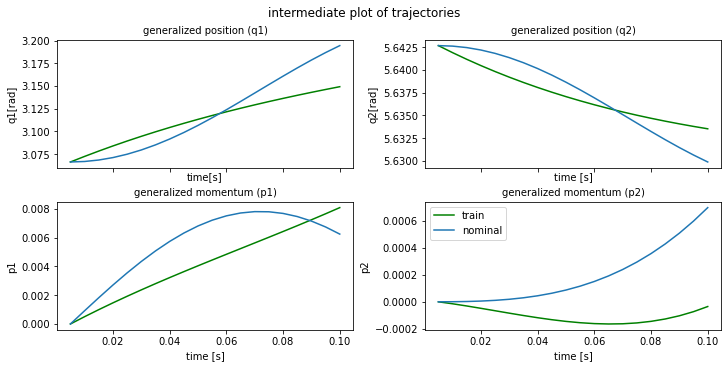

plot time : 0.5976581573486328
epoch  120 | train time 2.65 | train loss 2.885412e-02 | test loss 9.211039e-03 | test time 0.28  
epoch  121 | train time 1.94 | train loss 2.855110e-02 
epoch  122 | train time 1.82 | train loss 2.948402e-02 
epoch  123 | train time 1.77 | train loss 3.015677e-02 
epoch  124 | train time 1.87 | train loss 2.859566e-02 
epoch  125 | train time 1.97 | train loss 2.973508e-02 
epoch  126 | train time 1.96 | train loss 2.941899e-02 
epoch  127 | train time 1.92 | train loss 2.978776e-02 
epoch  128 | train time 2.24 | train loss 3.073777e-02 
epoch  129 | train time 2.10 | train loss 4.141973e-02 


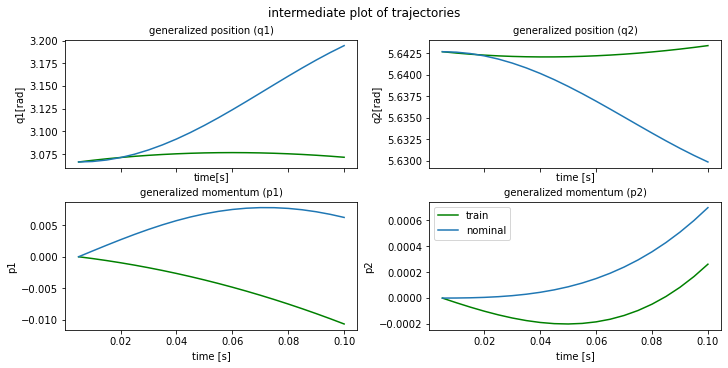

plot time : 0.7650222778320312
epoch  130 | train time 2.62 | train loss 3.980602e-02 | test loss 1.274759e-02 | test time 0.39  
epoch  131 | train time 1.84 | train loss 4.064180e-02 
epoch  132 | train time 1.96 | train loss 3.724183e-02 
epoch  133 | train time 1.89 | train loss 3.369149e-02 
epoch  134 | train time 1.81 | train loss 3.505963e-02 
epoch  135 | train time 2.05 | train loss 3.529519e-02 
epoch  136 | train time 2.29 | train loss 3.354052e-02 
epoch  137 | train time 2.25 | train loss 3.243963e-02 
epoch  138 | train time 2.44 | train loss 3.186495e-02 
epoch  139 | train time 1.80 | train loss 3.358838e-02 


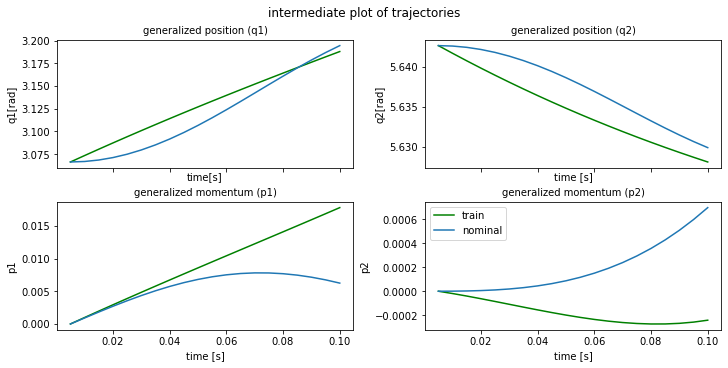

plot time : 0.648188591003418
epoch  140 | train time 2.61 | train loss 3.174904e-02 | test loss 1.031756e-02 | test time 0.32  
epoch  141 | train time 1.73 | train loss 2.904612e-02 
epoch  142 | train time 1.87 | train loss 2.872723e-02 
epoch  143 | train time 1.97 | train loss 3.157827e-02 
epoch  144 | train time 1.93 | train loss 2.802501e-02 
epoch  145 | train time 1.77 | train loss 2.416922e-02 
epoch  146 | train time 1.90 | train loss 2.263089e-02 
epoch  147 | train time 1.88 | train loss 2.173209e-02 
epoch  148 | train time 1.97 | train loss 2.082343e-02 
epoch  149 | train time 1.95 | train loss 2.070849e-02 


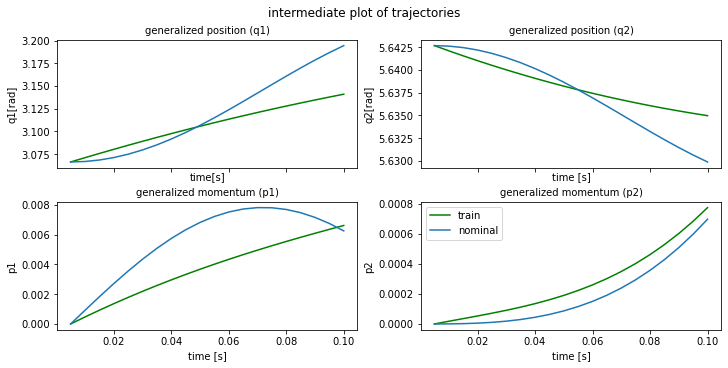

plot time : 0.7767562866210938
epoch  150 | train time 2.88 | train loss 1.978813e-02 | test loss 6.335084e-03 | test time 0.39  
epoch  151 | train time 1.91 | train loss 1.849321e-02 
epoch  152 | train time 1.79 | train loss 1.872454e-02 
epoch  153 | train time 1.94 | train loss 1.896142e-02 
epoch  154 | train time 1.99 | train loss 1.808484e-02 
epoch  155 | train time 2.04 | train loss 1.634113e-02 
epoch  156 | train time 1.83 | train loss 1.642295e-02 
epoch  157 | train time 1.91 | train loss 1.880184e-02 
epoch  158 | train time 2.04 | train loss 1.781785e-02 
epoch  159 | train time 1.93 | train loss 1.585278e-02 


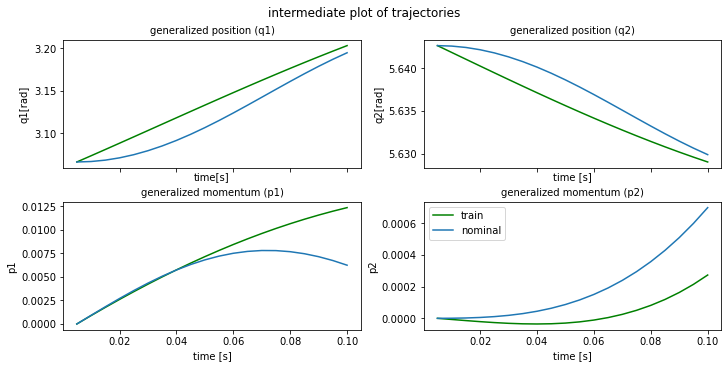

plot time : 0.5547692775726318
epoch  160 | train time 2.48 | train loss 1.907051e-02 | test loss 9.113442e-03 | test time 0.36  
epoch  161 | train time 2.07 | train loss 1.762471e-02 
epoch  162 | train time 2.09 | train loss 1.643899e-02 
epoch  163 | train time 1.86 | train loss 1.644846e-02 
epoch  164 | train time 1.86 | train loss 1.672486e-02 
epoch  165 | train time 2.00 | train loss 1.512352e-02 
epoch  166 | train time 2.02 | train loss 1.434559e-02 
epoch  167 | train time 2.20 | train loss 1.367008e-02 
epoch  168 | train time 2.21 | train loss 2.994184e-02 
epoch  169 | train time 2.06 | train loss 9.823043e-02 


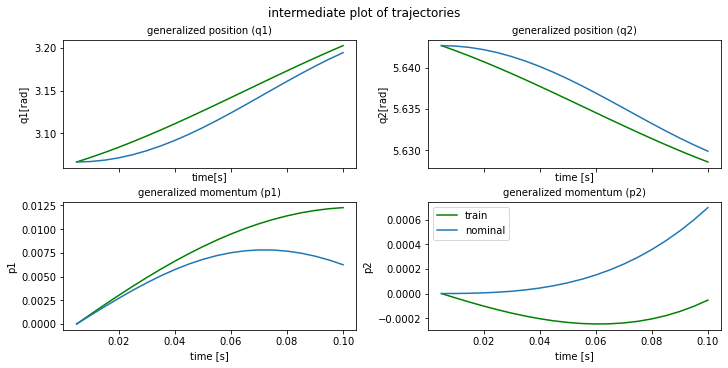

plot time : 0.49861955642700195
epoch  170 | train time 1.96 | train loss 3.011299e-02 | test loss 7.777760e-03 | test time 0.28  
epoch  171 | train time 1.59 | train loss 2.518818e-02 
epoch  172 | train time 1.55 | train loss 2.912090e-02 
epoch  173 | train time 1.51 | train loss 3.233396e-02 
epoch  174 | train time 1.35 | train loss 3.324802e-02 
epoch  175 | train time 1.99 | train loss 1.984878e-02 
epoch  176 | train time 2.30 | train loss 1.526398e-02 
epoch  177 | train time 2.32 | train loss 1.326993e-02 
epoch  178 | train time 1.90 | train loss 1.082903e-02 
epoch  179 | train time 1.97 | train loss 1.063903e-02 


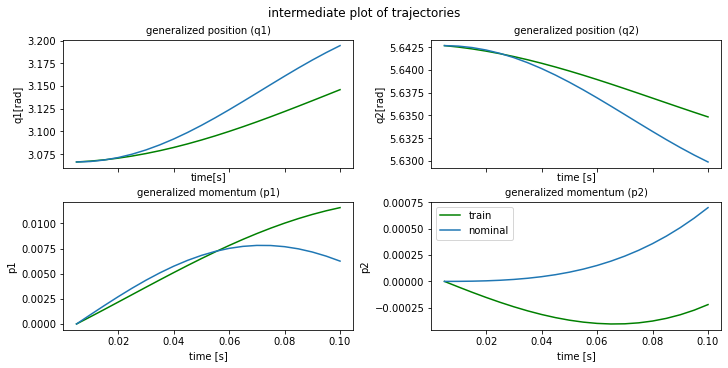

plot time : 0.7905306816101074
epoch  180 | train time 2.78 | train loss 9.770241e-03 | test loss 3.313742e-03 | test time 0.49  
epoch  181 | train time 1.98 | train loss 9.808127e-03 
epoch  182 | train time 1.78 | train loss 1.076968e-02 
epoch  183 | train time 1.97 | train loss 9.384088e-03 
epoch  184 | train time 1.59 | train loss 6.906215e-03 
epoch  185 | train time 2.16 | train loss 7.458589e-03 
epoch  186 | train time 2.44 | train loss 7.213980e-03 
epoch  187 | train time 2.21 | train loss 1.137803e-02 
epoch  188 | train time 1.64 | train loss 2.093450e-02 
epoch  189 | train time 1.74 | train loss 2.109982e-02 


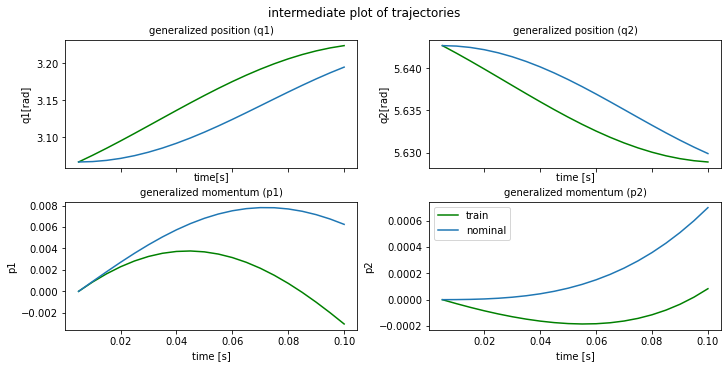

plot time : 0.5056135654449463
epoch  190 | train time 2.21 | train loss 1.848226e-02 | test loss 6.601067e-03 | test time 0.34  
epoch  191 | train time 1.72 | train loss 1.868407e-02 
epoch  192 | train time 2.28 | train loss 1.629291e-02 
epoch  193 | train time 1.88 | train loss 1.908811e-02 
epoch  194 | train time 2.27 | train loss 1.676636e-02 
epoch  195 | train time 2.70 | train loss 1.592198e-02 
epoch  196 | train time 2.66 | train loss 1.468974e-02 
epoch  197 | train time 2.92 | train loss 1.698076e-02 
epoch  198 | train time 2.85 | train loss 1.595565e-02 
epoch  199 | train time 3.60 | train loss 1.378389e-02 


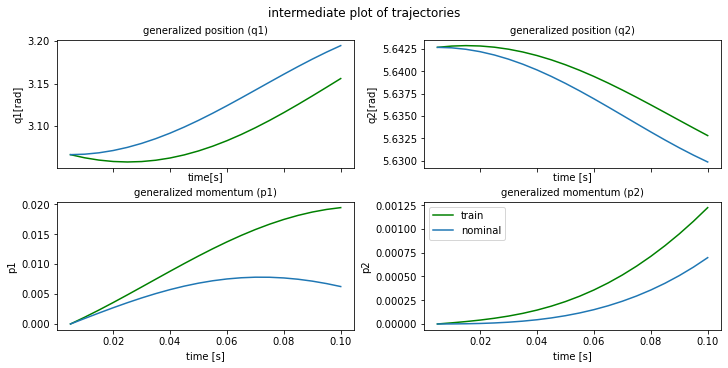

plot time : 1.1907734870910645
epoch  200 | train time 4.14 | train loss 1.408139e-02 | test loss 5.719009e-03 | test time 0.40  
epoch  201 | train time 2.14 | train loss 1.588494e-02 
epoch  202 | train time 2.16 | train loss 1.421503e-02 
epoch  203 | train time 2.19 | train loss 1.353467e-02 
epoch  204 | train time 1.61 | train loss 1.303370e-02 
epoch  205 | train time 1.95 | train loss 1.476790e-02 
epoch  206 | train time 1.68 | train loss 1.383735e-02 
epoch  207 | train time 1.89 | train loss 1.265415e-02 
epoch  208 | train time 2.13 | train loss 1.176857e-02 
epoch  209 | train time 1.53 | train loss 1.473792e-02 


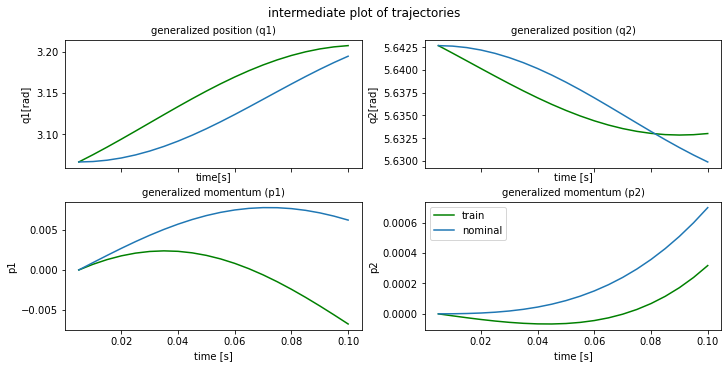

plot time : 0.6436967849731445
epoch  210 | train time 2.14 | train loss 9.508913e-03 | test loss 2.772042e-03 | test time 0.34  
epoch  211 | train time 1.78 | train loss 7.023426e-03 
epoch  212 | train time 1.82 | train loss 5.505305e-03 
epoch  213 | train time 1.44 | train loss 5.486911e-03 
epoch  214 | train time 1.60 | train loss 5.135918e-03 
epoch  215 | train time 1.93 | train loss 5.274257e-03 
epoch  216 | train time 1.59 | train loss 4.804956e-03 
epoch  217 | train time 1.53 | train loss 3.827528e-03 
epoch  218 | train time 1.73 | train loss 4.535553e-03 
epoch  219 | train time 1.59 | train loss 3.540732e-03 


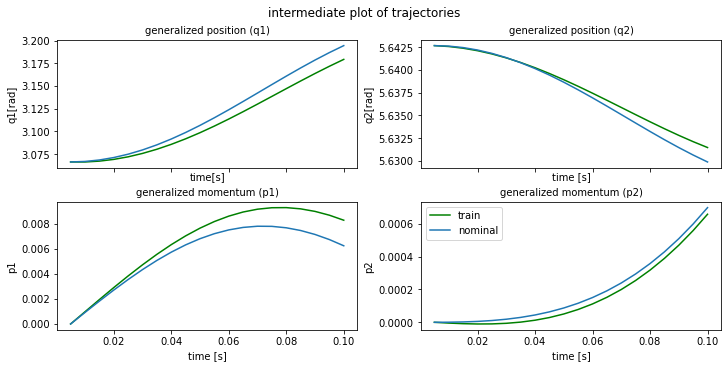

plot time : 0.5782811641693115
epoch  220 | train time 2.22 | train loss 2.716094e-03 | test loss 8.794418e-04 | test time 0.47  
epoch  221 | train time 1.45 | train loss 2.738303e-03 
epoch  222 | train time 1.65 | train loss 3.991438e-03 
epoch  223 | train time 1.81 | train loss 5.631412e-03 
epoch  224 | train time 1.51 | train loss 1.687249e-02 
epoch  225 | train time 1.80 | train loss 2.084249e-02 
epoch  226 | train time 1.70 | train loss 1.749203e-02 
epoch  227 | train time 2.26 | train loss 4.984485e-03 
epoch  228 | train time 2.21 | train loss 4.895648e-03 
epoch  229 | train time 2.25 | train loss 5.264022e-03 


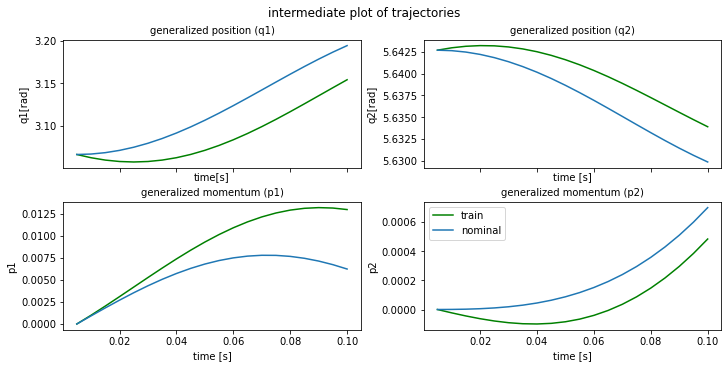

plot time : 0.8448693752288818
epoch  230 | train time 3.30 | train loss 4.244814e-03 | test loss 1.009931e-03 | test time 0.48  
epoch  231 | train time 2.30 | train loss 2.529157e-03 
epoch  232 | train time 2.30 | train loss 3.224995e-03 
epoch  233 | train time 2.24 | train loss 3.772025e-03 
epoch  234 | train time 1.92 | train loss 5.747337e-03 
epoch  235 | train time 1.96 | train loss 5.081949e-03 
epoch  236 | train time 1.92 | train loss 3.549696e-03 
epoch  237 | train time 1.90 | train loss 1.609677e-03 
epoch  238 | train time 1.95 | train loss 1.330362e-03 
epoch  239 | train time 2.21 | train loss 1.424871e-03 


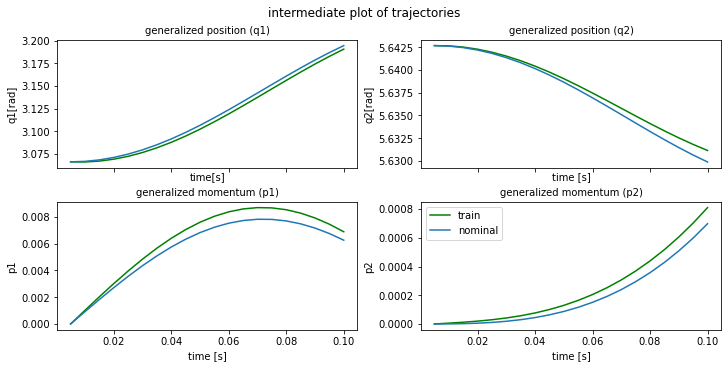

plot time : 0.6129546165466309
epoch  240 | train time 2.51 | train loss 1.062605e-03 | test loss 8.885140e-04 | test time 0.52  
epoch  241 | train time 2.03 | train loss 1.824466e-03 
epoch  242 | train time 1.80 | train loss 3.035171e-03 
epoch  243 | train time 1.99 | train loss 5.009865e-03 
epoch  244 | train time 2.22 | train loss 5.519374e-03 
epoch  245 | train time 2.16 | train loss 1.808585e-02 
epoch  246 | train time 2.20 | train loss 4.966629e-03 
epoch  247 | train time 1.91 | train loss 2.136045e-03 
epoch  248 | train time 1.89 | train loss 3.782963e-03 
epoch  249 | train time 1.97 | train loss 1.090034e-02 


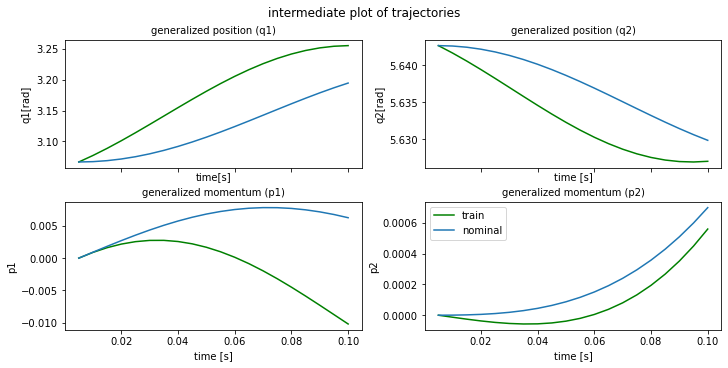

plot time : 0.9124751091003418
epoch  250 | train time 4.08 | train loss 1.919197e-02 | test loss 9.468890e-03 | test time 0.49  
epoch  251 | train time 2.11 | train loss 2.917134e-02 
epoch  252 | train time 2.18 | train loss 1.653883e-02 
epoch  253 | train time 1.87 | train loss 2.152714e-02 
epoch  254 | train time 2.50 | train loss 1.067630e-02 
epoch  255 | train time 3.04 | train loss 6.320700e-03 
epoch  256 | train time 1.93 | train loss 5.609832e-03 
epoch  257 | train time 1.89 | train loss 4.708224e-03 
epoch  258 | train time 2.01 | train loss 3.646190e-03 
epoch  259 | train time 1.97 | train loss 3.315413e-03 


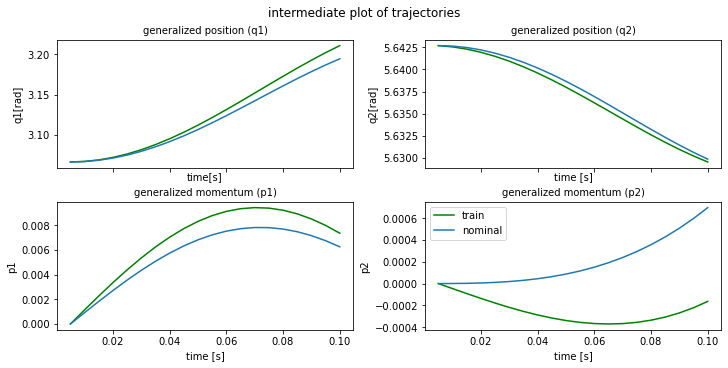

plot time : 0.7448220252990723
epoch  260 | train time 2.68 | train loss 3.039390e-03 | test loss 8.157395e-04 | test time 0.41  
epoch  261 | train time 2.09 | train loss 2.443357e-03 
epoch  262 | train time 2.07 | train loss 2.730362e-03 
epoch  263 | train time 2.03 | train loss 3.664251e-03 
epoch  264 | train time 1.87 | train loss 4.079470e-03 
epoch  265 | train time 2.02 | train loss 4.854034e-03 
epoch  266 | train time 2.06 | train loss 1.142491e-02 
epoch  267 | train time 2.04 | train loss 1.155750e-02 
epoch  268 | train time 2.15 | train loss 1.115340e-02 
epoch  269 | train time 2.18 | train loss 1.209297e-02 


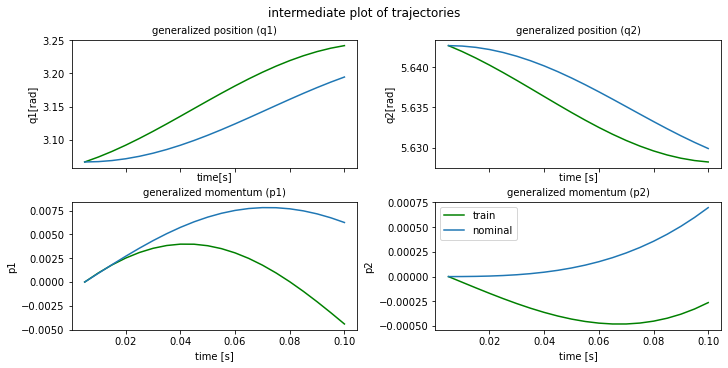

plot time : 0.6312241554260254
epoch  270 | train time 2.66 | train loss 1.212506e-02 | test loss 1.446599e-03 | test time 0.29  
epoch  271 | train time 2.14 | train loss 1.309836e-02 
epoch  272 | train time 1.92 | train loss 8.836141e-03 
epoch  273 | train time 1.99 | train loss 9.741455e-03 
epoch  274 | train time 2.00 | train loss 1.435811e-02 
epoch  275 | train time 1.92 | train loss 7.993503e-03 
epoch  276 | train time 2.04 | train loss 1.333748e-02 
epoch  277 | train time 2.13 | train loss 7.273085e-03 
epoch  278 | train time 2.01 | train loss 5.722466e-03 
epoch  279 | train time 1.93 | train loss 3.642449e-03 


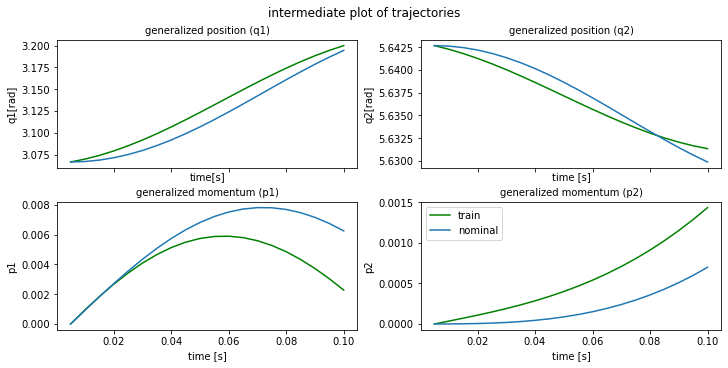

plot time : 0.8206338882446289
epoch  280 | train time 2.93 | train loss 2.354562e-03 | test loss 7.988654e-04 | test time 0.31  
epoch  281 | train time 2.00 | train loss 1.869628e-03 
epoch  282 | train time 2.07 | train loss 1.681349e-03 
epoch  283 | train time 1.96 | train loss 1.340804e-03 
epoch  284 | train time 2.02 | train loss 1.136589e-03 
epoch  285 | train time 2.10 | train loss 9.628097e-04 
epoch  286 | train time 1.99 | train loss 6.563983e-04 
epoch  287 | train time 2.09 | train loss 5.750265e-04 
epoch  288 | train time 2.04 | train loss 7.282521e-04 
epoch  289 | train time 1.98 | train loss 1.201339e-03 


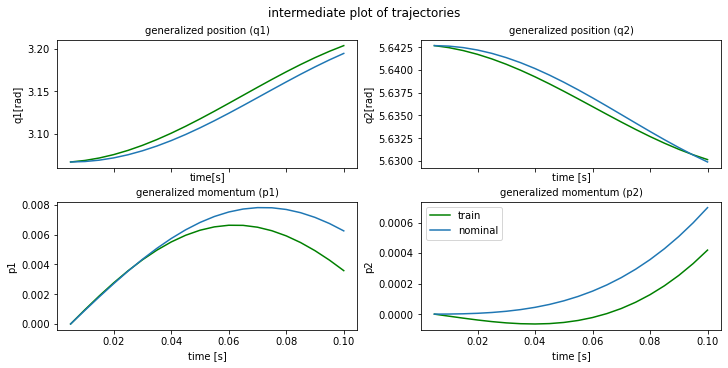

plot time : 0.7266643047332764
epoch  290 | train time 2.85 | train loss 1.322202e-03 | test loss 3.126695e-04 | test time 0.41  
epoch  291 | train time 1.97 | train loss 7.460971e-04 
epoch  292 | train time 2.00 | train loss 4.365013e-04 
epoch  293 | train time 1.95 | train loss 4.388771e-04 
epoch  294 | train time 2.04 | train loss 9.337624e-04 
epoch  295 | train time 1.95 | train loss 2.157090e-03 
epoch  296 | train time 2.03 | train loss 3.073517e-03 
epoch  297 | train time 2.04 | train loss 2.837334e-03 
epoch  298 | train time 1.99 | train loss 4.056814e-03 
epoch  299 | train time 1.96 | train loss 2.000825e-02 


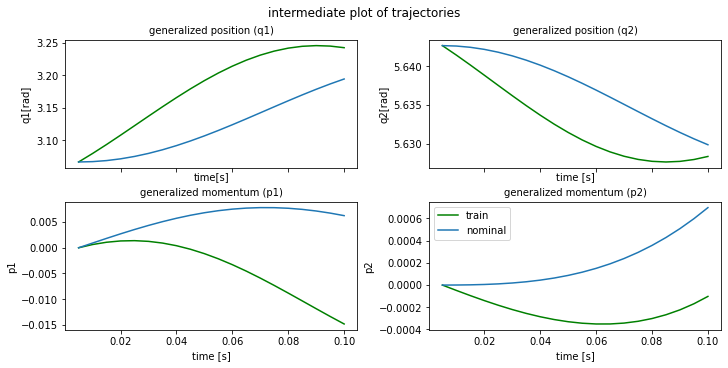

plot time : 0.7076075077056885
epoch  300 | train time 2.73 | train loss 6.853721e-02 | test loss 3.675454e-02 | test time 0.38  
epoch  301 | train time 1.89 | train loss 1.265300e-01 
epoch  302 | train time 1.99 | train loss 5.657571e-02 
epoch  303 | train time 2.09 | train loss 7.516322e-02 
epoch  304 | train time 2.15 | train loss 6.841776e-02 
epoch  305 | train time 2.17 | train loss 5.855222e-02 
epoch  306 | train time 1.89 | train loss 2.906875e-02 
epoch  307 | train time 1.58 | train loss 2.413770e-02 
epoch  308 | train time 1.71 | train loss 1.507595e-02 
epoch  309 | train time 1.72 | train loss 1.032251e-02 


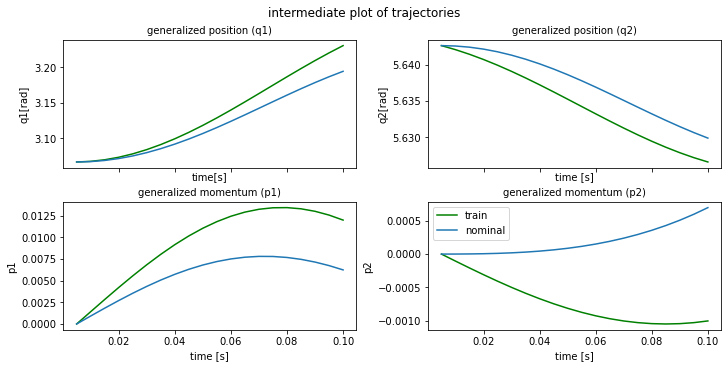

plot time : 0.5194361209869385
epoch  310 | train time 1.86 | train loss 7.551955e-03 | test loss 2.908194e-03 | test time 0.29  
epoch  311 | train time 1.72 | train loss 5.890750e-03 
epoch  312 | train time 1.65 | train loss 5.091002e-03 
epoch  313 | train time 1.58 | train loss 3.928967e-03 
epoch  314 | train time 1.45 | train loss 3.105714e-03 
epoch  315 | train time 1.64 | train loss 2.391266e-03 
epoch  316 | train time 2.84 | train loss 1.777537e-03 
epoch  317 | train time 2.35 | train loss 1.468726e-03 
epoch  318 | train time 2.01 | train loss 1.193430e-03 
epoch  319 | train time 2.82 | train loss 1.051192e-03 


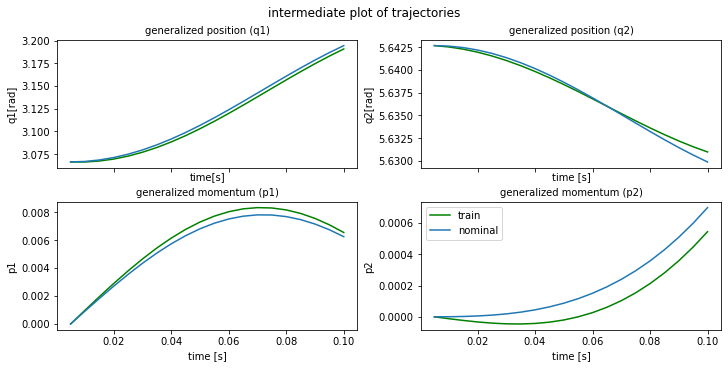

plot time : 0.7732911109924316
epoch  320 | train time 3.28 | train loss 8.355567e-04 | test loss 2.500529e-04 | test time 0.56  
epoch  321 | train time 2.62 | train loss 7.291264e-04 
epoch  322 | train time 2.40 | train loss 6.674326e-04 
epoch  323 | train time 2.85 | train loss 5.386848e-04 
epoch  324 | train time 3.02 | train loss 5.776889e-04 
epoch  325 | train time 2.69 | train loss 5.929335e-04 
epoch  326 | train time 2.19 | train loss 4.747543e-04 
epoch  327 | train time 2.50 | train loss 4.016192e-04 
epoch  328 | train time 2.13 | train loss 5.187999e-04 
epoch  329 | train time 2.55 | train loss 7.691682e-04 


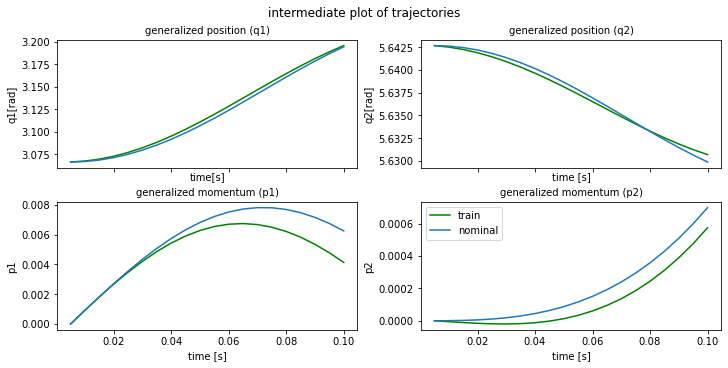

plot time : 0.7985401153564453
epoch  330 | train time 3.09 | train loss 6.556306e-04 | test loss 1.169678e-04 | test time 0.44  
epoch  331 | train time 2.40 | train loss 3.426586e-04 
epoch  332 | train time 2.17 | train loss 3.089502e-04 
epoch  333 | train time 2.10 | train loss 4.569197e-04 
epoch  334 | train time 2.56 | train loss 1.085291e-03 
epoch  335 | train time 2.52 | train loss 1.583669e-03 
epoch  336 | train time 2.55 | train loss 1.105653e-03 
epoch  337 | train time 1.86 | train loss 4.525476e-04 
epoch  338 | train time 2.70 | train loss 2.685409e-04 
epoch  339 | train time 3.10 | train loss 2.753408e-04 


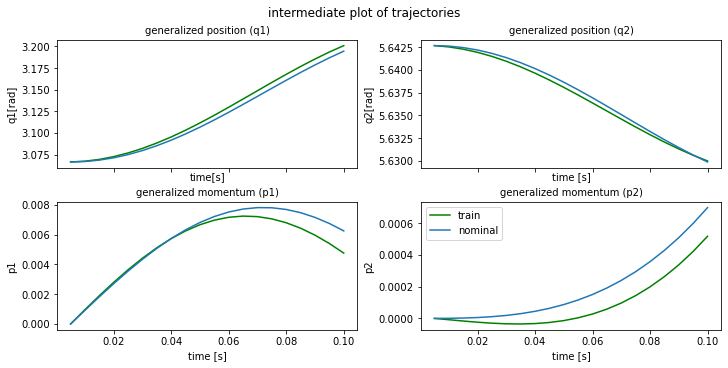

plot time : 0.8142483234405518
epoch  340 | train time 2.61 | train loss 4.590155e-04 | test loss 3.918895e-04 | test time 0.39  
epoch  341 | train time 2.36 | train loss 8.432815e-04 
epoch  342 | train time 2.10 | train loss 1.280103e-03 
epoch  343 | train time 1.82 | train loss 1.755029e-03 
epoch  344 | train time 1.57 | train loss 2.259141e-03 
epoch  345 | train time 2.09 | train loss 2.166585e-03 
epoch  346 | train time 1.92 | train loss 9.642634e-04 
epoch  347 | train time 2.01 | train loss 5.794201e-04 
epoch  348 | train time 1.79 | train loss 7.126040e-04 
epoch  349 | train time 1.83 | train loss 4.862852e-04 


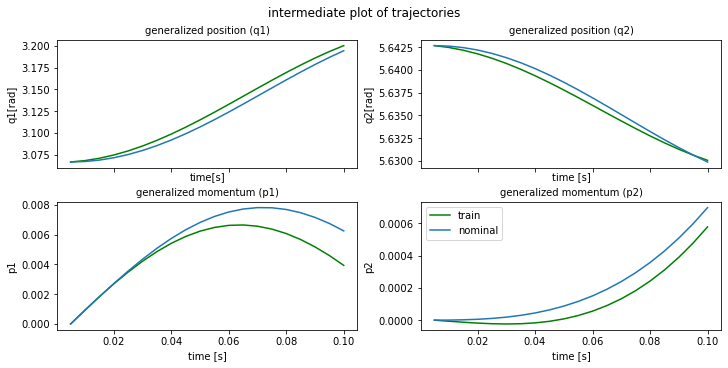

plot time : 0.5797746181488037
epoch  350 | train time 2.32 | train loss 8.806473e-04 | test loss 8.564939e-04 | test time 0.50  
epoch  351 | train time 1.86 | train loss 1.690666e-03 
epoch  352 | train time 1.80 | train loss 1.805034e-03 
epoch  353 | train time 2.17 | train loss 1.262922e-03 
epoch  354 | train time 2.09 | train loss 6.788507e-04 
epoch  355 | train time 1.94 | train loss 3.391419e-04 
epoch  356 | train time 1.73 | train loss 2.648648e-04 
epoch  357 | train time 1.77 | train loss 2.569738e-04 
epoch  358 | train time 1.83 | train loss 2.535752e-04 
epoch  359 | train time 1.77 | train loss 3.852243e-04 


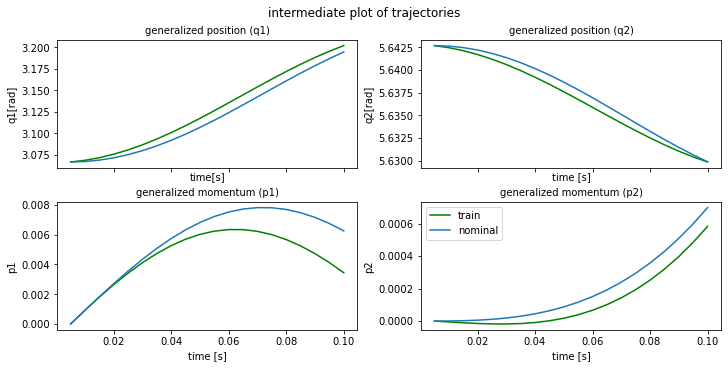

plot time : 0.6860852241516113
epoch  360 | train time 2.55 | train loss 7.252832e-04 | test loss 7.032289e-04 | test time 0.55  
epoch  361 | train time 2.05 | train loss 1.265022e-03 
epoch  362 | train time 2.31 | train loss 2.147249e-03 
epoch  363 | train time 1.65 | train loss 3.204631e-03 
epoch  364 | train time 1.49 | train loss 9.037615e-03 
epoch  365 | train time 1.86 | train loss 1.998327e-02 
epoch  366 | train time 2.65 | train loss 1.083259e-02 
epoch  367 | train time 2.17 | train loss 3.394076e-03 
epoch  368 | train time 2.20 | train loss 1.319008e-03 
epoch  369 | train time 2.01 | train loss 1.208863e-03 


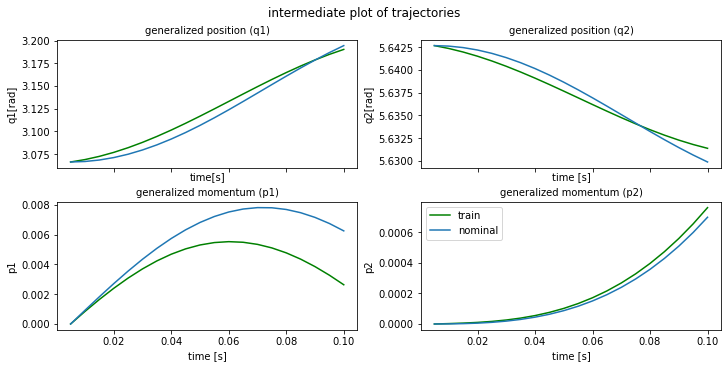

plot time : 0.8555338382720947
epoch  370 | train time 2.92 | train loss 1.198769e-03 | test loss 3.448985e-04 | test time 0.45  
epoch  371 | train time 2.60 | train loss 1.350323e-03 
epoch  372 | train time 2.10 | train loss 1.301980e-03 
epoch  373 | train time 1.97 | train loss 2.299071e-03 
epoch  374 | train time 1.86 | train loss 2.171123e-03 
epoch  375 | train time 1.81 | train loss 3.056964e-03 
epoch  376 | train time 2.02 | train loss 6.130569e-03 
epoch  377 | train time 1.97 | train loss 2.099929e-02 
epoch  378 | train time 2.27 | train loss 9.048454e-03 
epoch  379 | train time 1.74 | train loss 3.602107e-03 


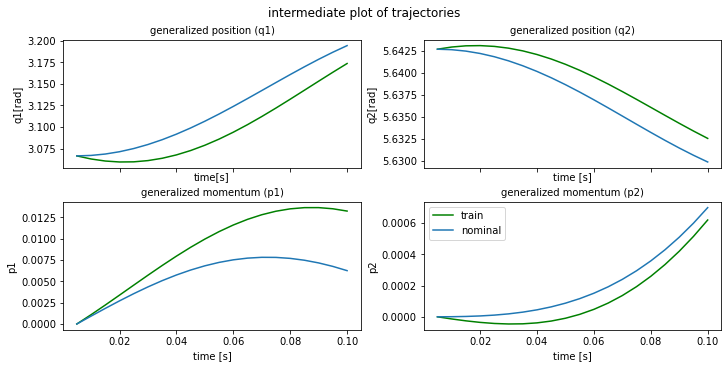

plot time : 0.6609749794006348
epoch  380 | train time 2.30 | train loss 3.810173e-03 | test loss 2.433719e-03 | test time 0.44  
epoch  381 | train time 2.03 | train loss 4.075616e-03 
epoch  382 | train time 2.29 | train loss 2.999356e-03 
epoch  383 | train time 1.66 | train loss 2.019350e-03 
epoch  384 | train time 1.77 | train loss 2.022516e-03 
epoch  385 | train time 1.91 | train loss 1.670371e-03 
epoch  386 | train time 1.82 | train loss 1.249246e-03 
epoch  387 | train time 1.80 | train loss 7.705595e-04 
epoch  388 | train time 1.94 | train loss 7.193880e-04 
epoch  389 | train time 2.26 | train loss 1.194195e-03 


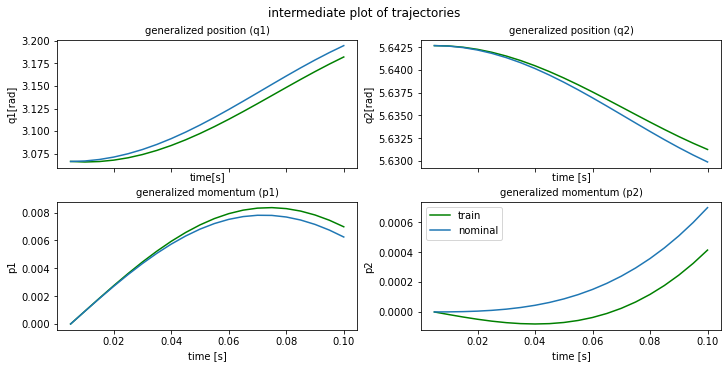

plot time : 0.5448997020721436
epoch  390 | train time 2.57 | train loss 1.003806e-03 | test loss 2.032035e-04 | test time 0.40  
epoch  391 | train time 1.73 | train loss 9.589204e-04 
epoch  392 | train time 2.03 | train loss 9.832307e-04 
epoch  393 | train time 2.12 | train loss 2.378767e-03 
epoch  394 | train time 1.87 | train loss 2.410109e-03 
epoch  395 | train time 1.89 | train loss 2.563616e-03 
epoch  396 | train time 1.82 | train loss 4.237561e-03 
epoch  397 | train time 1.71 | train loss 4.961047e-03 
epoch  398 | train time 1.82 | train loss 4.019605e-03 
epoch  399 | train time 1.83 | train loss 4.643068e-03 


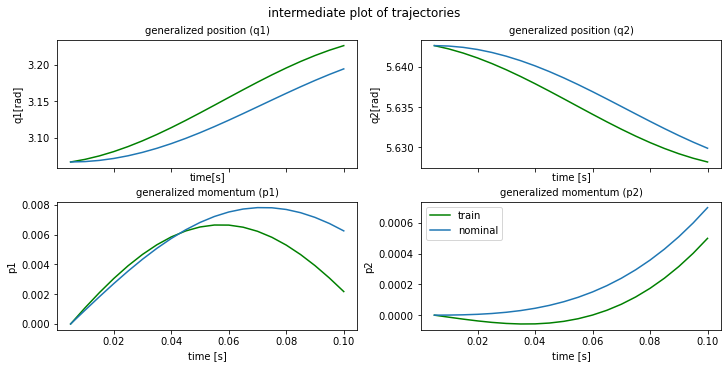

plot time : 0.5488052368164062
epoch  400 | train time 2.13 | train loss 4.358501e-03 | test loss 9.236675e-04 | test time 0.47  
epoch  401 | train time 2.28 | train loss 3.236873e-03 
epoch  402 | train time 1.82 | train loss 1.816344e-03 
epoch  403 | train time 2.01 | train loss 1.506221e-03 
epoch  404 | train time 2.96 | train loss 9.860744e-04 
epoch  405 | train time 2.48 | train loss 7.931893e-04 
epoch  406 | train time 2.21 | train loss 7.290506e-04 
epoch  407 | train time 3.04 | train loss 4.849906e-04 
epoch  408 | train time 2.90 | train loss 3.855360e-04 
epoch  409 | train time 2.05 | train loss 6.233118e-04 


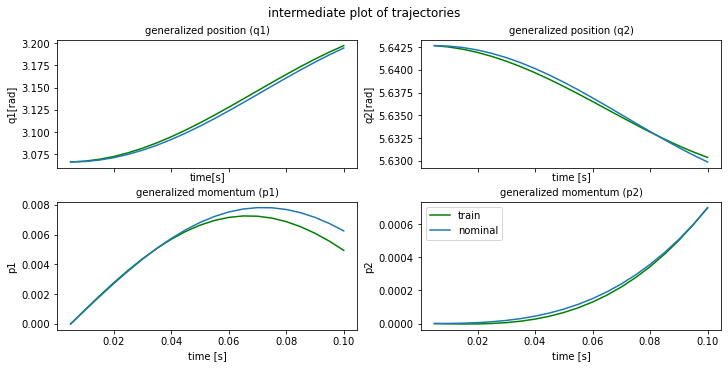

plot time : 0.8386020660400391
epoch  410 | train time 2.86 | train loss 8.762665e-04 | test loss 7.835599e-05 | test time 0.50  
epoch  411 | train time 2.53 | train loss 5.473817e-04 
epoch  412 | train time 1.94 | train loss 7.073987e-04 
epoch  413 | train time 2.38 | train loss 6.959124e-04 
epoch  414 | train time 2.13 | train loss 1.774783e-03 
epoch  415 | train time 2.36 | train loss 2.185429e-03 
epoch  416 | train time 2.32 | train loss 1.228304e-03 
epoch  417 | train time 2.53 | train loss 2.087515e-03 
epoch  418 | train time 2.42 | train loss 2.033132e-03 
epoch  419 | train time 3.02 | train loss 3.089757e-03 


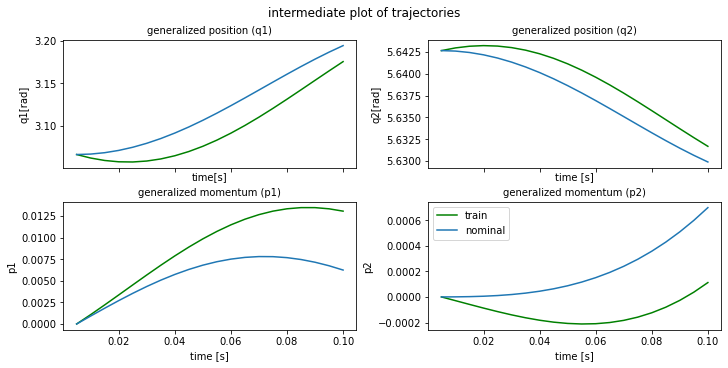

plot time : 1.1043391227722168
epoch  420 | train time 3.06 | train loss 3.904133e-03 | test loss 5.225059e-04 | test time 0.53  
epoch  421 | train time 1.88 | train loss 3.958765e-03 
epoch  422 | train time 1.90 | train loss 2.663568e-03 
epoch  423 | train time 2.15 | train loss 2.060976e-03 
epoch  424 | train time 1.95 | train loss 2.305202e-03 
epoch  425 | train time 1.57 | train loss 1.762365e-03 
epoch  426 | train time 1.82 | train loss 1.360463e-03 
epoch  427 | train time 1.78 | train loss 1.558205e-03 
epoch  428 | train time 1.89 | train loss 1.657621e-03 
epoch  429 | train time 2.71 | train loss 1.604763e-03 


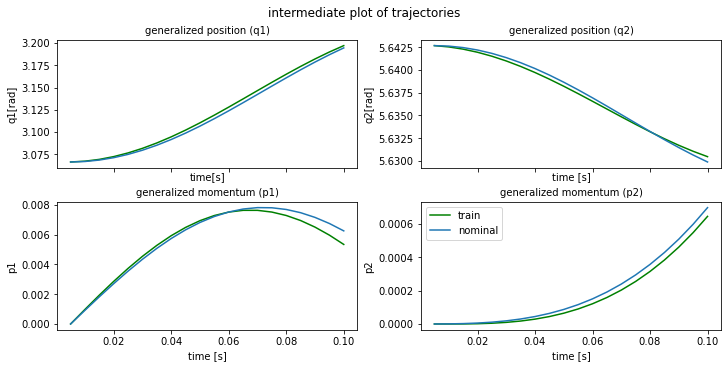

plot time : 0.6526248455047607
epoch  430 | train time 3.24 | train loss 1.487366e-03 | test loss 6.593380e-04 | test time 0.41  
epoch  431 | train time 2.09 | train loss 2.318145e-03 
epoch  432 | train time 2.34 | train loss 2.034848e-03 
epoch  433 | train time 2.16 | train loss 2.465447e-03 
epoch  434 | train time 2.18 | train loss 2.918574e-03 
epoch  435 | train time 2.20 | train loss 3.235919e-03 
epoch  436 | train time 2.14 | train loss 3.611342e-03 
epoch  437 | train time 2.16 | train loss 3.536874e-03 
epoch  438 | train time 2.31 | train loss 2.717931e-03 
epoch  439 | train time 2.32 | train loss 1.904078e-03 


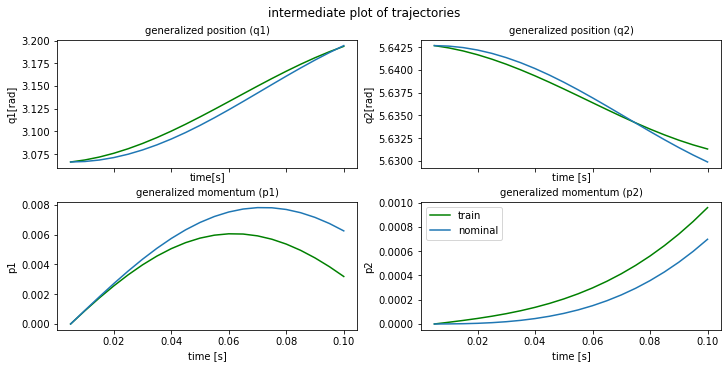

plot time : 0.8312914371490479
epoch  440 | train time 2.95 | train loss 1.397816e-03 | test loss 3.428867e-04 | test time 0.43  
epoch  441 | train time 2.23 | train loss 8.731628e-04 
epoch  442 | train time 2.38 | train loss 7.639299e-04 
epoch  443 | train time 2.14 | train loss 8.635027e-04 
epoch  444 | train time 2.73 | train loss 6.915332e-04 
epoch  445 | train time 2.36 | train loss 5.271273e-04 
epoch  446 | train time 2.20 | train loss 8.351194e-04 
epoch  447 | train time 2.27 | train loss 1.084991e-03 
epoch  448 | train time 2.26 | train loss 9.816978e-04 
epoch  449 | train time 2.13 | train loss 1.256183e-03 


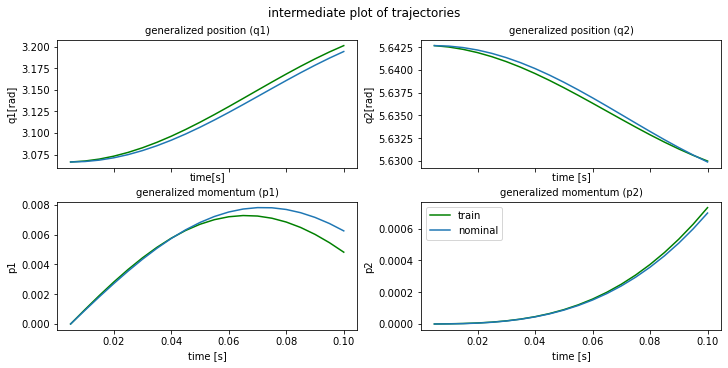

plot time : 0.7869720458984375
epoch  450 | train time 2.85 | train loss 1.685807e-03 | test loss 1.090530e-03 | test time 0.42  
epoch  451 | train time 2.52 | train loss 2.522551e-03 
epoch  452 | train time 2.14 | train loss 3.988561e-03 
epoch  453 | train time 1.99 | train loss 3.305948e-03 
epoch  454 | train time 2.20 | train loss 2.727182e-03 
epoch  455 | train time 2.64 | train loss 2.882091e-03 
epoch  456 | train time 2.14 | train loss 2.293171e-03 
epoch  457 | train time 2.08 | train loss 1.892431e-03 
epoch  458 | train time 2.15 | train loss 1.562572e-03 
epoch  459 | train time 2.71 | train loss 1.403391e-03 


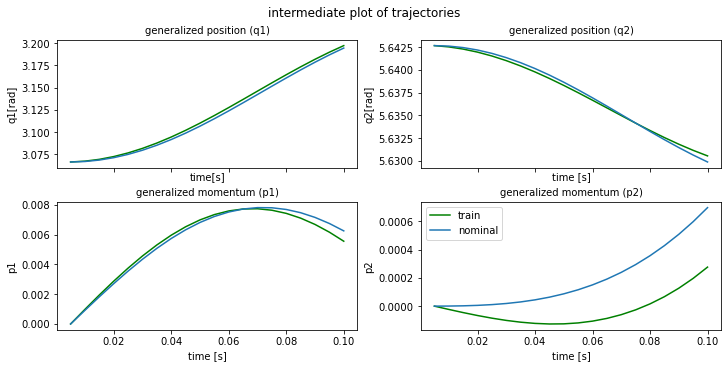

plot time : 0.7633907794952393
epoch  460 | train time 2.77 | train loss 1.028731e-03 | test loss 3.520347e-04 | test time 0.42  
epoch  461 | train time 2.17 | train loss 7.251362e-04 
epoch  462 | train time 2.31 | train loss 7.040252e-04 
epoch  463 | train time 2.41 | train loss 9.616538e-04 
epoch  464 | train time 1.92 | train loss 7.922380e-04 
epoch  465 | train time 2.34 | train loss 7.927272e-04 
epoch  466 | train time 1.95 | train loss 1.011335e-03 
epoch  467 | train time 3.02 | train loss 1.934848e-03 
epoch  468 | train time 2.64 | train loss 1.533653e-03 
epoch  469 | train time 2.46 | train loss 2.059230e-03 


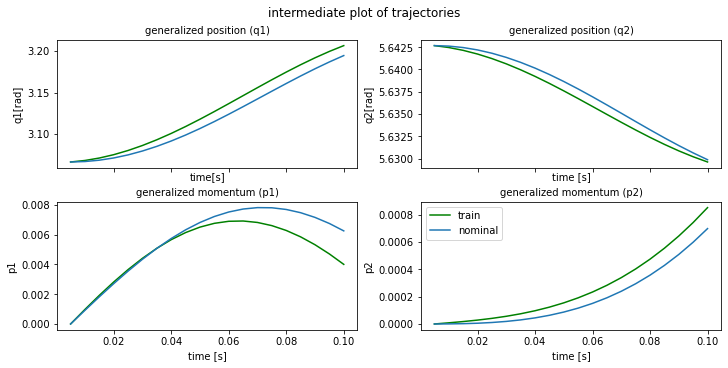

plot time : 0.7410287857055664
epoch  470 | train time 2.59 | train loss 2.807367e-03 | test loss 1.068729e-03 | test time 0.45  
epoch  471 | train time 2.85 | train loss 2.796764e-03 
epoch  472 | train time 2.67 | train loss 2.983145e-03 
epoch  473 | train time 2.52 | train loss 3.421051e-03 
epoch  474 | train time 1.91 | train loss 2.971119e-03 
epoch  475 | train time 2.40 | train loss 2.679928e-03 
epoch  476 | train time 2.18 | train loss 2.398123e-03 
epoch  477 | train time 1.97 | train loss 1.558776e-03 
epoch  478 | train time 2.27 | train loss 9.117219e-04 
epoch  479 | train time 1.88 | train loss 7.542596e-04 


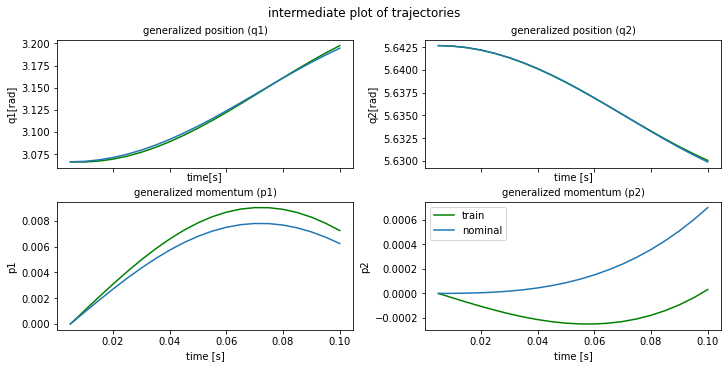

plot time : 1.0829734802246094
epoch  480 | train time 3.51 | train loss 4.795847e-04 | test loss 1.412076e-04 | test time 0.47  
epoch  481 | train time 1.96 | train loss 3.571682e-04 
epoch  482 | train time 2.00 | train loss 4.737739e-04 
epoch  483 | train time 2.10 | train loss 4.282169e-04 
epoch  484 | train time 2.13 | train loss 3.287563e-04 
epoch  485 | train time 1.94 | train loss 3.482154e-04 
epoch  486 | train time 2.29 | train loss 7.060732e-04 
epoch  487 | train time 2.39 | train loss 9.886721e-04 
epoch  488 | train time 2.18 | train loss 6.626877e-04 
epoch  489 | train time 2.01 | train loss 1.014851e-03 


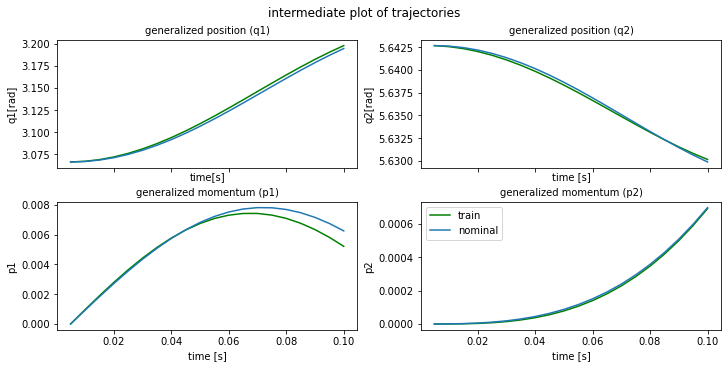

plot time : 0.847139835357666
epoch  490 | train time 3.26 | train loss 1.034493e-03 | test loss 8.028377e-04 | test time 0.59  
epoch  491 | train time 2.22 | train loss 2.294781e-03 
epoch  492 | train time 2.37 | train loss 1.761026e-03 
epoch  493 | train time 2.42 | train loss 2.261189e-03 
epoch  494 | train time 2.35 | train loss 3.255993e-03 
epoch  495 | train time 2.43 | train loss 2.610790e-03 
epoch  496 | train time 2.65 | train loss 2.218062e-03 
epoch  497 | train time 2.82 | train loss 2.294410e-03 
epoch  498 | train time 2.48 | train loss 1.838366e-03 
epoch  499 | train time 2.45 | train loss 1.715143e-03 


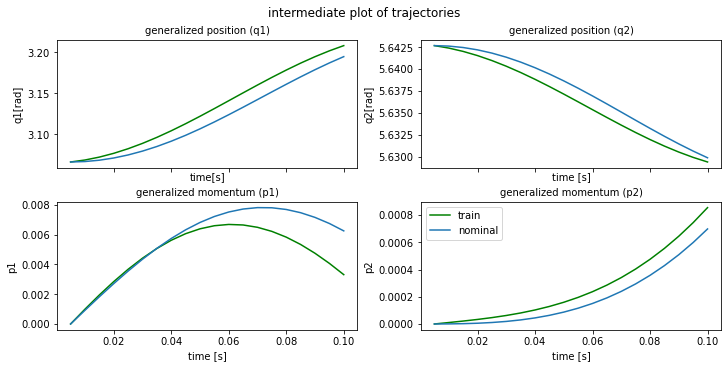

plot time : 0.7636153697967529
epoch  500 | train time 3.05 | train loss 1.643658e-03 | test loss 5.400971e-04 | test time 0.41  
horizon length : 40
epoch  501 | train time 3.98 | train loss 1.914476e-02 
epoch  502 | train time 4.17 | train loss 1.122759e-01 
epoch  503 | train time 5.69 | train loss 5.898142e-02 
epoch  504 | train time 4.40 | train loss 8.471666e-02 
epoch  505 | train time 4.41 | train loss 6.327540e-02 
epoch  506 | train time 4.47 | train loss 5.480064e-02 
epoch  507 | train time 4.51 | train loss 4.911465e-02 
epoch  508 | train time 7.04 | train loss 4.321221e-02 
epoch  509 | train time 4.93 | train loss 4.259593e-02 


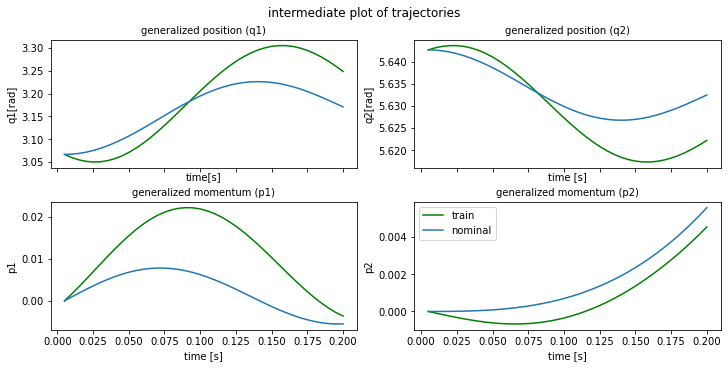

plot time : 0.6826634407043457
epoch  510 | train time 5.70 | train loss 3.741286e-02 | test loss 1.740737e-02 | test time 1.25  
epoch  511 | train time 6.11 | train loss 4.015618e-02 
epoch  512 | train time 4.31 | train loss 3.412301e-02 
epoch  513 | train time 4.12 | train loss 1.262680e-02 
epoch  514 | train time 4.11 | train loss 1.191508e-02 
epoch  515 | train time 4.83 | train loss 1.418045e-02 
epoch  516 | train time 4.20 | train loss 3.083758e-02 
epoch  517 | train time 4.37 | train loss 6.477022e-02 
epoch  518 | train time 4.06 | train loss 2.557269e-02 
epoch  519 | train time 4.32 | train loss 4.020285e-02 


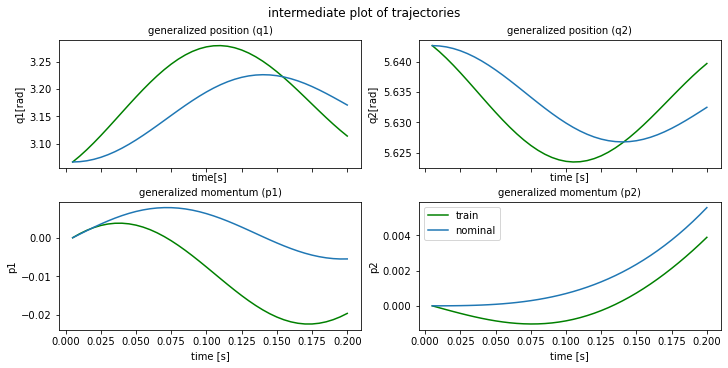

plot time : 0.5775206089019775
epoch  520 | train time 4.86 | train loss 5.781038e-02 | test loss 1.990391e-02 | test time 0.75  
epoch  521 | train time 4.03 | train loss 4.286546e-02 
epoch  522 | train time 4.19 | train loss 2.679491e-02 
epoch  523 | train time 3.95 | train loss 3.649845e-02 
epoch  524 | train time 4.15 | train loss 3.427426e-02 
epoch  525 | train time 4.10 | train loss 1.806907e-02 
epoch  526 | train time 4.64 | train loss 2.575399e-02 
epoch  527 | train time 5.03 | train loss 2.498621e-02 
epoch  528 | train time 4.56 | train loss 3.093096e-02 
epoch  529 | train time 5.21 | train loss 9.828607e-03 


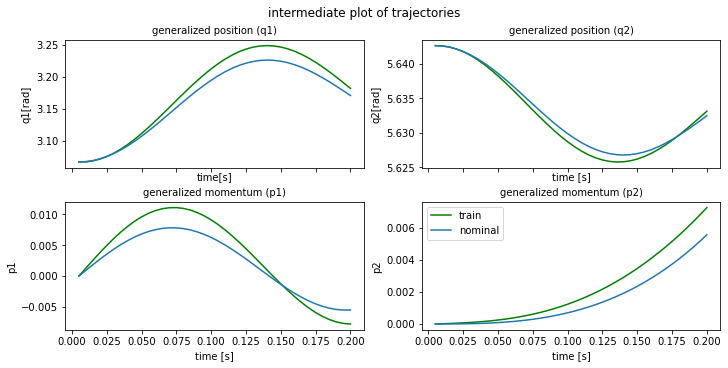

plot time : 0.8872919082641602
epoch  530 | train time 6.09 | train loss 7.833566e-03 | test loss 1.587026e-03 | test time 0.95  
epoch  531 | train time 4.49 | train loss 6.048314e-03 
epoch  532 | train time 4.49 | train loss 6.465257e-03 
epoch  533 | train time 4.02 | train loss 1.859451e-03 
epoch  534 | train time 3.51 | train loss 4.707583e-03 
epoch  535 | train time 3.55 | train loss 7.721872e-03 
epoch  536 | train time 3.27 | train loss 3.257838e-02 
epoch  537 | train time 3.54 | train loss 3.307871e-02 
epoch  538 | train time 3.16 | train loss 5.171494e-02 
epoch  539 | train time 3.46 | train loss 9.715438e-02 


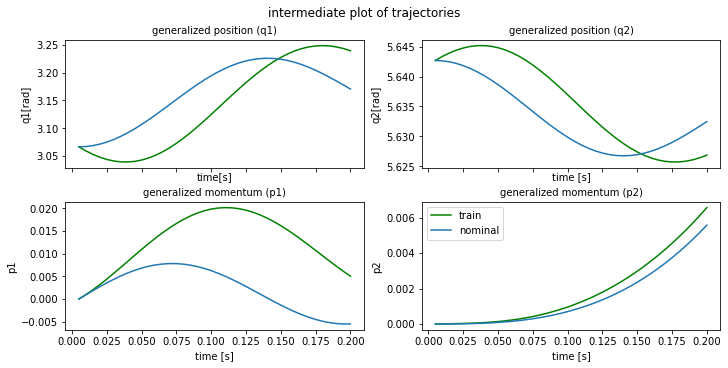

plot time : 0.6084940433502197
epoch  540 | train time 4.22 | train loss 4.909770e-02 | test loss 1.095967e-02 | test time 0.47  
epoch  541 | train time 3.52 | train loss 3.734521e-02 
epoch  542 | train time 3.36 | train loss 3.114850e-02 
epoch  543 | train time 3.39 | train loss 1.841795e-02 
epoch  544 | train time 3.52 | train loss 1.564799e-02 
epoch  545 | train time 4.01 | train loss 5.343031e-03 
epoch  546 | train time 3.58 | train loss 4.192009e-03 
epoch  547 | train time 3.39 | train loss 4.794897e-03 
epoch  548 | train time 3.48 | train loss 3.844419e-03 
epoch  549 | train time 3.47 | train loss 5.800734e-03 


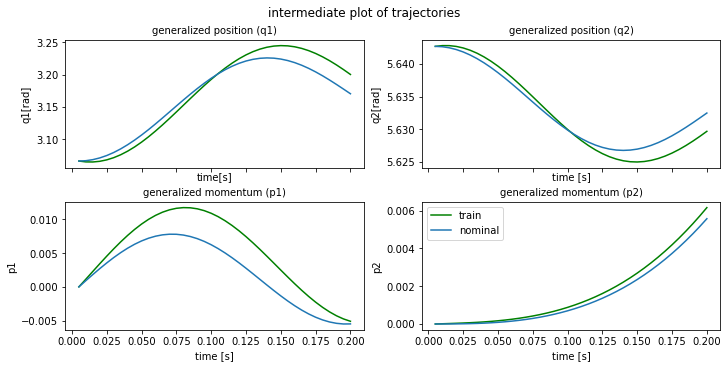

plot time : 0.5616910457611084
epoch  550 | train time 3.97 | train loss 3.105612e-02 | test loss 4.694417e-03 | test time 0.60  
epoch  551 | train time 3.50 | train loss 8.453655e-02 
epoch  552 | train time 3.44 | train loss 9.790873e-02 
epoch  553 | train time 3.47 | train loss 5.817778e-02 
epoch  554 | train time 3.21 | train loss 8.086037e-02 
epoch  555 | train time 3.55 | train loss 8.620582e-02 
epoch  556 | train time 3.55 | train loss 2.920489e-02 
epoch  557 | train time 4.22 | train loss 1.259613e-02 
epoch  558 | train time 3.75 | train loss 1.727210e-02 
epoch  559 | train time 4.05 | train loss 6.390975e-03 


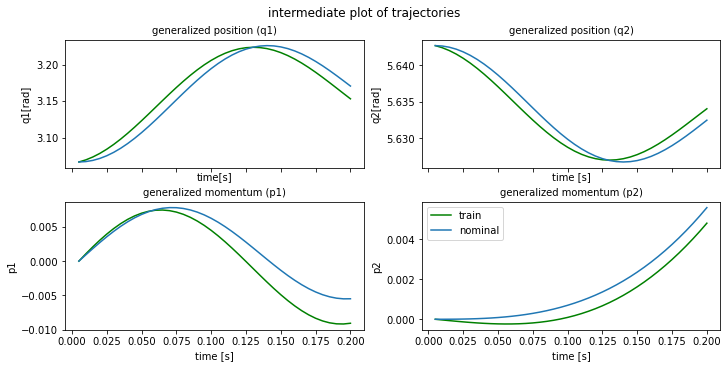

plot time : 0.5441033840179443
epoch  560 | train time 4.52 | train loss 3.028659e-03 | test loss 5.084438e-04 | test time 0.81  
epoch  561 | train time 4.44 | train loss 1.970268e-03 
epoch  562 | train time 5.58 | train loss 3.396715e-03 
epoch  563 | train time 4.73 | train loss 2.871689e-03 
epoch  564 | train time 4.63 | train loss 3.069694e-03 
epoch  565 | train time 4.30 | train loss 5.926526e-03 
epoch  566 | train time 4.94 | train loss 1.324254e-02 
epoch  567 | train time 4.34 | train loss 1.189609e-02 
epoch  568 | train time 4.71 | train loss 7.848829e-03 
epoch  569 | train time 4.18 | train loss 5.816625e-03 


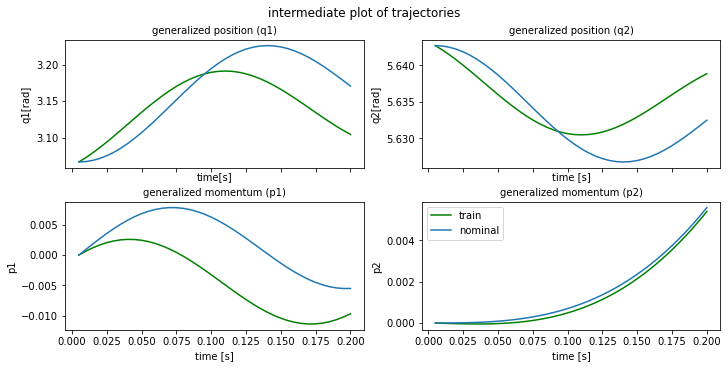

plot time : 0.9723865985870361
epoch  570 | train time 4.87 | train loss 1.498450e-02 | test loss 2.864697e-03 | test time 0.53  
epoch  571 | train time 3.49 | train loss 6.077938e-03 
epoch  572 | train time 3.88 | train loss 4.636022e-03 
epoch  573 | train time 4.52 | train loss 3.620022e-03 
epoch  574 | train time 4.69 | train loss 1.997466e-03 
epoch  575 | train time 4.03 | train loss 1.671849e-03 
epoch  576 | train time 3.89 | train loss 1.559285e-03 
epoch  577 | train time 4.31 | train loss 1.382387e-03 
epoch  578 | train time 3.35 | train loss 1.041029e-03 
epoch  579 | train time 4.06 | train loss 9.715294e-04 


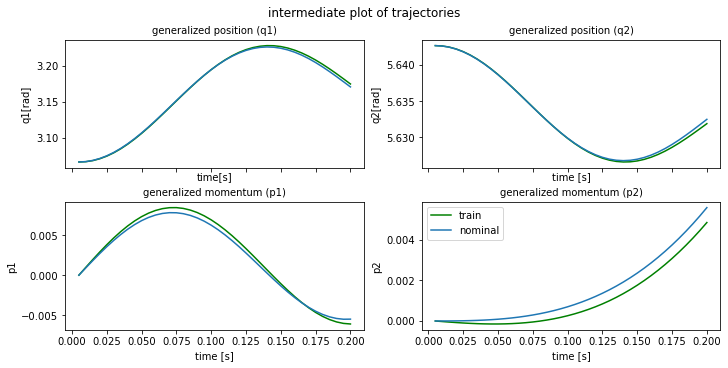

plot time : 0.5279686450958252
epoch  580 | train time 4.19 | train loss 1.158431e-03 | test loss 4.369922e-04 | test time 0.70  
epoch  581 | train time 3.38 | train loss 1.062709e-03 
epoch  582 | train time 3.50 | train loss 1.055696e-03 
epoch  583 | train time 3.37 | train loss 7.747573e-04 
epoch  584 | train time 3.52 | train loss 1.842035e-03 
epoch  585 | train time 3.31 | train loss 1.824572e-03 
epoch  586 | train time 3.56 | train loss 2.231175e-03 
epoch  587 | train time 3.43 | train loss 2.358848e-03 
epoch  588 | train time 3.30 | train loss 2.342417e-03 
epoch  589 | train time 3.97 | train loss 2.947580e-03 


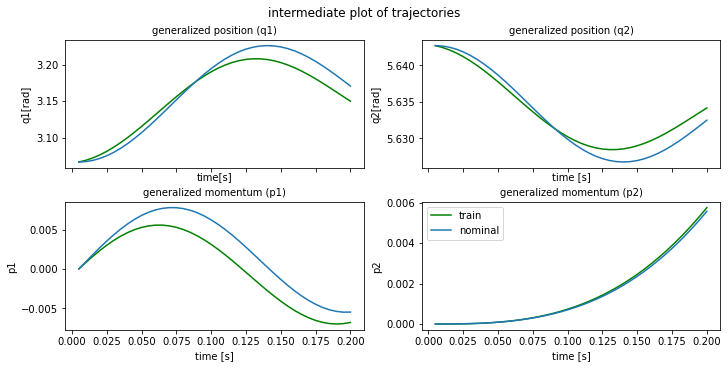

plot time : 0.6479570865631104
epoch  590 | train time 4.53 | train loss 3.139926e-03 | test loss 4.355673e-04 | test time 0.74  
epoch  591 | train time 3.59 | train loss 4.254216e-03 
epoch  592 | train time 3.90 | train loss 2.679369e-03 
epoch  593 | train time 3.86 | train loss 2.925123e-03 
epoch  594 | train time 3.55 | train loss 2.545739e-03 
epoch  595 | train time 4.63 | train loss 2.904042e-03 
epoch  596 | train time 4.27 | train loss 3.245401e-03 
epoch  597 | train time 3.86 | train loss 2.745182e-03 
epoch  598 | train time 3.94 | train loss 2.890119e-03 
epoch  599 | train time 5.50 | train loss 2.680004e-03 


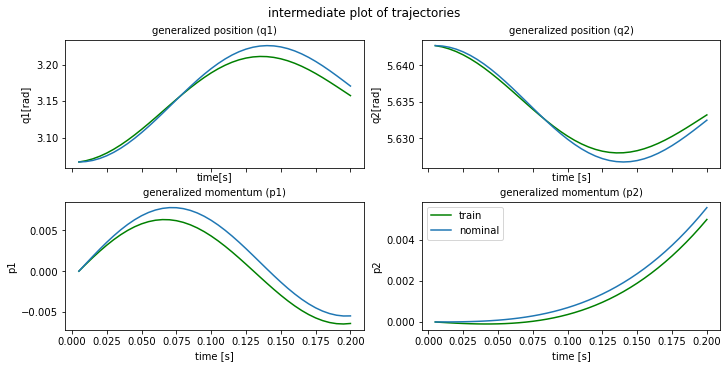

plot time : 1.0098330974578857
epoch  600 | train time 8.28 | train loss 2.337944e-03 | test loss 8.009336e-04 | test time 1.26  
horizon length : 60
epoch  601 | train time 9.68 | train loss 2.318160e-03 
epoch  602 | train time 9.81 | train loss 1.737376e-03 
epoch  603 | train time 9.35 | train loss 1.347565e-03 
epoch  604 | train time 9.22 | train loss 1.105384e-03 
epoch  605 | train time 9.01 | train loss 7.806826e-04 
epoch  606 | train time 9.31 | train loss 6.838752e-04 
epoch  607 | train time 9.03 | train loss 6.166766e-04 
epoch  608 | train time 10.09 | train loss 5.935251e-04 
epoch  609 | train time 8.09 | train loss 6.551972e-04 


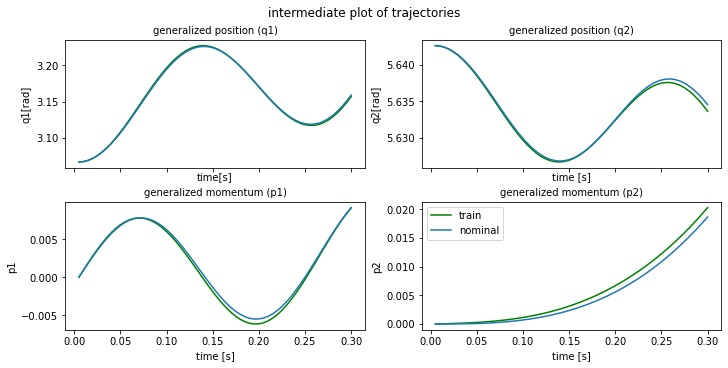

plot time : 0.6159422397613525
epoch  610 | train time 8.11 | train loss 7.438577e-04 | test loss 2.072751e-04 | test time 1.38  
epoch  611 | train time 7.01 | train loss 8.031284e-04 
epoch  612 | train time 6.99 | train loss 7.082818e-04 
epoch  613 | train time 7.20 | train loss 5.402765e-04 
epoch  614 | train time 8.69 | train loss 5.000538e-04 
epoch  615 | train time 8.54 | train loss 5.544971e-04 
epoch  616 | train time 8.50 | train loss 5.732709e-04 
epoch  617 | train time 9.81 | train loss 6.137198e-04 
epoch  618 | train time 7.92 | train loss 6.854164e-04 
epoch  619 | train time 7.92 | train loss 6.608759e-04 


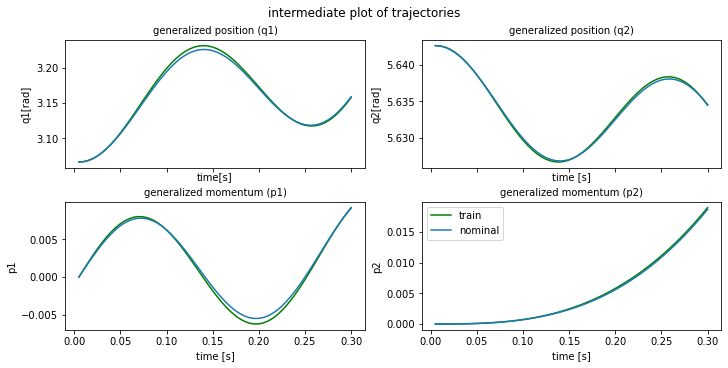

plot time : 0.7598705291748047
epoch  620 | train time 10.10 | train loss 5.226934e-04 | test loss 9.481821e-05 | test time 1.36  
epoch  621 | train time 7.71 | train loss 4.214326e-04 
epoch  622 | train time 7.80 | train loss 4.429969e-04 
epoch  623 | train time 7.39 | train loss 5.215484e-04 
epoch  624 | train time 8.87 | train loss 5.671876e-04 
epoch  625 | train time 12.05 | train loss 5.937044e-04 
epoch  626 | train time 10.52 | train loss 5.771127e-04 
epoch  627 | train time 9.33 | train loss 4.945797e-04 
epoch  628 | train time 9.54 | train loss 4.214062e-04 
epoch  629 | train time 9.15 | train loss 4.417847e-04 


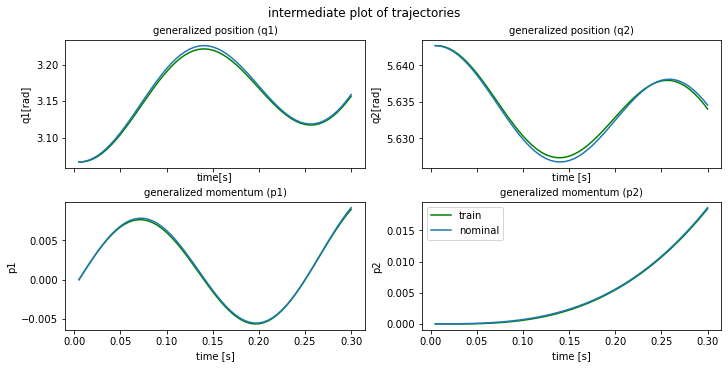

plot time : 1.0803511142730713
epoch  630 | train time 10.33 | train loss 4.728050e-04 | test loss 2.064801e-04 | test time 1.60  
epoch  631 | train time 9.15 | train loss 5.069256e-04 
epoch  632 | train time 9.82 | train loss 5.995727e-04 
epoch  633 | train time 9.37 | train loss 6.749491e-04 
epoch  634 | train time 9.43 | train loss 5.754747e-04 
epoch  635 | train time 9.60 | train loss 4.185023e-04 
epoch  636 | train time 9.60 | train loss 3.574280e-04 
epoch  637 | train time 10.45 | train loss 4.618506e-04 
epoch  638 | train time 9.46 | train loss 6.446886e-04 
epoch  639 | train time 9.78 | train loss 5.881518e-04 


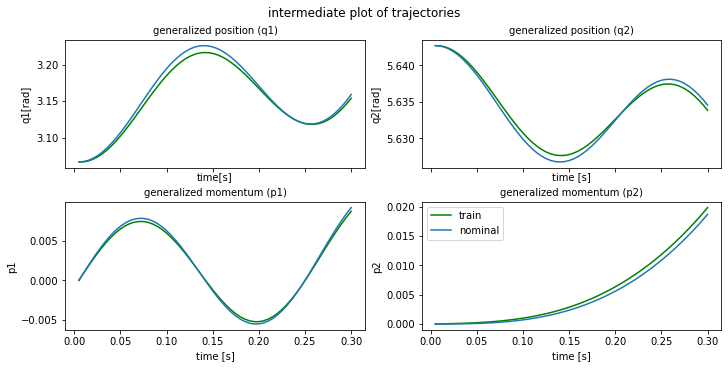

plot time : 1.2447493076324463
epoch  640 | train time 10.98 | train loss 4.985799e-04 | test loss 2.155104e-04 | test time 1.59  
epoch  641 | train time 9.67 | train loss 5.669640e-04 
epoch  642 | train time 9.45 | train loss 6.110874e-04 
epoch  643 | train time 9.52 | train loss 6.082767e-04 
epoch  644 | train time 9.35 | train loss 5.700716e-04 
epoch  645 | train time 9.40 | train loss 5.133649e-04 
epoch  646 | train time 10.34 | train loss 5.582178e-04 
epoch  647 | train time 8.93 | train loss 7.134553e-04 
epoch  648 | train time 10.19 | train loss 9.530329e-04 
epoch  649 | train time 10.79 | train loss 8.774079e-04 


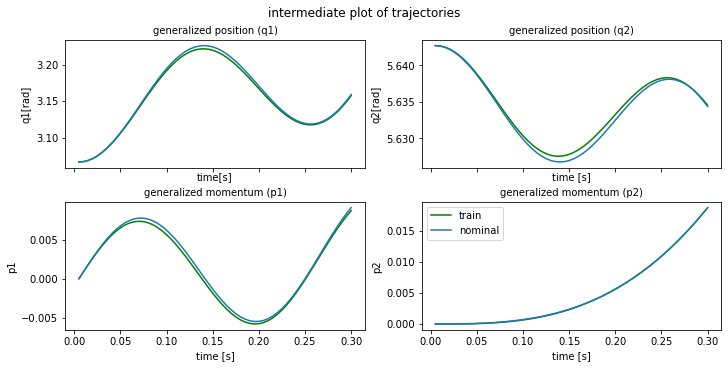

plot time : 1.1949026584625244
epoch  650 | train time 10.90 | train loss 5.323768e-04 | test loss 1.762482e-04 | test time 2.05  
epoch  651 | train time 9.73 | train loss 4.745803e-04 
epoch  652 | train time 9.40 | train loss 5.029517e-04 
epoch  653 | train time 9.46 | train loss 6.315998e-04 
epoch  654 | train time 9.30 | train loss 1.190708e-03 
epoch  655 | train time 9.52 | train loss 1.215059e-03 
epoch  656 | train time 9.57 | train loss 6.502133e-04 
epoch  657 | train time 9.38 | train loss 6.342332e-04 
epoch  658 | train time 9.72 | train loss 8.645467e-04 
epoch  659 | train time 9.06 | train loss 8.857377e-04 


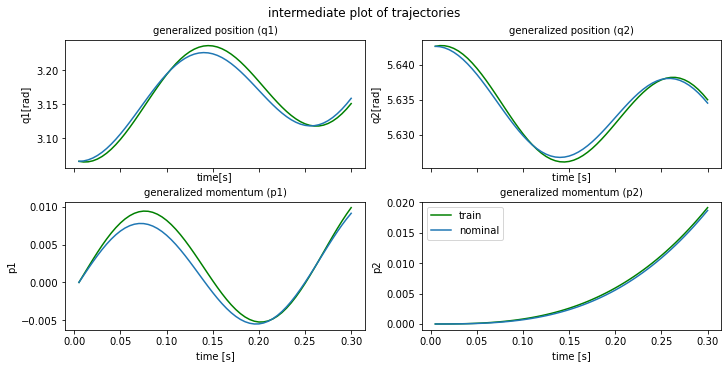

plot time : 1.0549895763397217
epoch  660 | train time 10.22 | train loss 1.308872e-03 | test loss 2.268249e-04 | test time 2.00  
epoch  661 | train time 10.26 | train loss 1.493787e-03 
epoch  662 | train time 9.34 | train loss 9.568866e-04 
epoch  663 | train time 9.25 | train loss 9.378053e-04 
epoch  664 | train time 9.13 | train loss 1.235270e-03 
epoch  665 | train time 9.14 | train loss 1.349754e-03 
epoch  666 | train time 9.00 | train loss 1.469731e-03 
epoch  667 | train time 10.33 | train loss 1.363494e-03 
epoch  668 | train time 9.07 | train loss 9.476058e-04 
epoch  669 | train time 9.26 | train loss 9.001284e-04 


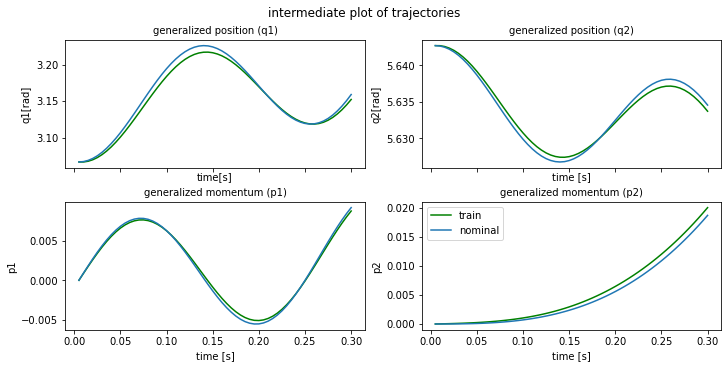

plot time : 1.1397178173065186
epoch  670 | train time 10.25 | train loss 1.142745e-03 | test loss 4.628245e-04 | test time 2.09  
epoch  671 | train time 9.18 | train loss 1.194588e-03 
epoch  672 | train time 9.05 | train loss 1.087621e-03 
epoch  673 | train time 9.06 | train loss 1.196449e-03 
epoch  674 | train time 8.89 | train loss 9.473097e-04 
epoch  675 | train time 8.93 | train loss 6.621569e-04 
epoch  676 | train time 8.96 | train loss 8.879799e-04 
epoch  677 | train time 9.06 | train loss 9.372587e-04 
epoch  678 | train time 9.06 | train loss 5.405265e-04 
epoch  679 | train time 9.06 | train loss 6.691876e-04 


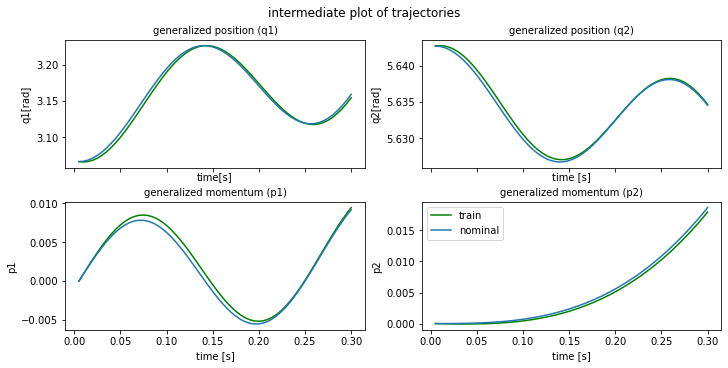

plot time : 1.375331163406372
epoch  680 | train time 10.38 | train loss 1.252624e-03 | test loss 2.744347e-04 | test time 1.41  
epoch  681 | train time 8.93 | train loss 1.378190e-03 
epoch  682 | train time 9.07 | train loss 1.044620e-03 
epoch  683 | train time 8.64 | train loss 6.930874e-04 
epoch  684 | train time 9.07 | train loss 5.372162e-04 
epoch  685 | train time 9.13 | train loss 5.381190e-04 
epoch  686 | train time 11.05 | train loss 5.113247e-04 
epoch  687 | train time 10.55 | train loss 5.803527e-04 
epoch  688 | train time 9.15 | train loss 9.133928e-04 
epoch  689 | train time 8.81 | train loss 1.287844e-03 


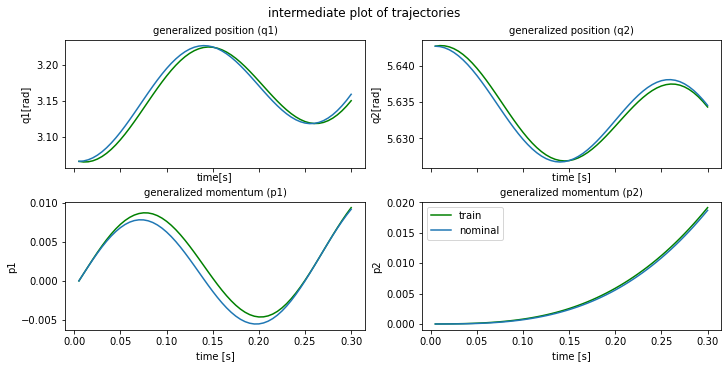

plot time : 1.0038864612579346
epoch  690 | train time 10.26 | train loss 1.397199e-03 | test loss 2.927779e-04 | test time 2.08  
epoch  691 | train time 8.67 | train loss 1.213312e-03 
epoch  692 | train time 9.18 | train loss 9.176170e-04 
epoch  693 | train time 8.99 | train loss 7.199089e-04 
epoch  694 | train time 8.91 | train loss 7.147771e-04 
epoch  695 | train time 8.96 | train loss 8.280238e-04 
epoch  696 | train time 9.41 | train loss 9.240863e-04 
epoch  697 | train time 8.89 | train loss 9.623826e-04 
epoch  698 | train time 8.95 | train loss 1.009755e-03 
epoch  699 | train time 10.15 | train loss 1.128438e-03 


In [217]:
stats = train(model = model, 
            Ts = Ts, 
            train_loader = train_loader, 
            test_loader = test_loader, 
            w=torch.tensor(weights, device=device),
            grad_clip = True,
            lr_schedule = True,
            begin_decay = 2250, 
            resnet_config = 1,
            epoch_number = epoch_number, 
            alternating = False,
            horizon = False, 
            horizon_type = 'auto', 
            horizon_list = horizon_list, 
            switch_steps = switch_steps, 
            epochs = epoch_number, 
            loss_type = 'L2weighted2')

##### 125 trajectories batch = 100

horizon length : 20


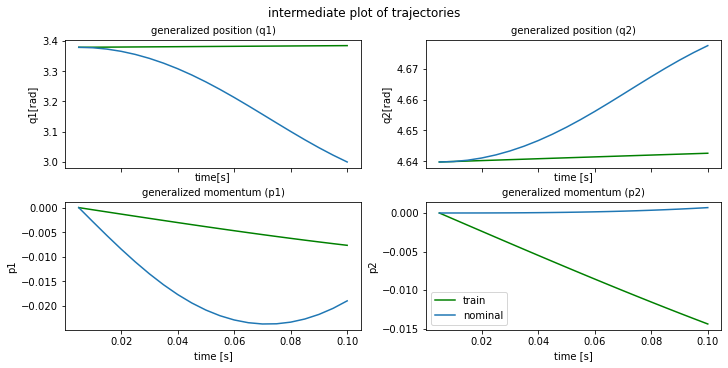

plot time : 0.6049294471740723


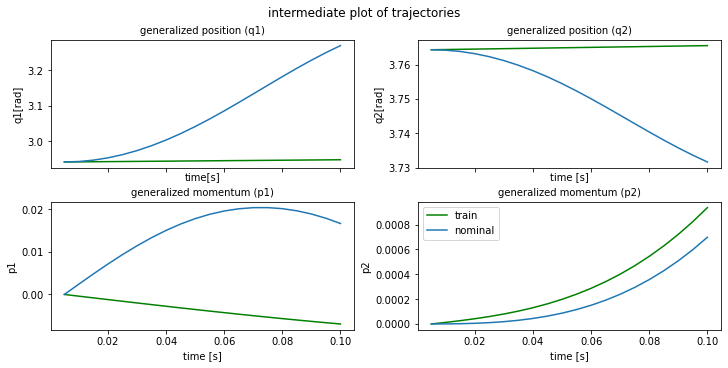

plot time : 0.6170358657836914
epoch    0 | train time 2.17 | train loss 1.107504e-01 
horizon length : 20
epoch    1 | train time 0.89 | train loss 1.011678e-01 
epoch    2 | train time 0.97 | train loss 9.221974e-02 
epoch    3 | train time 0.87 | train loss 8.565306e-02 
epoch    4 | train time 0.93 | train loss 8.603662e-02 
epoch    5 | train time 0.91 | train loss 8.192397e-02 
epoch    6 | train time 0.92 | train loss 7.788464e-02 
epoch    7 | train time 0.97 | train loss 7.593837e-02 
epoch    8 | train time 0.90 | train loss 7.208850e-02 
epoch    9 | train time 0.99 | train loss 6.809958e-02 


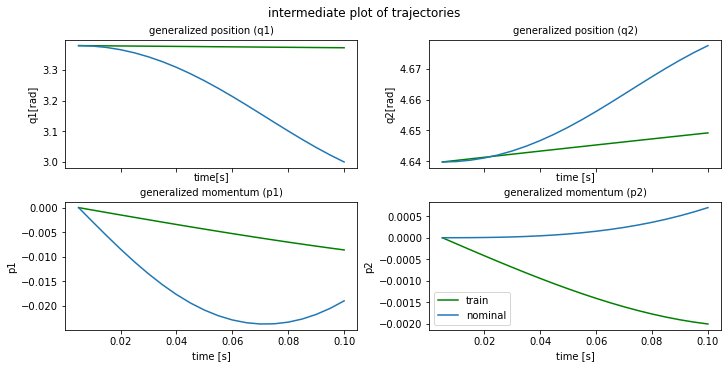

plot time : 0.6841738224029541


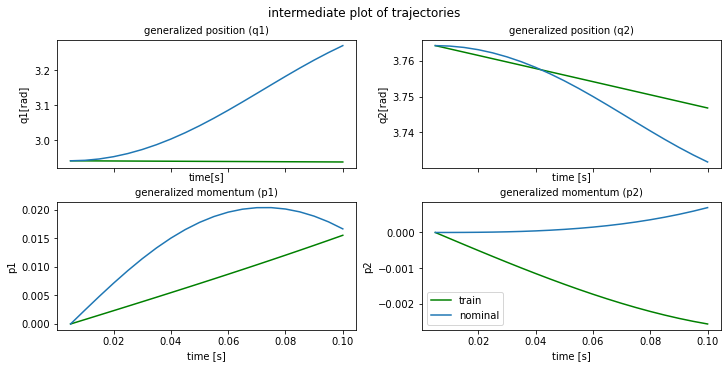

plot time : 0.5542948246002197
epoch   10 | train time 2.12 | train loss 6.411096e-02 
epoch   11 | train time 0.89 | train loss 5.904664e-02 
epoch   12 | train time 0.96 | train loss 5.492907e-02 
epoch   13 | train time 1.02 | train loss 5.071485e-02 
epoch   14 | train time 0.96 | train loss 5.094623e-02 
epoch   15 | train time 0.95 | train loss 4.722078e-02 
epoch   16 | train time 0.91 | train loss 4.620469e-02 
epoch   17 | train time 0.98 | train loss 4.604509e-02 
epoch   18 | train time 0.99 | train loss 4.511412e-02 
epoch   19 | train time 0.99 | train loss 4.521688e-02 


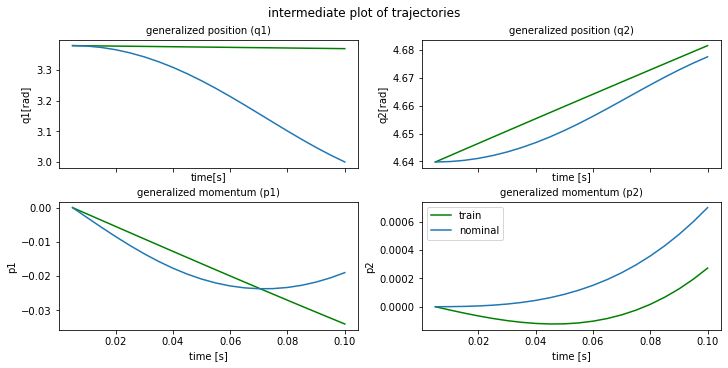

plot time : 0.6223852634429932


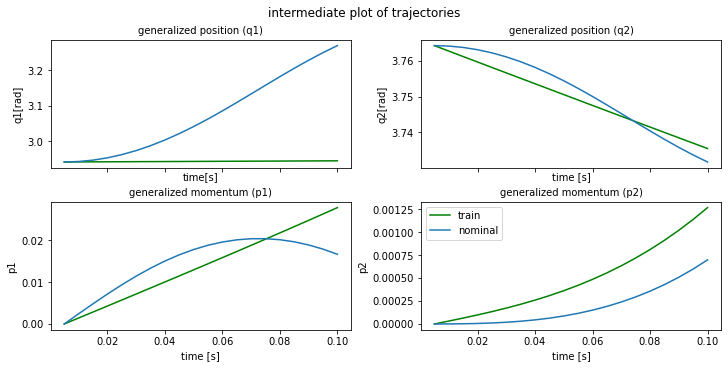

plot time : 0.5609841346740723
epoch   20 | train time 2.20 | train loss 4.422025e-02 
epoch   21 | train time 0.92 | train loss 4.401484e-02 
epoch   22 | train time 0.82 | train loss 4.369884e-02 
epoch   23 | train time 0.87 | train loss 4.318119e-02 
epoch   24 | train time 1.07 | train loss 4.311070e-02 
epoch   25 | train time 0.93 | train loss 4.243280e-02 
epoch   26 | train time 0.92 | train loss 4.245044e-02 
epoch   27 | train time 0.93 | train loss 4.181302e-02 
epoch   28 | train time 1.05 | train loss 4.179280e-02 
epoch   29 | train time 1.18 | train loss 4.128832e-02 


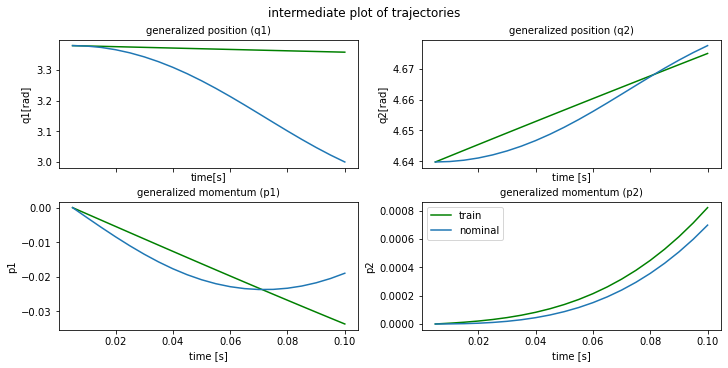

plot time : 0.7076075077056885


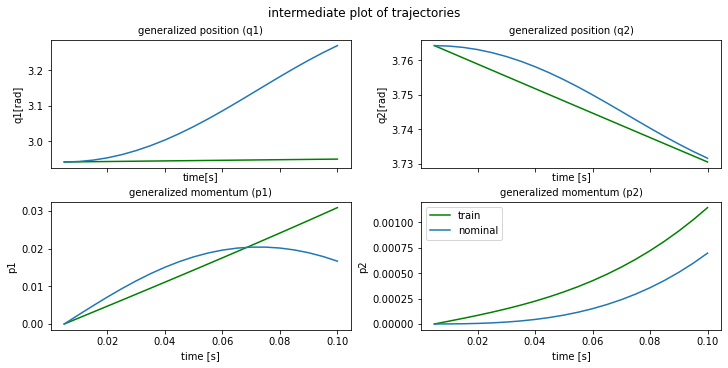

plot time : 0.5263769626617432
epoch   30 | train time 2.32 | train loss 4.115462e-02 
epoch   31 | train time 0.78 | train loss 4.079548e-02 
epoch   32 | train time 0.79 | train loss 4.051116e-02 
epoch   33 | train time 0.84 | train loss 4.033565e-02 
epoch   34 | train time 0.74 | train loss 3.992157e-02 
epoch   35 | train time 0.74 | train loss 3.973359e-02 
epoch   36 | train time 0.81 | train loss 3.935718e-02 
epoch   37 | train time 0.82 | train loss 3.902224e-02 
epoch   38 | train time 0.80 | train loss 3.886431e-02 
epoch   39 | train time 0.75 | train loss 3.843718e-02 


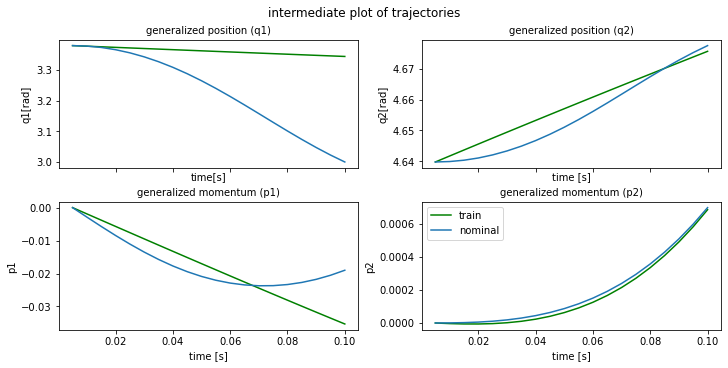

plot time : 0.5266432762145996


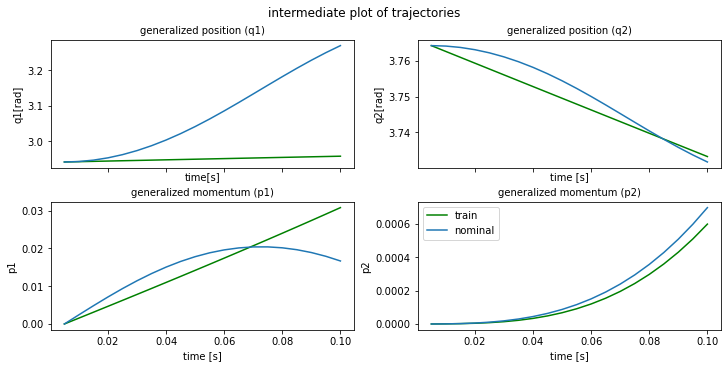

plot time : 0.48435330390930176
epoch   40 | train time 1.81 | train loss 3.808820e-02 
epoch   41 | train time 0.83 | train loss 3.791597e-02 
epoch   42 | train time 0.78 | train loss 3.756215e-02 
epoch   43 | train time 0.74 | train loss 3.708775e-02 
epoch   44 | train time 0.81 | train loss 3.676682e-02 
epoch   45 | train time 0.66 | train loss 3.663028e-02 
epoch   46 | train time 0.74 | train loss 3.651324e-02 
epoch   47 | train time 0.63 | train loss 3.604545e-02 
epoch   48 | train time 0.84 | train loss 3.537513e-02 
epoch   49 | train time 0.75 | train loss 3.487146e-02 


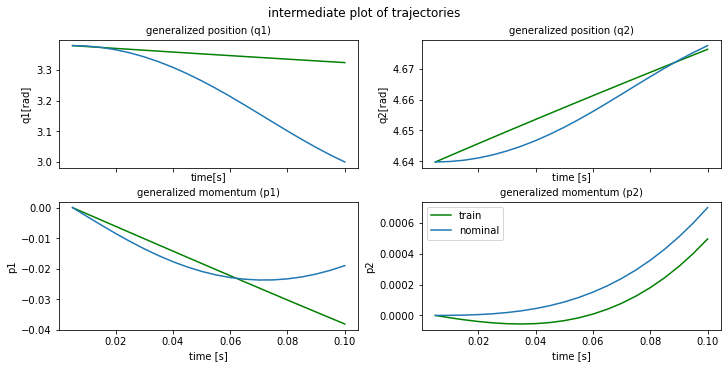

plot time : 0.6149296760559082


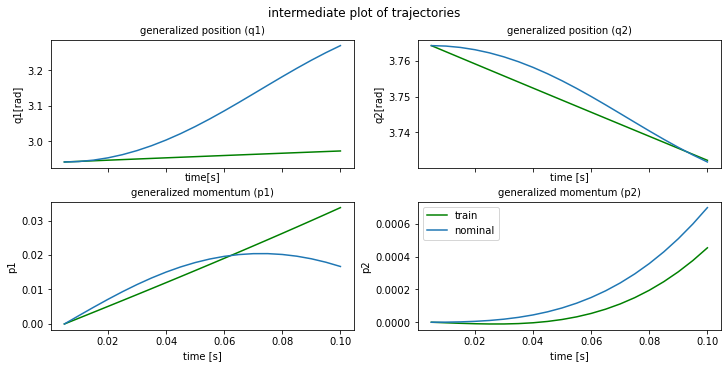

plot time : 0.5383586883544922
epoch   50 | train time 1.87 | train loss 3.458819e-02 
epoch   51 | train time 0.75 | train loss 3.501194e-02 
epoch   52 | train time 0.65 | train loss 3.651025e-02 
epoch   53 | train time 0.82 | train loss 3.423531e-02 
epoch   54 | train time 0.90 | train loss 3.362566e-02 
epoch   55 | train time 0.77 | train loss 3.284121e-02 
epoch   56 | train time 0.70 | train loss 3.307457e-02 
epoch   57 | train time 0.81 | train loss 3.241749e-02 
epoch   58 | train time 0.73 | train loss 3.149760e-02 
epoch   59 | train time 0.69 | train loss 3.122647e-02 


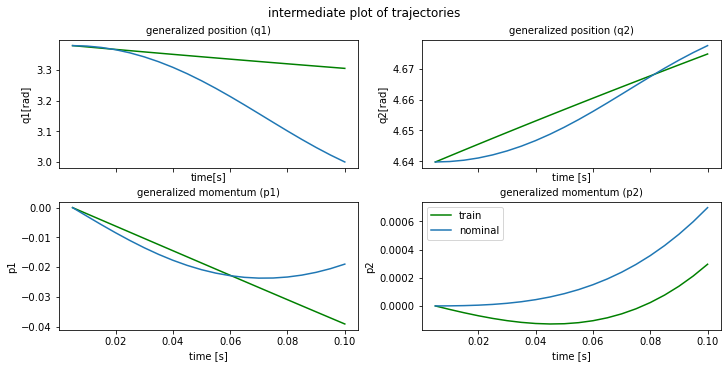

plot time : 0.5077447891235352


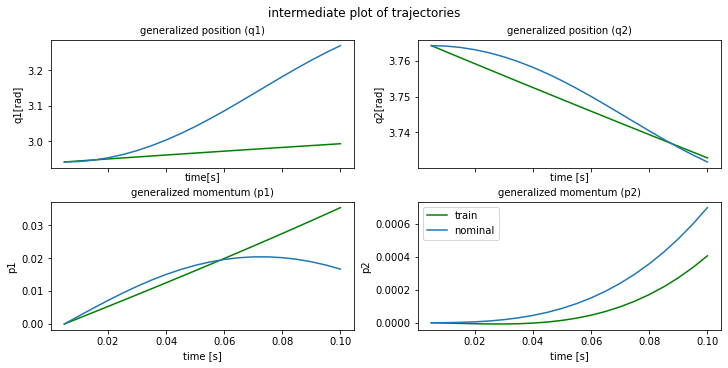

plot time : 0.5105686187744141
epoch   60 | train time 1.80 | train loss 3.050377e-02 
epoch   61 | train time 0.75 | train loss 3.129760e-02 
epoch   62 | train time 0.72 | train loss 3.107832e-02 
epoch   63 | train time 0.76 | train loss 2.927476e-02 
epoch   64 | train time 0.76 | train loss 2.868930e-02 
epoch   65 | train time 0.81 | train loss 2.860388e-02 
epoch   66 | train time 0.79 | train loss 2.807909e-02 
epoch   67 | train time 0.74 | train loss 2.735573e-02 
epoch   68 | train time 0.83 | train loss 2.667091e-02 
epoch   69 | train time 0.69 | train loss 2.604763e-02 


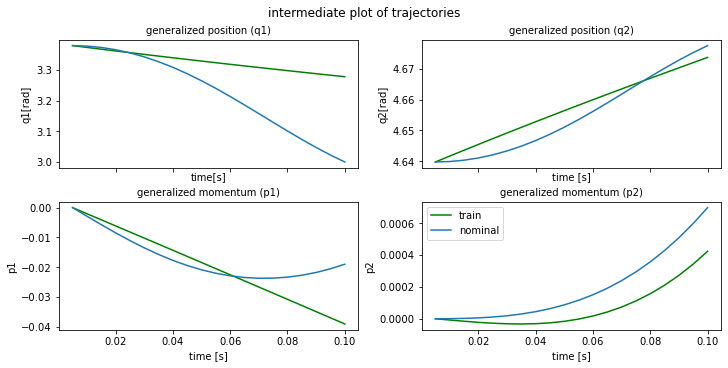

plot time : 0.5799627304077148


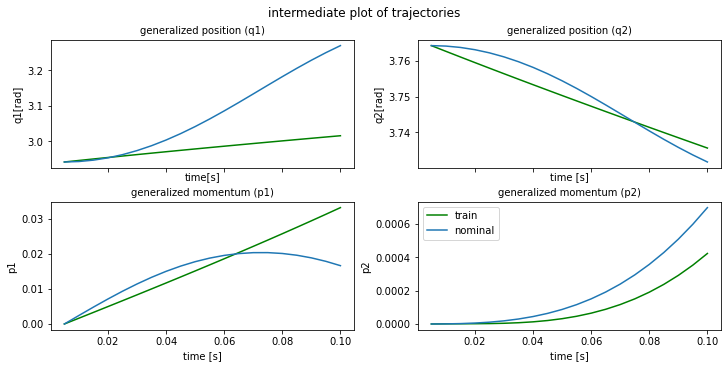

plot time : 0.47632694244384766
epoch   70 | train time 1.86 | train loss 2.544252e-02 
epoch   71 | train time 0.71 | train loss 2.494514e-02 
epoch   72 | train time 0.65 | train loss 3.351715e-02 
epoch   73 | train time 0.82 | train loss 2.967366e-02 
epoch   74 | train time 0.71 | train loss 2.609129e-02 
epoch   75 | train time 0.71 | train loss 2.585545e-02 
epoch   76 | train time 0.68 | train loss 2.597609e-02 
epoch   77 | train time 0.71 | train loss 2.697912e-02 
epoch   78 | train time 0.73 | train loss 2.252742e-02 
epoch   79 | train time 0.82 | train loss 2.606081e-02 


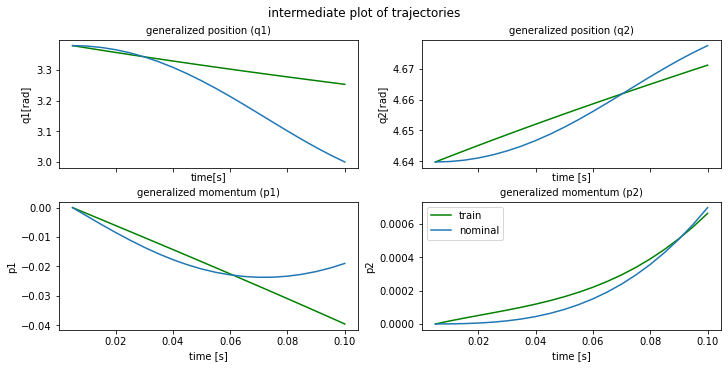

plot time : 0.5062761306762695


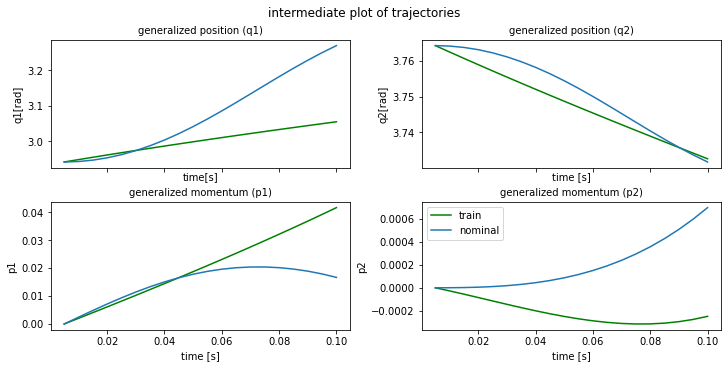

plot time : 0.4773876667022705
epoch   80 | train time 1.75 | train loss 2.264841e-02 
epoch   81 | train time 0.71 | train loss 3.036111e-02 
epoch   82 | train time 0.73 | train loss 6.387394e-02 
epoch   83 | train time 0.66 | train loss 5.518638e-02 
epoch   84 | train time 0.73 | train loss 1.063708e-01 
epoch   85 | train time 0.72 | train loss 3.555537e-02 
epoch   86 | train time 0.79 | train loss 3.202737e-02 
epoch   87 | train time 0.71 | train loss 3.061515e-02 
epoch   88 | train time 0.74 | train loss 2.789841e-02 
epoch   89 | train time 0.73 | train loss 3.361339e-02 


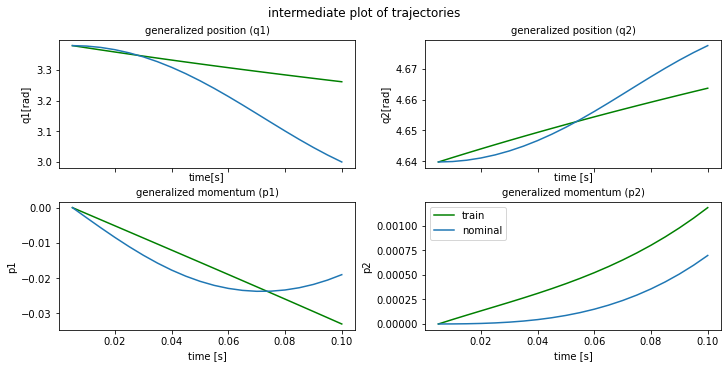

plot time : 0.5658342838287354


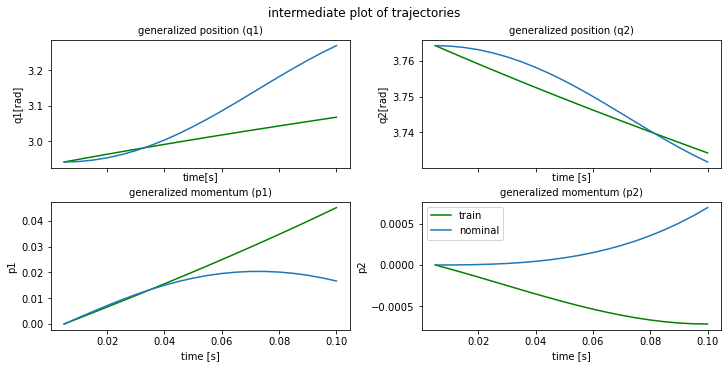

plot time : 0.49995899200439453
epoch   90 | train time 1.81 | train loss 2.531861e-02 
epoch   91 | train time 0.73 | train loss 2.256159e-02 
epoch   92 | train time 0.75 | train loss 2.179644e-02 
epoch   93 | train time 0.67 | train loss 2.190093e-02 
epoch   94 | train time 0.75 | train loss 2.166781e-02 
epoch   95 | train time 0.69 | train loss 2.114904e-02 
epoch   96 | train time 0.70 | train loss 1.990313e-02 
epoch   97 | train time 0.68 | train loss 1.947864e-02 
epoch   98 | train time 0.66 | train loss 1.976549e-02 
epoch   99 | train time 0.76 | train loss 1.879848e-02 


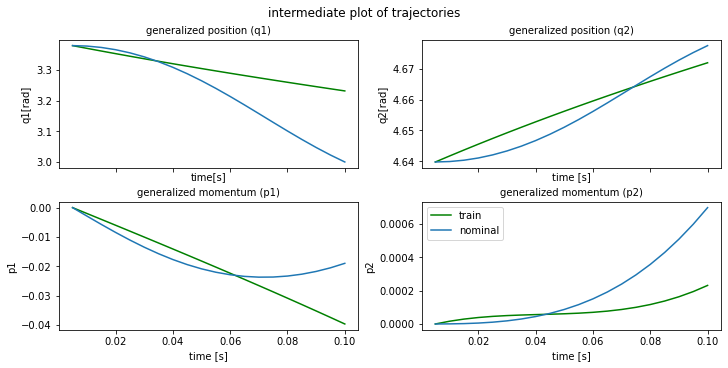

plot time : 0.5443456172943115


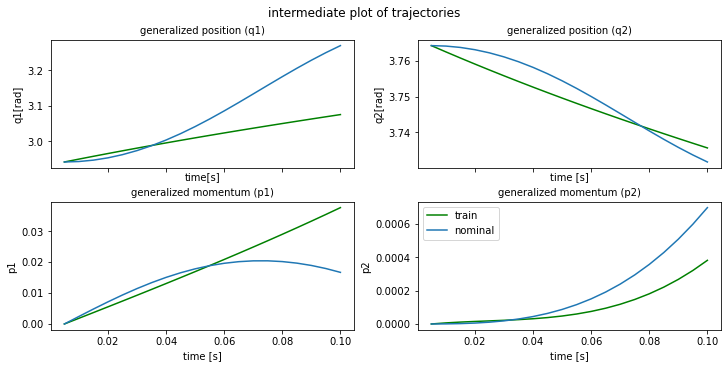

plot time : 0.5357344150543213
epoch  100 | train time 1.75 | train loss 1.838340e-02 
epoch  101 | train time 0.69 | train loss 1.835595e-02 
epoch  102 | train time 0.84 | train loss 1.759935e-02 
epoch  103 | train time 0.75 | train loss 1.714318e-02 
epoch  104 | train time 0.66 | train loss 1.758546e-02 
epoch  105 | train time 0.78 | train loss 1.639362e-02 
epoch  106 | train time 0.66 | train loss 1.607673e-02 
epoch  107 | train time 0.74 | train loss 1.565337e-02 
epoch  108 | train time 0.65 | train loss 1.627707e-02 
epoch  109 | train time 0.78 | train loss 1.758575e-02 


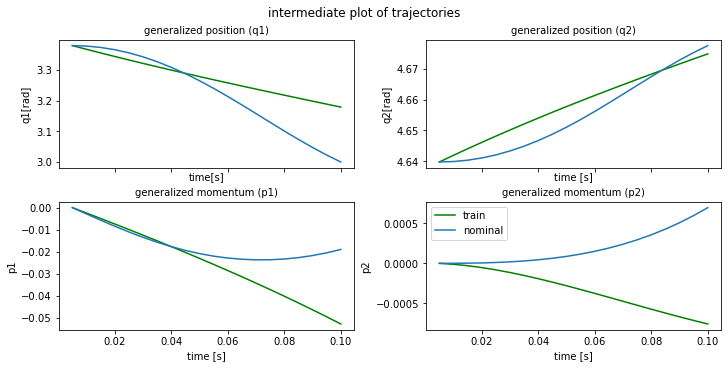

plot time : 0.540172815322876


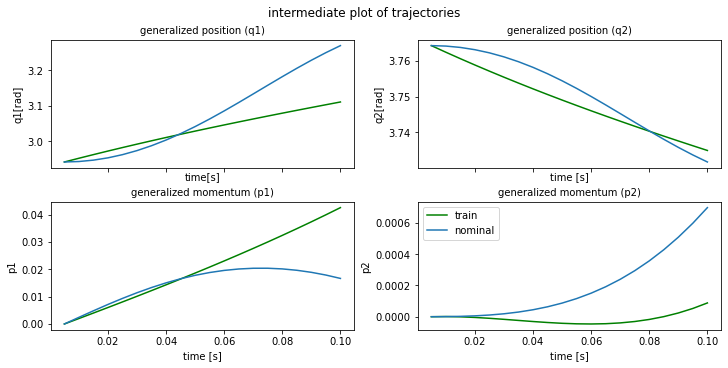

plot time : 0.4843578338623047
epoch  110 | train time 1.85 | train loss 1.676339e-02 
epoch  111 | train time 0.76 | train loss 1.665414e-02 
epoch  112 | train time 0.97 | train loss 1.502633e-02 
epoch  113 | train time 0.86 | train loss 1.602394e-02 
epoch  114 | train time 0.90 | train loss 1.582336e-02 
epoch  115 | train time 0.82 | train loss 1.633811e-02 
epoch  116 | train time 0.85 | train loss 1.368845e-02 
epoch  117 | train time 0.77 | train loss 1.319460e-02 
epoch  118 | train time 0.77 | train loss 1.531463e-02 
epoch  119 | train time 0.76 | train loss 1.418572e-02 


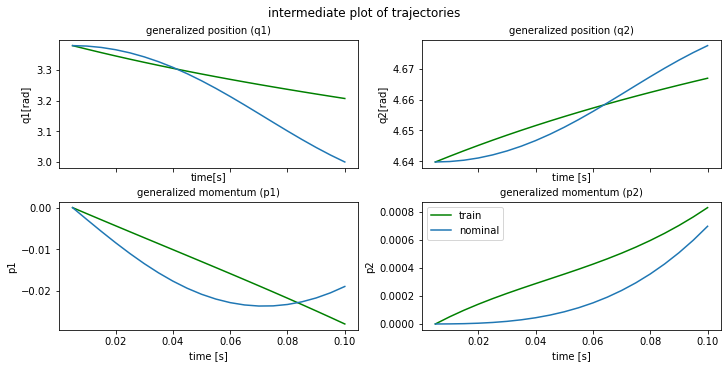

plot time : 0.5991356372833252


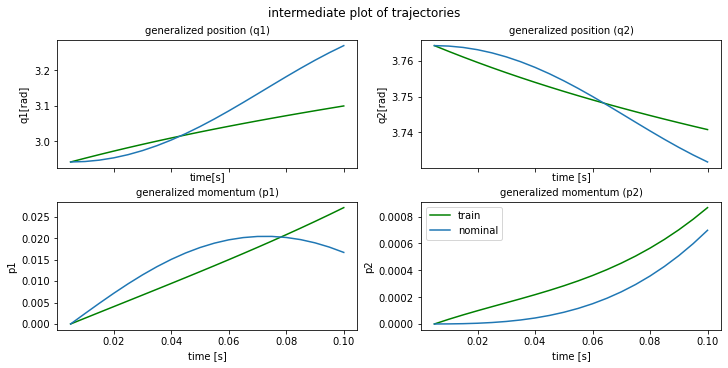

plot time : 0.5637187957763672
epoch  120 | train time 2.03 | train loss 1.487695e-02 
epoch  121 | train time 0.94 | train loss 1.281474e-02 
epoch  122 | train time 0.77 | train loss 1.513643e-02 
epoch  123 | train time 1.09 | train loss 1.226516e-02 
epoch  124 | train time 0.88 | train loss 1.664663e-02 
epoch  125 | train time 0.94 | train loss 1.543773e-02 
epoch  126 | train time 0.90 | train loss 1.246303e-02 
epoch  127 | train time 0.77 | train loss 2.424237e-02 
epoch  128 | train time 0.80 | train loss 3.107372e-02 
epoch  129 | train time 1.04 | train loss 1.234048e-02 


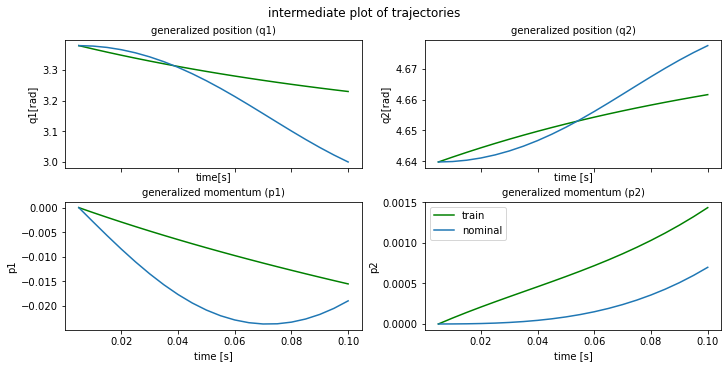

plot time : 0.6511080265045166


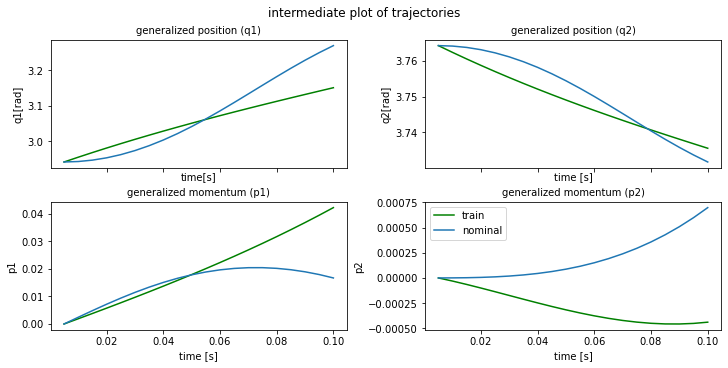

plot time : 0.4929201602935791
epoch  130 | train time 1.92 | train loss 1.941094e-02 
epoch  131 | train time 1.07 | train loss 4.357492e-02 
epoch  132 | train time 0.91 | train loss 4.545206e-02 
epoch  133 | train time 0.80 | train loss 9.924957e-02 
epoch  134 | train time 0.97 | train loss 2.989029e-02 
epoch  135 | train time 0.91 | train loss 3.294626e-02 
epoch  136 | train time 1.14 | train loss 8.122911e-02 
epoch  137 | train time 0.88 | train loss 3.647255e-02 
epoch  138 | train time 0.81 | train loss 6.127634e-02 
epoch  139 | train time 0.91 | train loss 2.785986e-02 


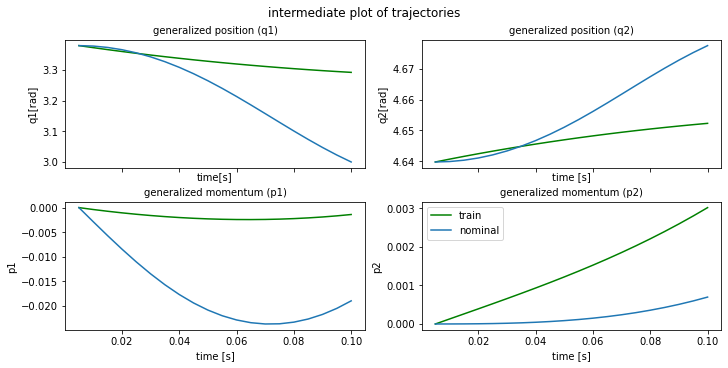

plot time : 0.5740420818328857


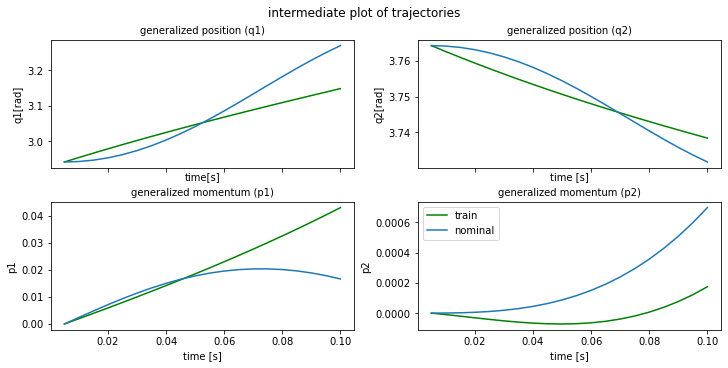

plot time : 0.5333571434020996
epoch  140 | train time 2.00 | train loss 3.197694e-02 
epoch  141 | train time 0.74 | train loss 2.905987e-02 
epoch  142 | train time 1.12 | train loss 2.741262e-02 
epoch  143 | train time 0.81 | train loss 4.507731e-02 
epoch  144 | train time 0.89 | train loss 2.018160e-02 
epoch  145 | train time 0.96 | train loss 1.961276e-02 
epoch  146 | train time 0.75 | train loss 1.867038e-02 
epoch  147 | train time 0.91 | train loss 1.719895e-02 
epoch  148 | train time 0.92 | train loss 1.804550e-02 
epoch  149 | train time 0.80 | train loss 2.246031e-02 


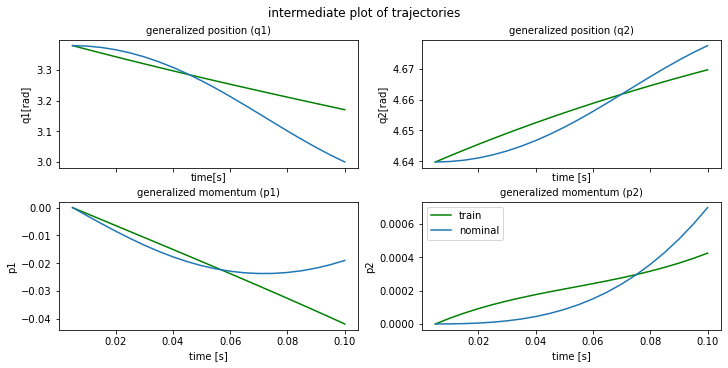

plot time : 0.5902247428894043


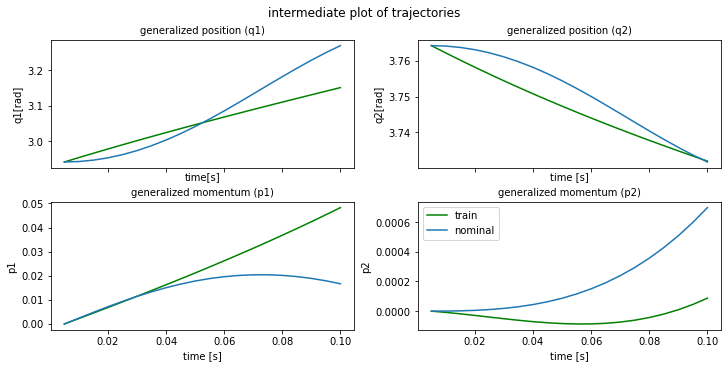

plot time : 0.549971342086792
epoch  150 | train time 1.99 | train loss 1.682255e-02 
epoch  151 | train time 1.11 | train loss 1.860273e-02 
epoch  152 | train time 0.77 | train loss 1.894695e-02 
epoch  153 | train time 0.76 | train loss 1.898478e-02 
epoch  154 | train time 0.87 | train loss 2.219273e-02 
epoch  155 | train time 0.97 | train loss 1.744995e-02 
epoch  156 | train time 0.79 | train loss 1.700817e-02 
epoch  157 | train time 1.08 | train loss 1.572831e-02 
epoch  158 | train time 0.98 | train loss 1.446368e-02 
epoch  159 | train time 0.78 | train loss 1.451492e-02 


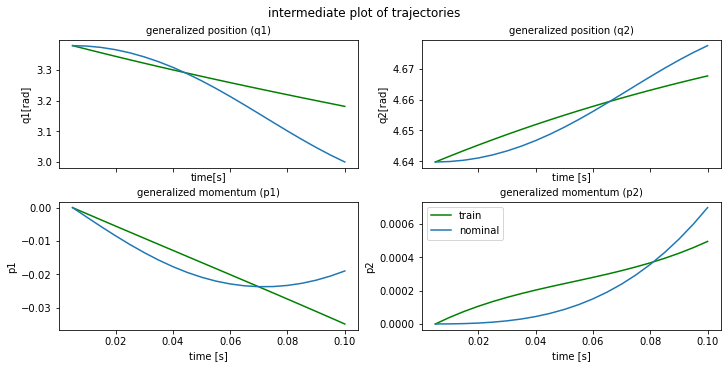

plot time : 0.5893981456756592


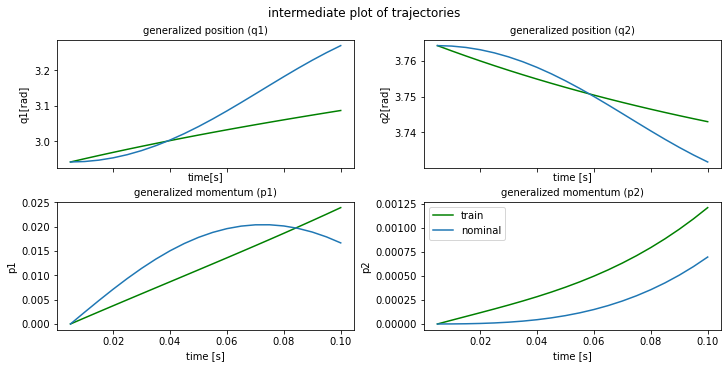

plot time : 0.534407377243042
epoch  160 | train time 2.01 | train loss 1.426440e-02 
epoch  161 | train time 0.92 | train loss 1.545725e-02 
epoch  162 | train time 0.74 | train loss 1.590291e-02 
epoch  163 | train time 0.67 | train loss 1.525188e-02 
epoch  164 | train time 0.84 | train loss 1.388860e-02 
epoch  165 | train time 0.77 | train loss 1.471593e-02 
epoch  166 | train time 0.71 | train loss 1.564080e-02 
epoch  167 | train time 0.69 | train loss 1.522933e-02 
epoch  168 | train time 0.81 | train loss 1.304981e-02 
epoch  169 | train time 0.73 | train loss 1.342368e-02 


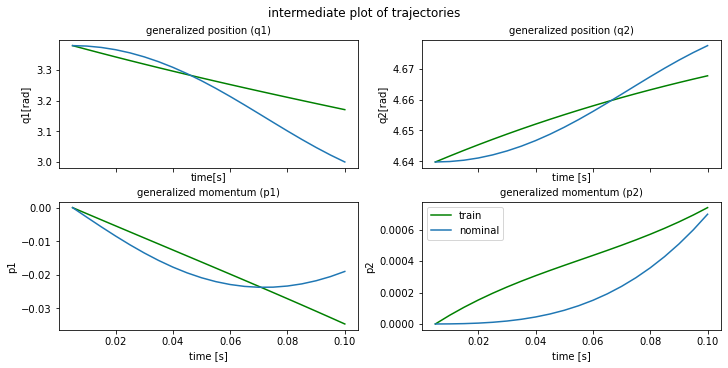

plot time : 0.6502068042755127


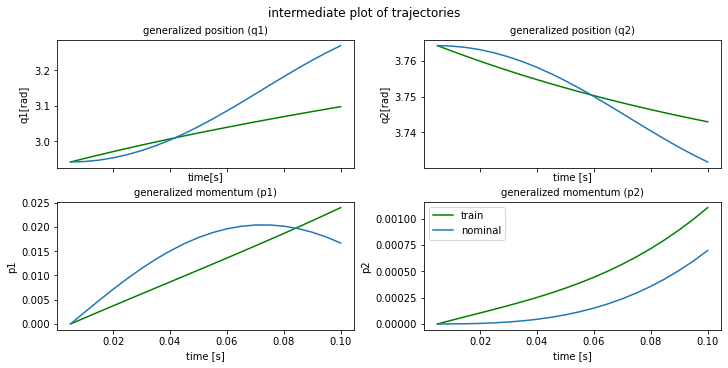

plot time : 0.4928700923919678
epoch  170 | train time 1.84 | train loss 1.278772e-02 
epoch  171 | train time 0.68 | train loss 1.351702e-02 
epoch  172 | train time 0.66 | train loss 1.475693e-02 
epoch  173 | train time 0.73 | train loss 1.483998e-02 
epoch  174 | train time 0.75 | train loss 1.315789e-02 
epoch  175 | train time 0.82 | train loss 1.574501e-02 
epoch  176 | train time 0.90 | train loss 1.504705e-02 
epoch  177 | train time 0.83 | train loss 1.402168e-02 
epoch  178 | train time 0.71 | train loss 1.626508e-02 
epoch  179 | train time 0.79 | train loss 1.409723e-02 


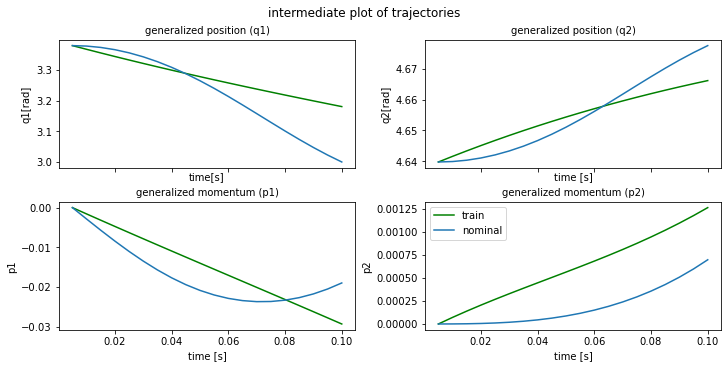

plot time : 0.484358549118042


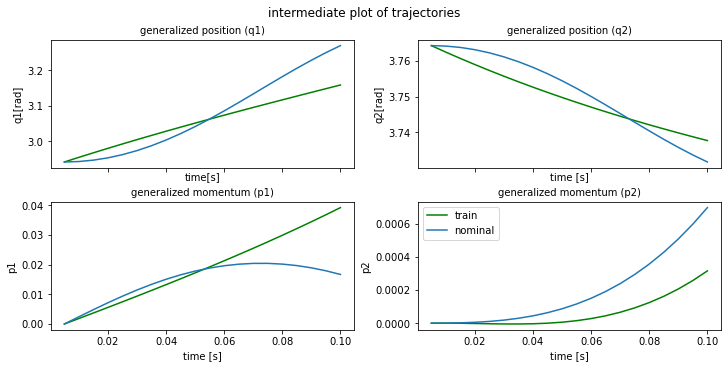

plot time : 0.4687337875366211
epoch  180 | train time 1.78 | train loss 1.190438e-02 
epoch  181 | train time 0.75 | train loss 1.378704e-02 
epoch  182 | train time 0.66 | train loss 1.675056e-02 
epoch  183 | train time 0.90 | train loss 1.153094e-02 
epoch  184 | train time 0.92 | train loss 1.072297e-02 
epoch  185 | train time 0.85 | train loss 1.121333e-02 
epoch  186 | train time 0.97 | train loss 1.083872e-02 
epoch  187 | train time 0.71 | train loss 1.097930e-02 
epoch  188 | train time 0.73 | train loss 1.034586e-02 
epoch  189 | train time 0.76 | train loss 9.965263e-03 


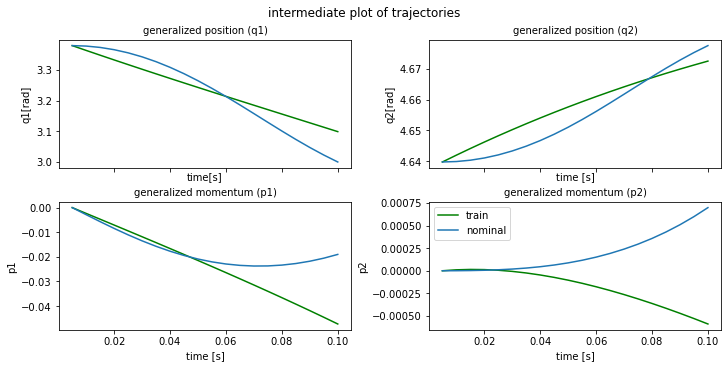

plot time : 0.6144163608551025


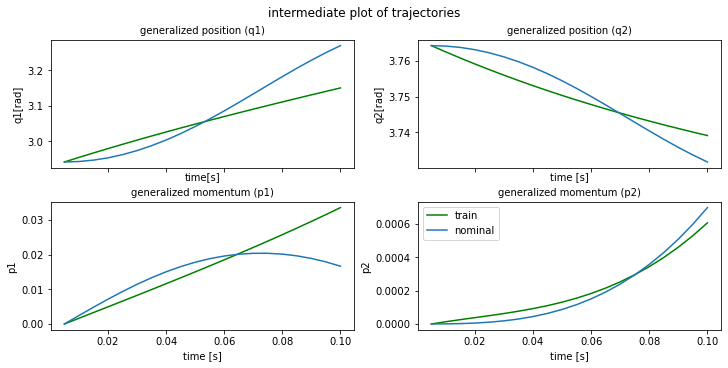

plot time : 0.48856019973754883
epoch  190 | train time 1.93 | train loss 9.563114e-03 
epoch  191 | train time 0.68 | train loss 9.459202e-03 
epoch  192 | train time 0.73 | train loss 9.465591e-03 
epoch  193 | train time 0.76 | train loss 8.944393e-03 
epoch  194 | train time 0.68 | train loss 8.818289e-03 
epoch  195 | train time 0.74 | train loss 8.742481e-03 
epoch  196 | train time 0.89 | train loss 8.775036e-03 
epoch  197 | train time 0.82 | train loss 8.230567e-03 
epoch  198 | train time 0.67 | train loss 8.060004e-03 
epoch  199 | train time 0.69 | train loss 8.504719e-03 


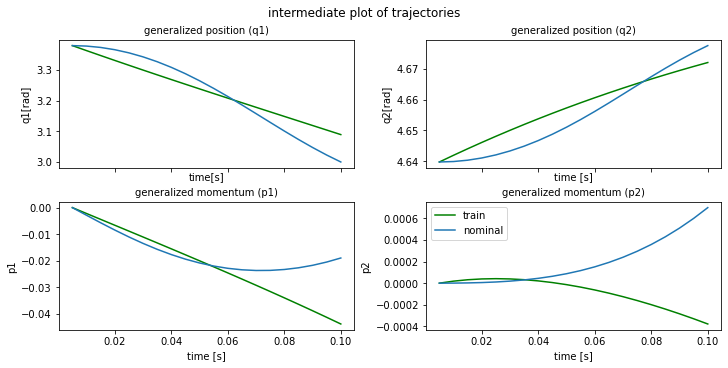

plot time : 0.6366536617279053


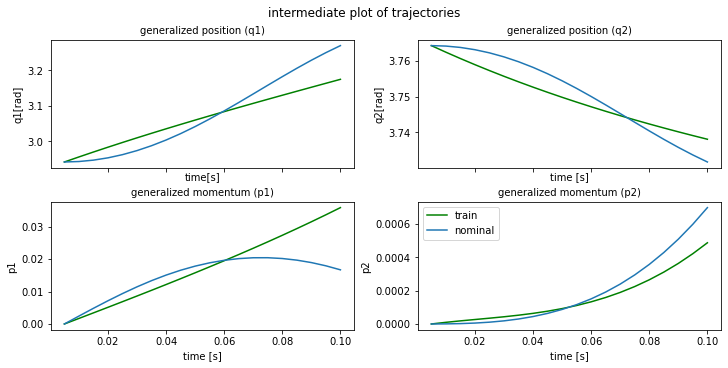

plot time : 0.4797661304473877
epoch  200 | train time 1.91 | train loss 8.205066e-03 
epoch  201 | train time 0.76 | train loss 7.675467e-03 
epoch  202 | train time 0.77 | train loss 7.567491e-03 
epoch  203 | train time 0.89 | train loss 7.668430e-03 
epoch  204 | train time 0.68 | train loss 8.427646e-03 
epoch  205 | train time 0.73 | train loss 8.743961e-03 
epoch  206 | train time 0.76 | train loss 7.863516e-03 
epoch  207 | train time 0.79 | train loss 7.512626e-03 
epoch  208 | train time 0.65 | train loss 7.656177e-03 
epoch  209 | train time 0.80 | train loss 8.757207e-03 


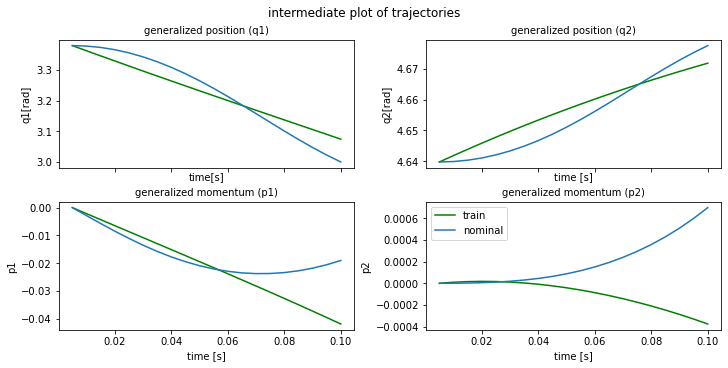

plot time : 0.6293895244598389


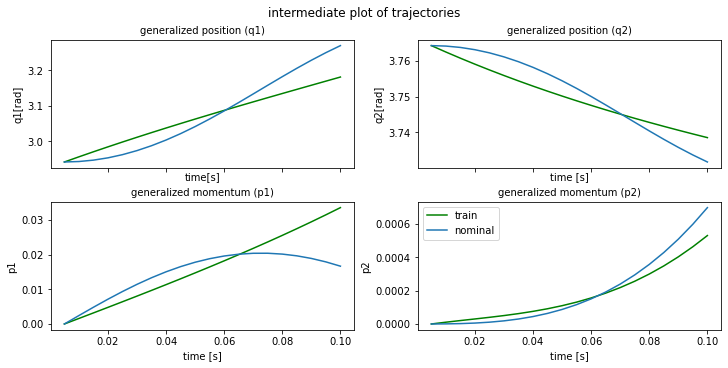

plot time : 0.5458030700683594
epoch  210 | train time 1.97 | train loss 7.054204e-03 
epoch  211 | train time 0.67 | train loss 6.929345e-03 
epoch  212 | train time 0.91 | train loss 8.032308e-03 
epoch  213 | train time 0.99 | train loss 7.686025e-03 
epoch  214 | train time 0.84 | train loss 7.440183e-03 
epoch  215 | train time 0.67 | train loss 7.675931e-03 
epoch  216 | train time 0.75 | train loss 7.633208e-03 
epoch  217 | train time 0.87 | train loss 6.571073e-03 
epoch  218 | train time 0.63 | train loss 6.182589e-03 
epoch  219 | train time 0.76 | train loss 9.923486e-03 


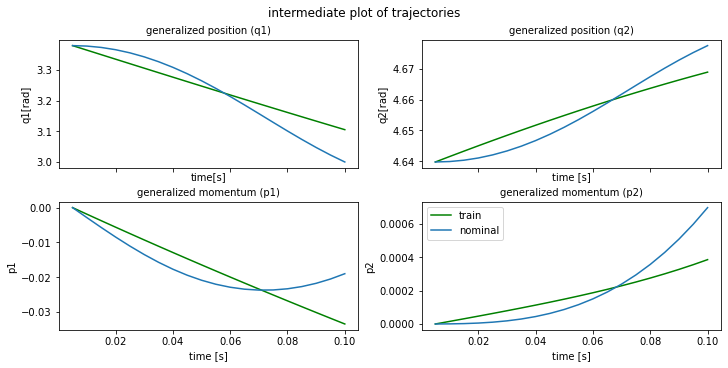

plot time : 0.5971081256866455


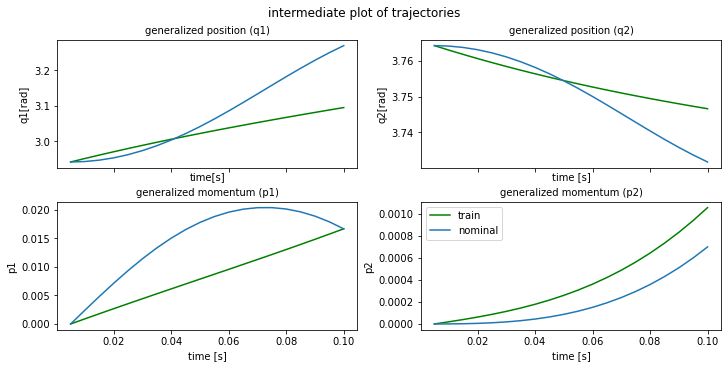

plot time : 0.5021340847015381
epoch  220 | train time 1.82 | train loss 1.442000e-02 
epoch  221 | train time 0.72 | train loss 1.426334e-02 
epoch  222 | train time 0.71 | train loss 1.288379e-02 
epoch  223 | train time 0.87 | train loss 1.308497e-02 
epoch  224 | train time 0.67 | train loss 1.185566e-02 
epoch  225 | train time 0.72 | train loss 1.237220e-02 
epoch  226 | train time 0.81 | train loss 1.132620e-02 
epoch  227 | train time 0.70 | train loss 1.192296e-02 
epoch  228 | train time 0.89 | train loss 1.105651e-02 
epoch  229 | train time 0.74 | train loss 1.160270e-02 


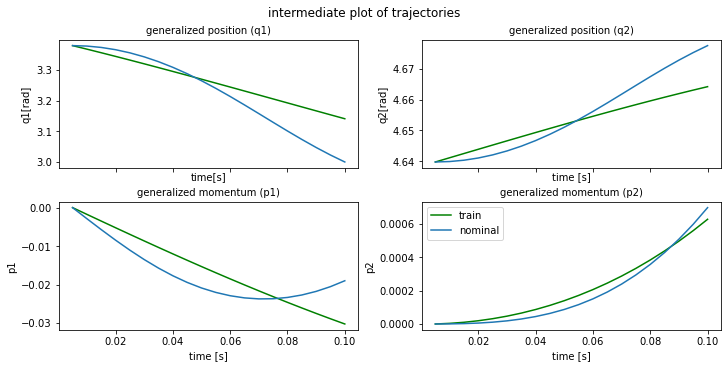

plot time : 0.5752074718475342


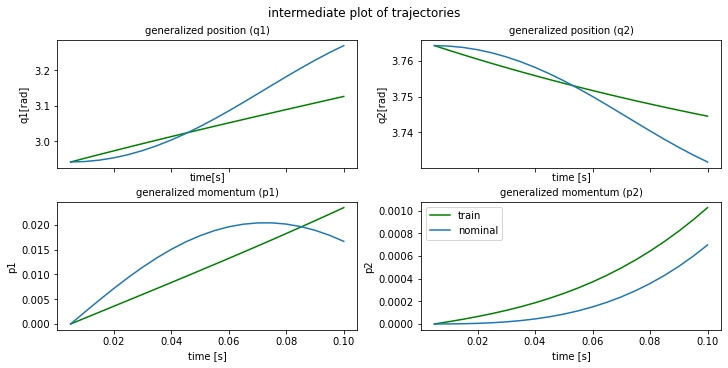

plot time : 0.5490953922271729
epoch  230 | train time 2.01 | train loss 1.084743e-02 
epoch  231 | train time 0.72 | train loss 1.132752e-02 
epoch  232 | train time 0.78 | train loss 1.067606e-02 
epoch  233 | train time 0.74 | train loss 1.109733e-02 
epoch  234 | train time 0.71 | train loss 1.050765e-02 
epoch  235 | train time 0.85 | train loss 1.092712e-02 
epoch  236 | train time 0.69 | train loss 1.031379e-02 
epoch  237 | train time 0.71 | train loss 1.078996e-02 
epoch  238 | train time 0.81 | train loss 1.016089e-02 
epoch  239 | train time 0.71 | train loss 1.066376e-02 


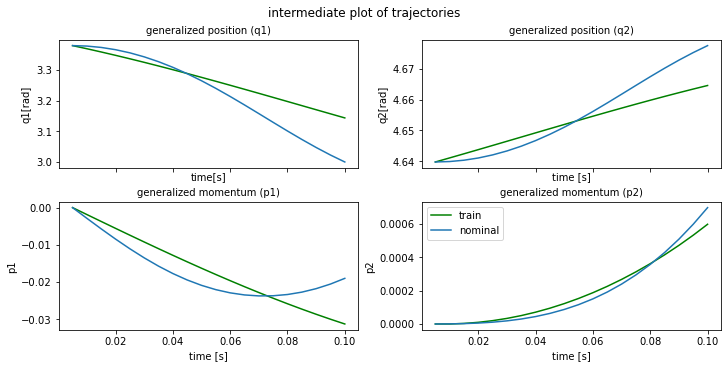

plot time : 0.6043546199798584


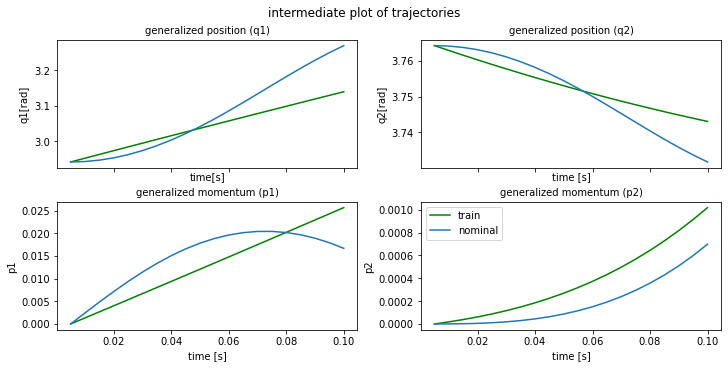

plot time : 0.5312302112579346
epoch  240 | train time 1.91 | train loss 1.002452e-02 
epoch  241 | train time 0.68 | train loss 1.057569e-02 
epoch  242 | train time 0.89 | train loss 9.912412e-03 
epoch  243 | train time 0.78 | train loss 1.050251e-02 
epoch  244 | train time 0.71 | train loss 9.823476e-03 
epoch  245 | train time 0.81 | train loss 1.047694e-02 
epoch  246 | train time 0.78 | train loss 9.765168e-03 
epoch  247 | train time 0.73 | train loss 1.047382e-02 
epoch  248 | train time 1.04 | train loss 9.733569e-03 
epoch  249 | train time 0.68 | train loss 9.727514e-03 


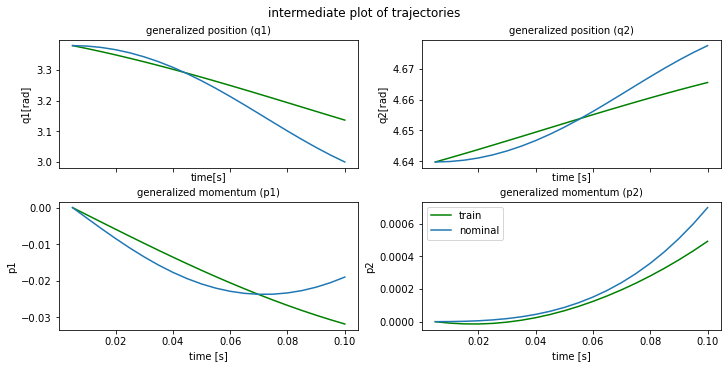

plot time : 0.685896635055542


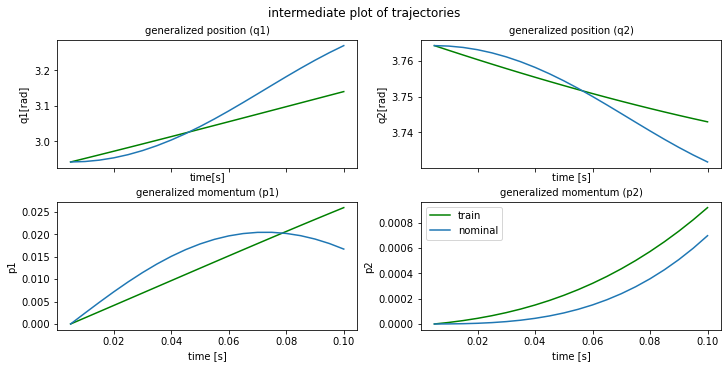

plot time : 0.4964413642883301
epoch  250 | train time 1.97 | train loss 9.656681e-03 
epoch  251 | train time 0.83 | train loss 9.318375e-03 
epoch  252 | train time 0.86 | train loss 9.550399e-03 
epoch  253 | train time 0.80 | train loss 9.563028e-03 
epoch  254 | train time 0.73 | train loss 8.049580e-03 
epoch  255 | train time 0.84 | train loss 1.113074e-02 
epoch  256 | train time 0.70 | train loss 1.066829e-02 
epoch  257 | train time 0.87 | train loss 1.123427e-02 
epoch  258 | train time 0.72 | train loss 1.662608e-02 
epoch  259 | train time 0.81 | train loss 1.095454e-02 


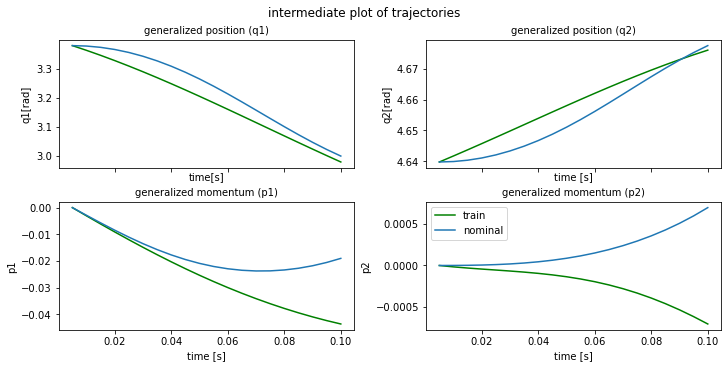

plot time : 0.5389745235443115


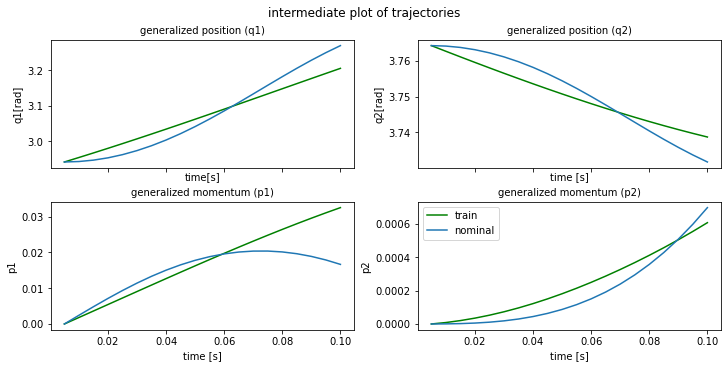

plot time : 0.4999659061431885
epoch  260 | train time 2.01 | train loss 1.111545e-02 
epoch  261 | train time 0.68 | train loss 8.813341e-03 
epoch  262 | train time 0.86 | train loss 1.412327e-02 
epoch  263 | train time 0.81 | train loss 8.003228e-03 
epoch  264 | train time 0.87 | train loss 6.925071e-03 
epoch  265 | train time 0.69 | train loss 7.746589e-03 
epoch  266 | train time 0.79 | train loss 9.133197e-03 
epoch  267 | train time 0.87 | train loss 9.126005e-03 
epoch  268 | train time 0.68 | train loss 6.892272e-03 
epoch  269 | train time 0.81 | train loss 6.887821e-03 


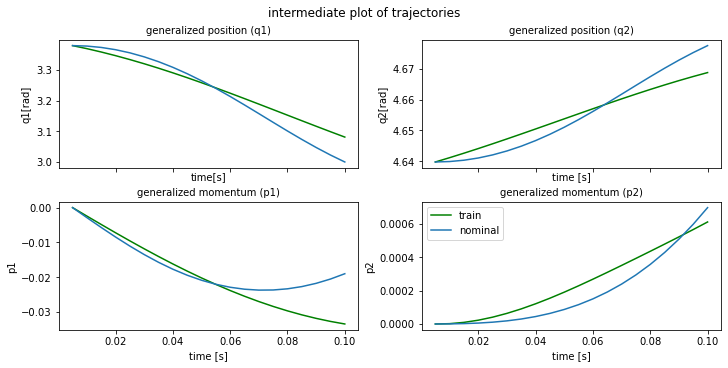

plot time : 0.5468566417694092


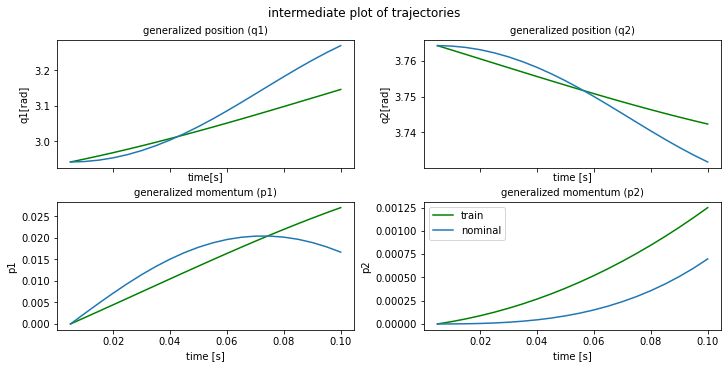

plot time : 0.5155870914459229
epoch  270 | train time 1.89 | train loss 6.953961e-03 
epoch  271 | train time 0.76 | train loss 9.673681e-03 
epoch  272 | train time 0.77 | train loss 8.962967e-03 
epoch  273 | train time 0.82 | train loss 7.901288e-03 
epoch  274 | train time 0.68 | train loss 9.683974e-03 
epoch  275 | train time 0.85 | train loss 9.084323e-03 
epoch  276 | train time 0.74 | train loss 5.801618e-03 
epoch  277 | train time 0.71 | train loss 6.764675e-03 
epoch  278 | train time 1.01 | train loss 8.983728e-03 
epoch  279 | train time 0.73 | train loss 6.597297e-03 


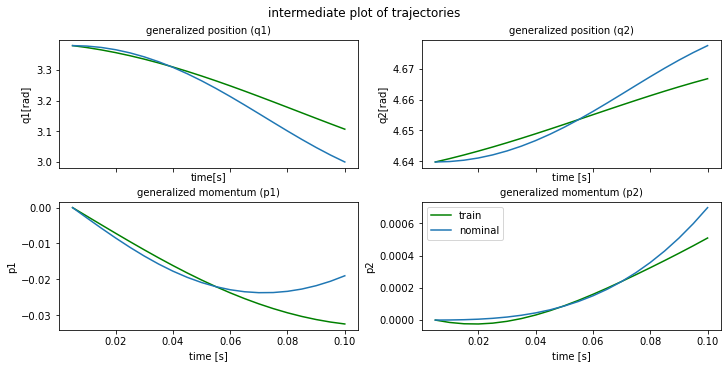

plot time : 0.6407012939453125


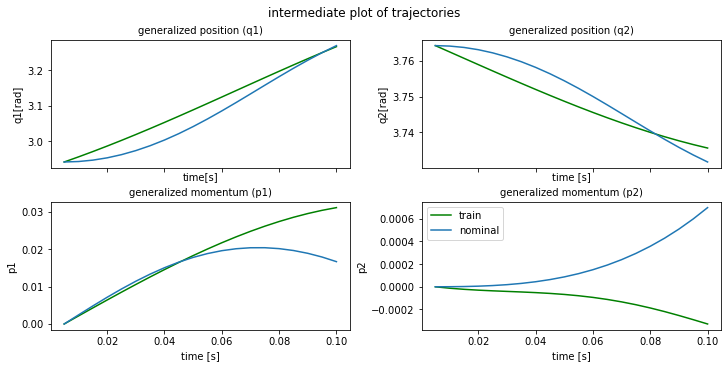

plot time : 0.5054528713226318
epoch  280 | train time 1.98 | train loss 8.120546e-03 
epoch  281 | train time 0.65 | train loss 6.886018e-03 
epoch  282 | train time 0.89 | train loss 7.814156e-03 
epoch  283 | train time 0.64 | train loss 6.739245e-03 
epoch  284 | train time 0.78 | train loss 7.816285e-03 
epoch  285 | train time 0.72 | train loss 6.363546e-03 
epoch  286 | train time 0.75 | train loss 7.716568e-03 
epoch  287 | train time 0.87 | train loss 6.275289e-03 
epoch  288 | train time 0.65 | train loss 7.490684e-03 
epoch  289 | train time 0.68 | train loss 6.084072e-03 


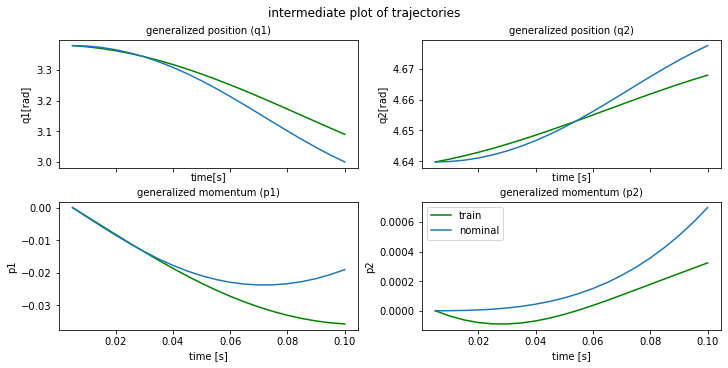

plot time : 0.6276149749755859


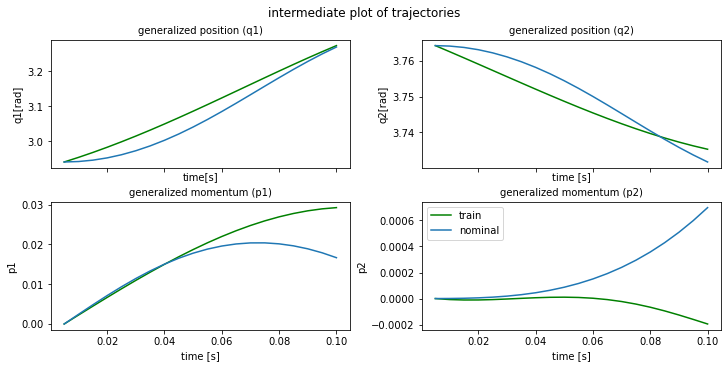

plot time : 0.4968900680541992
epoch  290 | train time 1.88 | train loss 7.381836e-03 
epoch  291 | train time 0.71 | train loss 5.979132e-03 
epoch  292 | train time 0.86 | train loss 7.163204e-03 
epoch  293 | train time 0.72 | train loss 6.031746e-03 
epoch  294 | train time 0.77 | train loss 6.931114e-03 
epoch  295 | train time 0.85 | train loss 6.030138e-03 
epoch  296 | train time 0.66 | train loss 6.811902e-03 
epoch  297 | train time 0.92 | train loss 5.976604e-03 
epoch  298 | train time 0.67 | train loss 6.722773e-03 
epoch  299 | train time 0.76 | train loss 5.904120e-03 


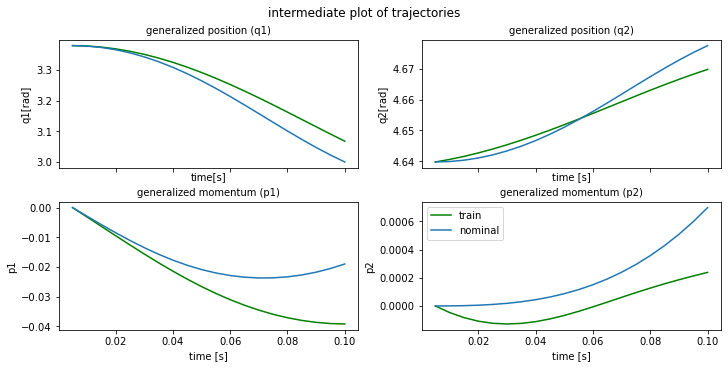

plot time : 0.6110885143280029


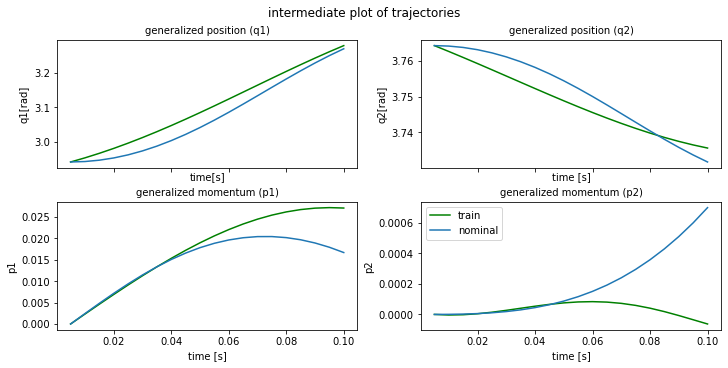

plot time : 0.5105874538421631
epoch  300 | train time 2.06 | train loss 6.626415e-03 
horizon length : 40
epoch  301 | train time 1.90 | train loss 5.002608e-02 
epoch  302 | train time 1.92 | train loss 2.736532e-02 
epoch  303 | train time 1.85 | train loss 3.695506e-02 
epoch  304 | train time 1.96 | train loss 2.248026e-02 
epoch  305 | train time 2.07 | train loss 4.445491e-02 
epoch  306 | train time 2.09 | train loss 4.390049e-02 
epoch  307 | train time 2.20 | train loss 9.203597e-02 
epoch  308 | train time 1.86 | train loss 2.437775e-02 
epoch  309 | train time 1.98 | train loss 2.286913e-02 


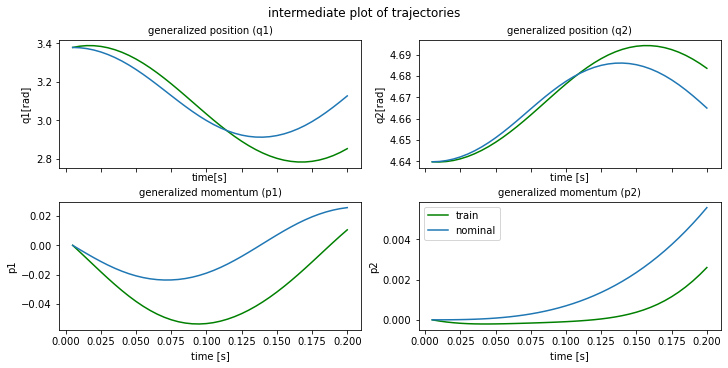

plot time : 0.5193219184875488


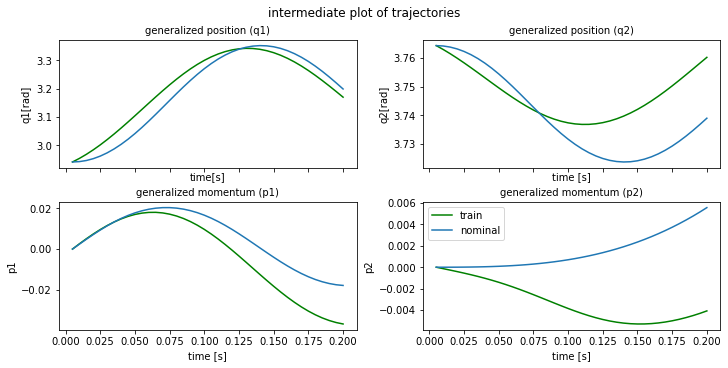

plot time : 0.556934118270874
epoch  310 | train time 2.87 | train loss 6.148702e-02 
epoch  311 | train time 1.90 | train loss 3.464695e-02 
epoch  312 | train time 1.74 | train loss 3.639704e-02 
epoch  313 | train time 1.87 | train loss 6.507557e-02 
epoch  314 | train time 1.88 | train loss 2.732933e-02 
epoch  315 | train time 1.86 | train loss 2.298407e-02 
epoch  316 | train time 1.88 | train loss 1.605667e-02 
epoch  317 | train time 1.83 | train loss 1.132460e-02 
epoch  318 | train time 1.82 | train loss 2.188250e-02 
epoch  319 | train time 1.90 | train loss 4.351113e-02 


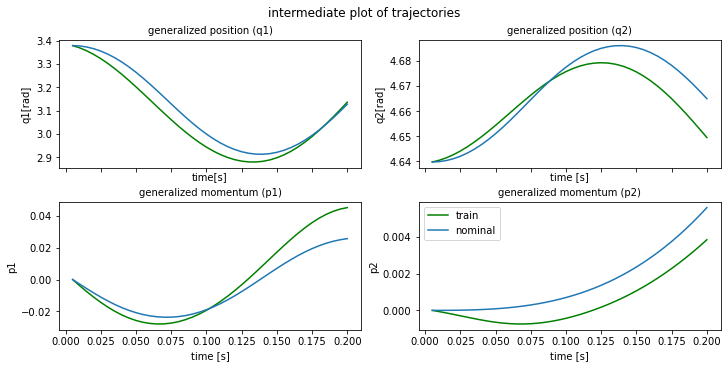

plot time : 0.6117663383483887


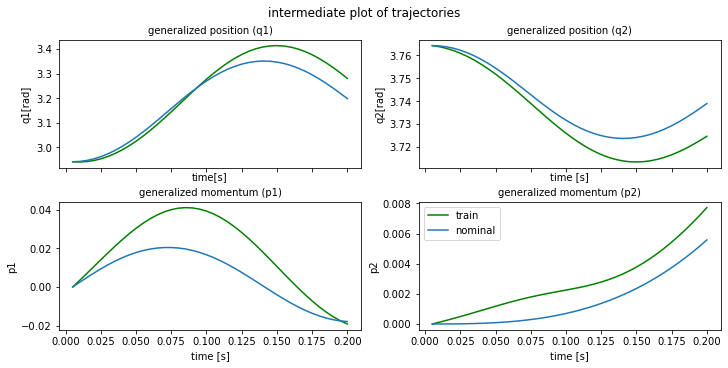

plot time : 0.5781028270721436
epoch  320 | train time 3.27 | train loss 2.996648e-02 
epoch  321 | train time 1.79 | train loss 2.031765e-02 
epoch  322 | train time 1.91 | train loss 1.706802e-02 
epoch  323 | train time 1.85 | train loss 3.003204e-02 
epoch  324 | train time 1.96 | train loss 3.079340e-02 
epoch  325 | train time 1.94 | train loss 3.068774e-02 
epoch  326 | train time 1.86 | train loss 3.602422e-02 
epoch  327 | train time 1.84 | train loss 2.204921e-02 
epoch  328 | train time 1.87 | train loss 2.428321e-02 
epoch  329 | train time 2.21 | train loss 1.460748e-02 


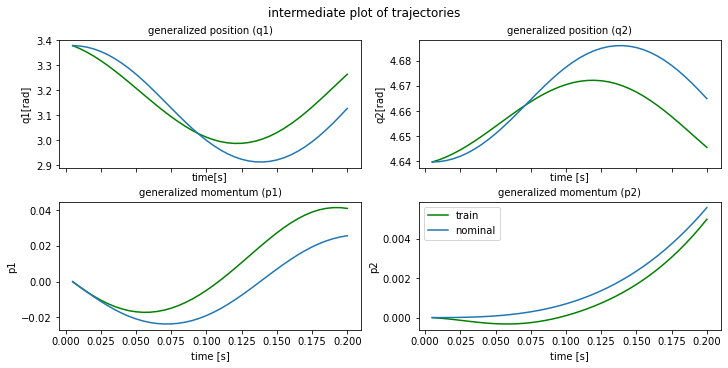

plot time : 0.6413168907165527


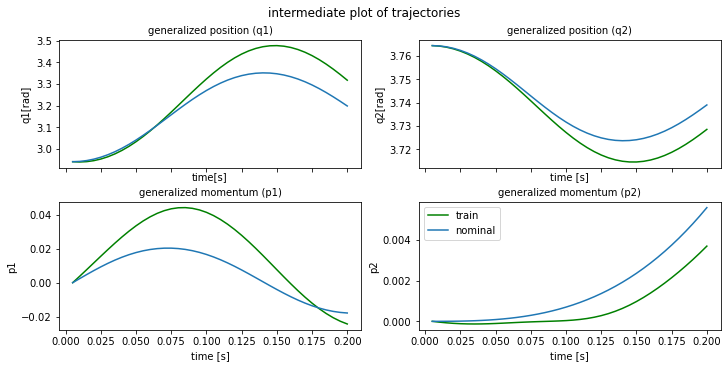

plot time : 0.6196341514587402
epoch  330 | train time 3.21 | train loss 4.475404e-02 
epoch  331 | train time 1.77 | train loss 2.932324e-02 
epoch  332 | train time 1.89 | train loss 4.198181e-02 
epoch  333 | train time 1.80 | train loss 4.165217e-02 
epoch  334 | train time 1.73 | train loss 3.093336e-02 
epoch  335 | train time 1.78 | train loss 2.365000e-02 
epoch  336 | train time 1.87 | train loss 2.766770e-02 
epoch  337 | train time 2.08 | train loss 2.237006e-02 
epoch  338 | train time 1.87 | train loss 1.925043e-02 
epoch  339 | train time 1.84 | train loss 4.216603e-02 


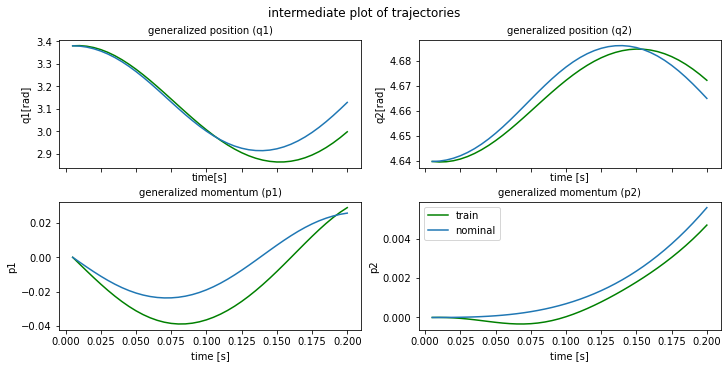

plot time : 0.5649173259735107


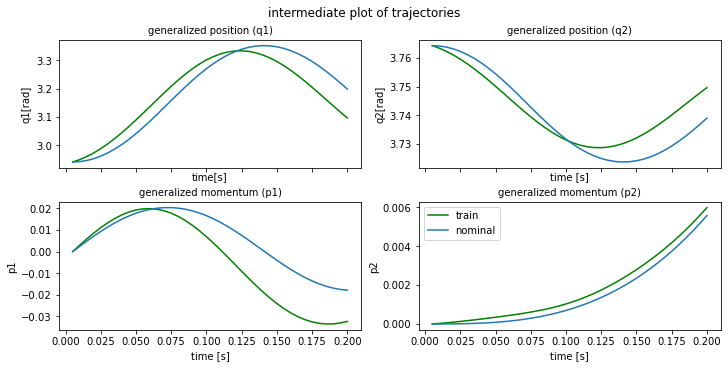

plot time : 1.083601713180542
epoch  340 | train time 3.93 | train loss 1.710388e-02 
epoch  341 | train time 3.08 | train loss 9.789743e-03 
epoch  342 | train time 2.96 | train loss 1.338951e-02 
epoch  343 | train time 2.85 | train loss 6.547621e-03 
epoch  344 | train time 2.19 | train loss 5.155167e-03 
epoch  345 | train time 2.23 | train loss 8.795296e-03 
epoch  346 | train time 2.40 | train loss 2.934623e-02 
epoch  347 | train time 2.28 | train loss 1.165060e-02 
epoch  348 | train time 2.40 | train loss 1.380712e-02 
epoch  349 | train time 2.28 | train loss 1.214386e-02 


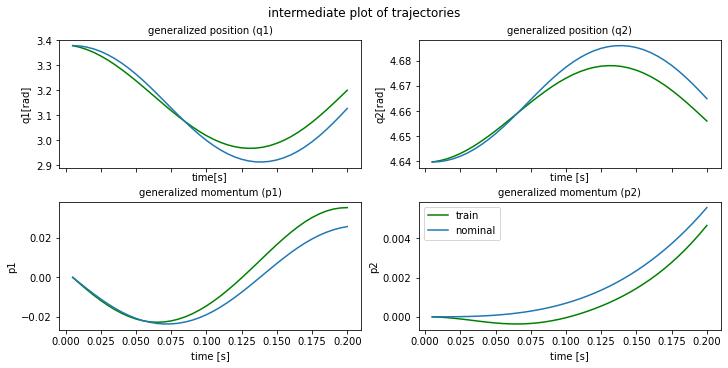

plot time : 0.5888264179229736


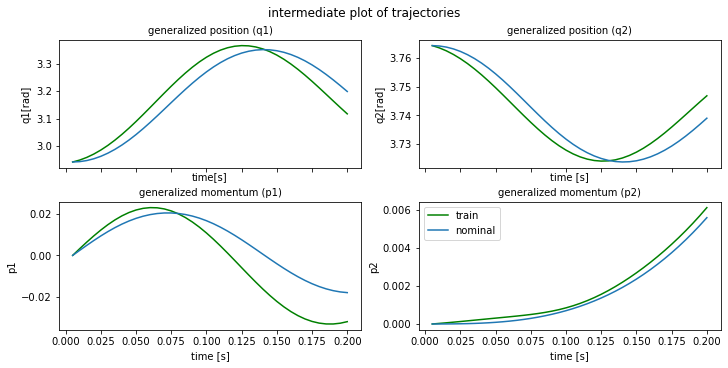

plot time : 0.7045087814331055
epoch  350 | train time 3.62 | train loss 1.257651e-02 
epoch  351 | train time 2.63 | train loss 7.874215e-03 
epoch  352 | train time 2.42 | train loss 1.386113e-02 
epoch  353 | train time 2.18 | train loss 1.247344e-02 
epoch  354 | train time 2.52 | train loss 2.847039e-03 
epoch  355 | train time 3.20 | train loss 3.442822e-03 
epoch  356 | train time 2.28 | train loss 5.335446e-03 
epoch  357 | train time 2.34 | train loss 1.943758e-03 
epoch  358 | train time 2.69 | train loss 2.483639e-03 
epoch  359 | train time 2.19 | train loss 1.820500e-03 


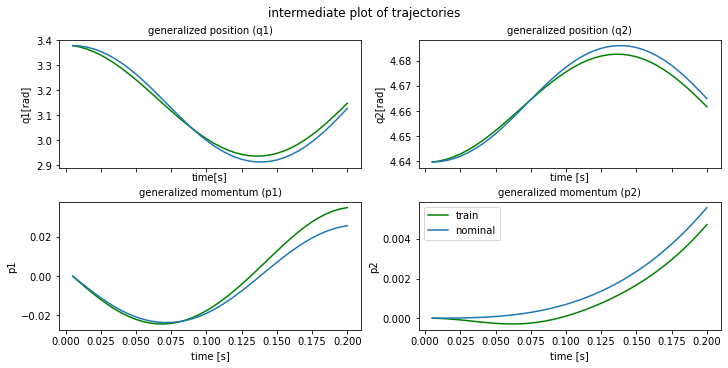

plot time : 0.6631982326507568


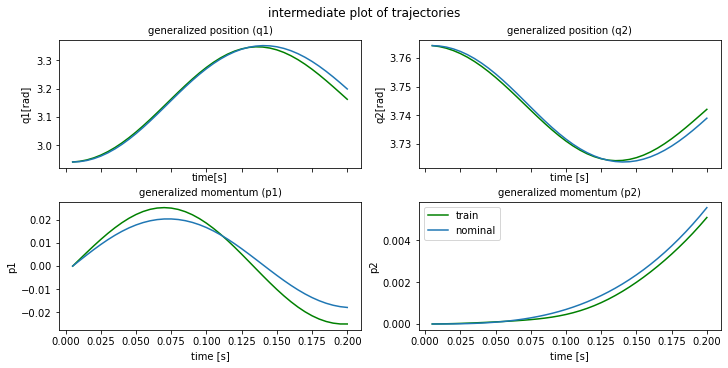

plot time : 0.5309526920318604
epoch  360 | train time 3.31 | train loss 3.971364e-03 
epoch  361 | train time 2.01 | train loss 1.349622e-03 
epoch  362 | train time 1.92 | train loss 2.438546e-03 
epoch  363 | train time 2.30 | train loss 3.371074e-03 
epoch  364 | train time 1.89 | train loss 3.150832e-03 
epoch  365 | train time 1.85 | train loss 2.346355e-03 
epoch  366 | train time 2.23 | train loss 2.820511e-03 
epoch  367 | train time 2.55 | train loss 2.607182e-03 
epoch  368 | train time 2.52 | train loss 1.327290e-03 
epoch  369 | train time 2.14 | train loss 3.617193e-03 


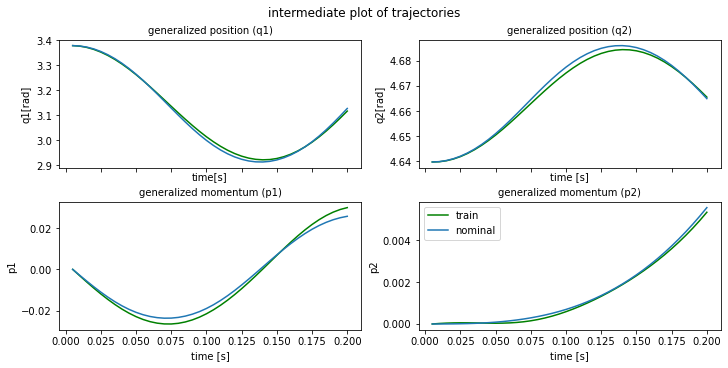

plot time : 0.5290160179138184


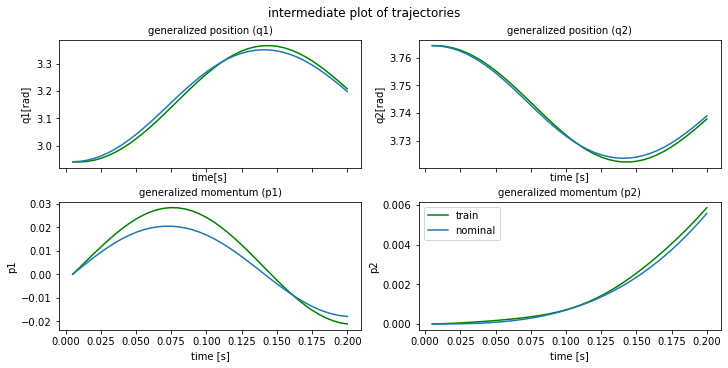

plot time : 0.6750946044921875
epoch  370 | train time 2.81 | train loss 1.469286e-03 
epoch  371 | train time 2.00 | train loss 3.928408e-03 
epoch  372 | train time 1.95 | train loss 1.663581e-02 
epoch  373 | train time 1.88 | train loss 3.498584e-03 
epoch  374 | train time 1.96 | train loss 1.006710e-02 
epoch  375 | train time 2.32 | train loss 5.861868e-03 
epoch  376 | train time 2.20 | train loss 6.650310e-03 
epoch  377 | train time 2.58 | train loss 7.614206e-03 
epoch  378 | train time 2.70 | train loss 4.846189e-03 
epoch  379 | train time 2.81 | train loss 9.432333e-03 


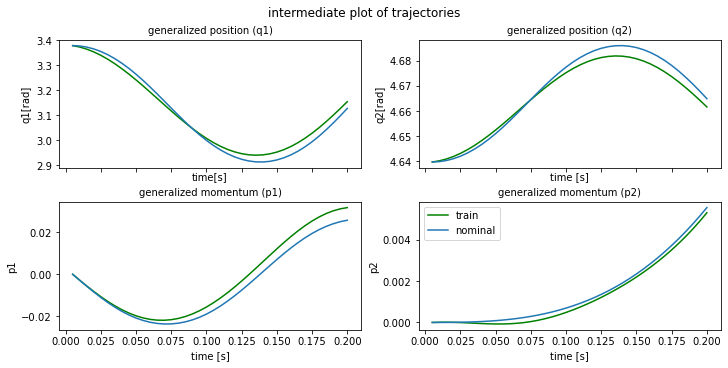

plot time : 0.8035376071929932


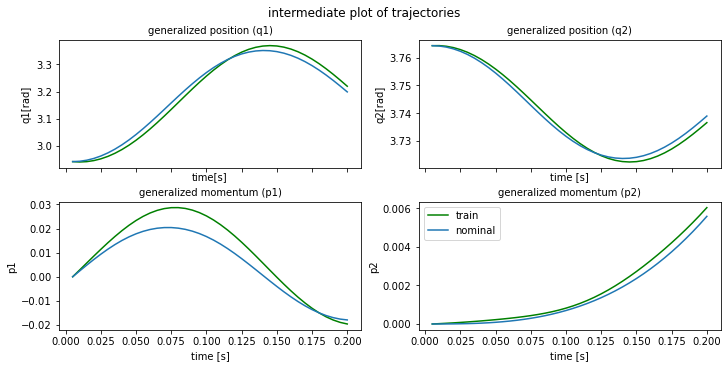

plot time : 0.8526918888092041
epoch  380 | train time 4.32 | train loss 3.812941e-03 
epoch  381 | train time 2.39 | train loss 1.069510e-02 
epoch  382 | train time 2.26 | train loss 3.248278e-03 
epoch  383 | train time 1.88 | train loss 1.154172e-02 
epoch  384 | train time 2.05 | train loss 2.945861e-03 
epoch  385 | train time 2.77 | train loss 1.125420e-02 
epoch  386 | train time 2.98 | train loss 3.506881e-03 
epoch  387 | train time 3.58 | train loss 9.035088e-03 
epoch  388 | train time 3.58 | train loss 4.924359e-03 
epoch  389 | train time 3.25 | train loss 6.004943e-03 


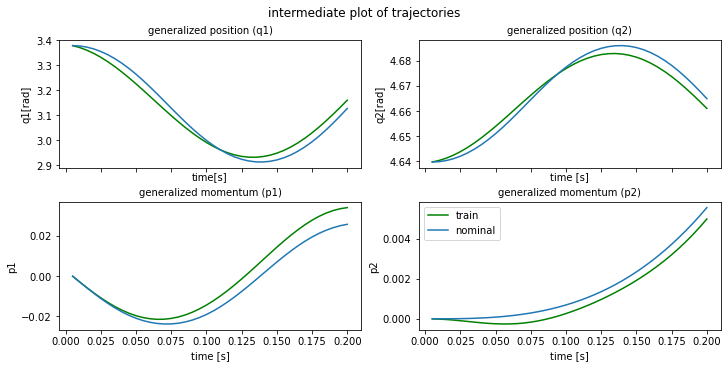

plot time : 1.0194132328033447


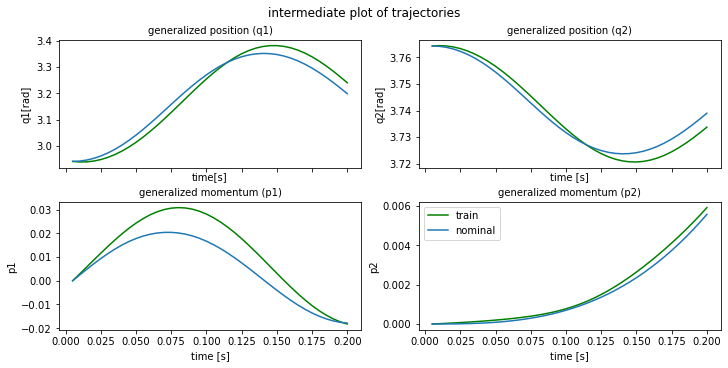

plot time : 0.9064798355102539
epoch  390 | train time 5.45 | train loss 6.680140e-03 
epoch  391 | train time 2.80 | train loss 4.158314e-03 
epoch  392 | train time 2.33 | train loss 7.782920e-03 
epoch  393 | train time 2.64 | train loss 3.385740e-03 
epoch  394 | train time 2.55 | train loss 8.581923e-03 
epoch  395 | train time 2.26 | train loss 2.981193e-03 
epoch  396 | train time 2.27 | train loss 8.664914e-03 
epoch  397 | train time 2.28 | train loss 3.057613e-03 
epoch  398 | train time 2.57 | train loss 8.167230e-03 
epoch  399 | train time 1.78 | train loss 3.431342e-03 


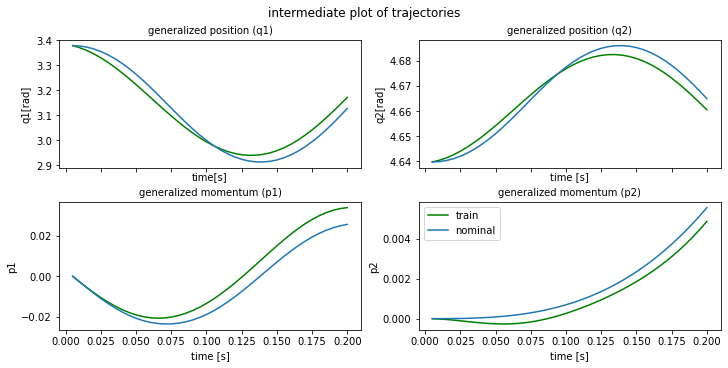

plot time : 0.7877659797668457


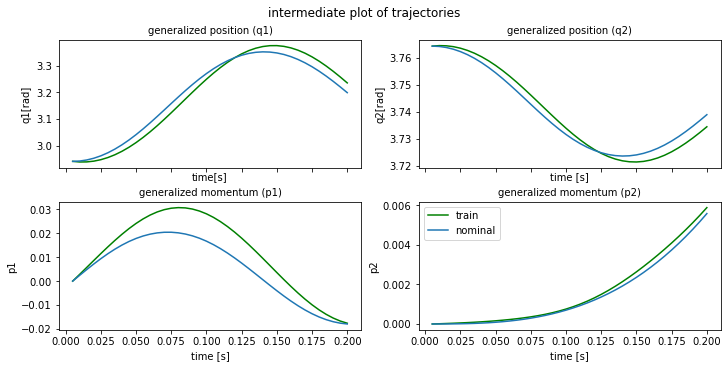

plot time : 0.6419081687927246
epoch  400 | train time 4.53 | train loss 7.166500e-03 
horizon length : 60
epoch  401 | train time 4.51 | train loss 4.528383e-03 
epoch  402 | train time 4.27 | train loss 6.673646e-03 
epoch  403 | train time 4.31 | train loss 5.186888e-03 
epoch  404 | train time 4.42 | train loss 6.292834e-03 
epoch  405 | train time 4.43 | train loss 6.101683e-03 
epoch  406 | train time 5.19 | train loss 5.079497e-03 
epoch  407 | train time 5.83 | train loss 5.886869e-03 
epoch  408 | train time 5.22 | train loss 4.985677e-03 
epoch  409 | train time 5.51 | train loss 5.260602e-03 


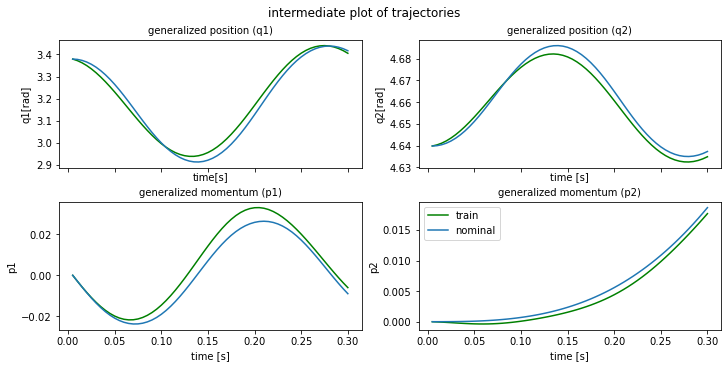

plot time : 0.7246780395507812


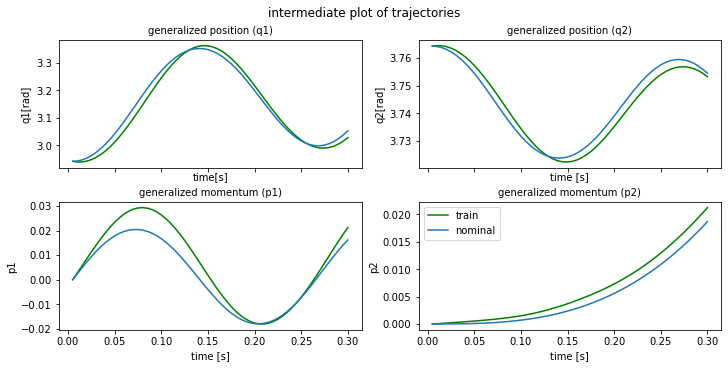

plot time : 0.7676441669464111
epoch  410 | train time 7.21 | train loss 5.440355e-03 
epoch  411 | train time 5.52 | train loss 4.924380e-03 
epoch  412 | train time 6.68 | train loss 5.560928e-03 
epoch  413 | train time 5.75 | train loss 5.164819e-03 
epoch  414 | train time 6.17 | train loss 5.075141e-03 
epoch  415 | train time 6.29 | train loss 5.455586e-03 
epoch  416 | train time 6.17 | train loss 4.912346e-03 
epoch  417 | train time 5.37 | train loss 5.242546e-03 
epoch  418 | train time 5.33 | train loss 5.214792e-03 
epoch  419 | train time 6.05 | train loss 5.217078e-03 


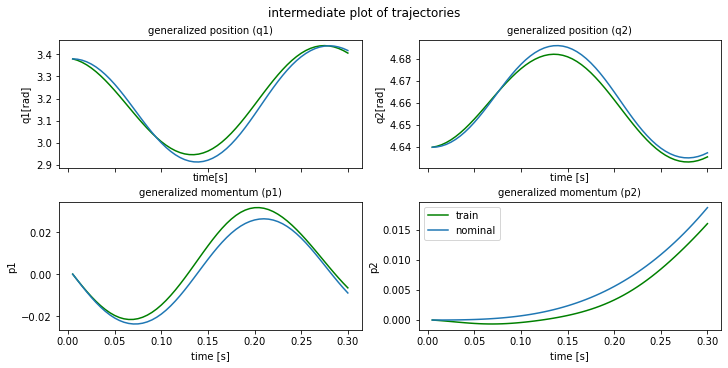

plot time : 0.5768740177154541


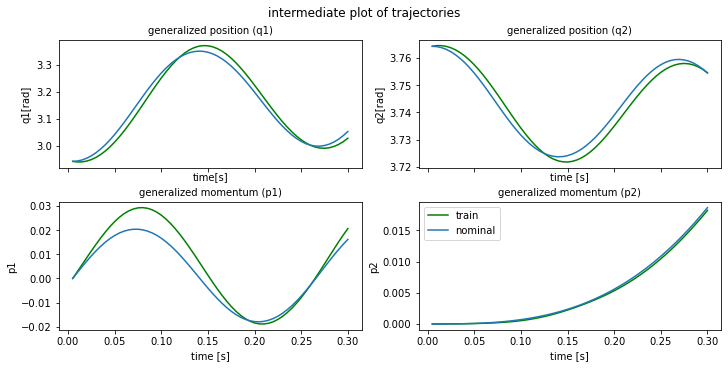

plot time : 0.787745475769043
epoch  420 | train time 7.30 | train loss 5.402963e-03 
epoch  421 | train time 6.90 | train loss 5.416629e-03 
epoch  422 | train time 5.20 | train loss 5.423500e-03 
epoch  423 | train time 6.38 | train loss 5.621517e-03 
epoch  424 | train time 5.79 | train loss 5.076325e-03 
epoch  425 | train time 5.95 | train loss 5.757852e-03 
epoch  426 | train time 5.00 | train loss 4.642671e-03 
epoch  427 | train time 5.25 | train loss 5.429585e-03 
epoch  428 | train time 5.01 | train loss 4.506866e-03 
epoch  429 | train time 5.11 | train loss 4.770368e-03 


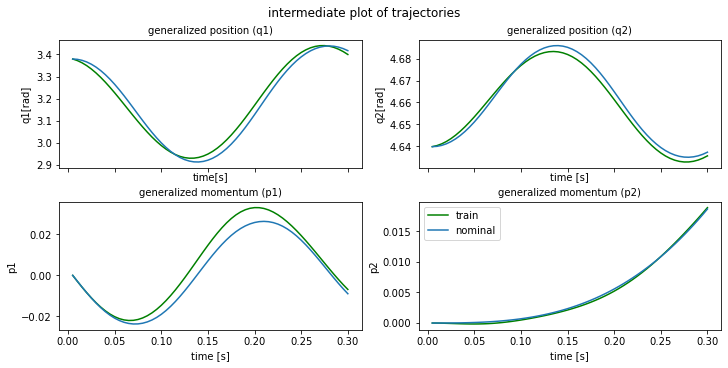

plot time : 0.6456284523010254


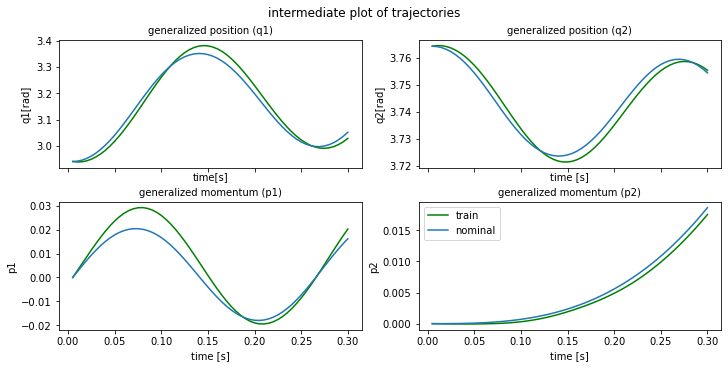

plot time : 0.6043047904968262
epoch  430 | train time 6.38 | train loss 4.532638e-03 
epoch  431 | train time 5.23 | train loss 4.187804e-03 
epoch  432 | train time 5.11 | train loss 4.533673e-03 
epoch  433 | train time 5.21 | train loss 3.893830e-03 
epoch  434 | train time 4.99 | train loss 4.436962e-03 
epoch  435 | train time 5.14 | train loss 3.822057e-03 
epoch  436 | train time 5.45 | train loss 4.317813e-03 
epoch  437 | train time 5.07 | train loss 3.871513e-03 
epoch  438 | train time 5.45 | train loss 4.221650e-03 
epoch  439 | train time 7.41 | train loss 3.986917e-03 


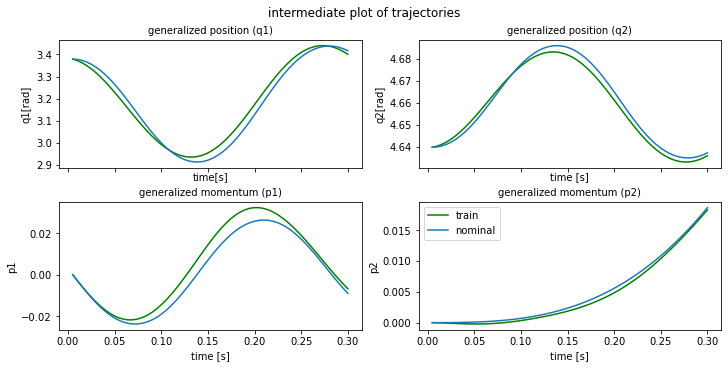

plot time : 0.8048863410949707


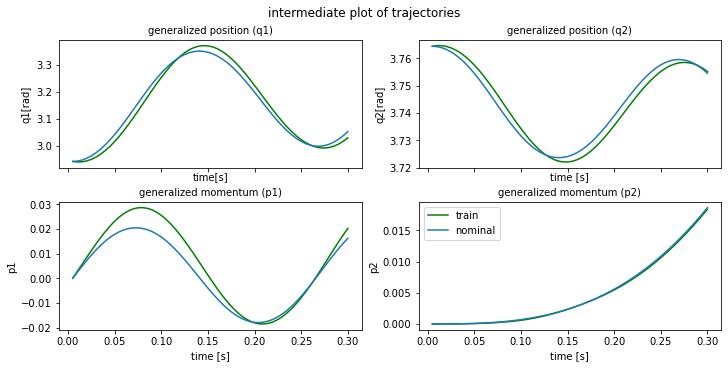

plot time : 0.8446857929229736
epoch  440 | train time 8.34 | train loss 4.134910e-03 
epoch  441 | train time 5.86 | train loss 4.103948e-03 
epoch  442 | train time 5.21 | train loss 4.033209e-03 
epoch  443 | train time 4.87 | train loss 4.199614e-03 
epoch  444 | train time 5.09 | train loss 3.911300e-03 
epoch  445 | train time 5.11 | train loss 4.264539e-03 
epoch  446 | train time 5.07 | train loss 3.781540e-03 
epoch  447 | train time 5.27 | train loss 4.300149e-03 
epoch  448 | train time 4.90 | train loss 3.663685e-03 
epoch  449 | train time 5.43 | train loss 4.304678e-03 


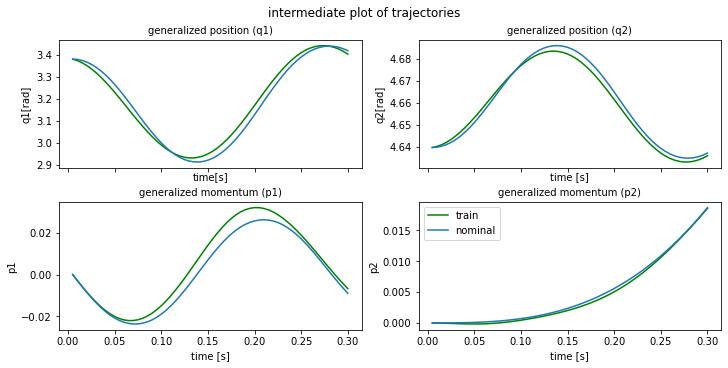

plot time : 0.6894192695617676


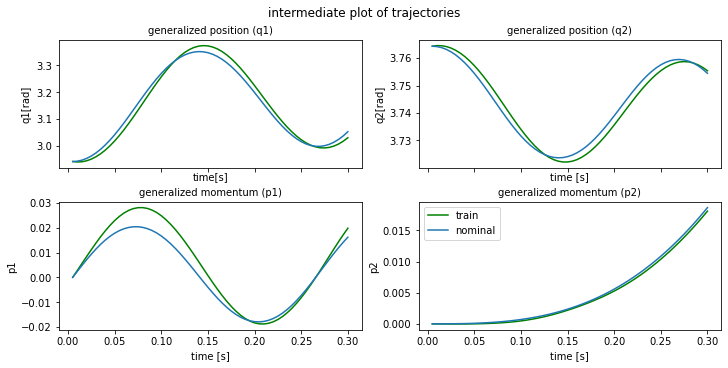

plot time : 0.5523130893707275
epoch  450 | train time 6.59 | train loss 3.570557e-03 
epoch  451 | train time 5.18 | train loss 4.286422e-03 
epoch  452 | train time 5.02 | train loss 3.499548e-03 
epoch  453 | train time 5.11 | train loss 4.251614e-03 
epoch  454 | train time 5.21 | train loss 3.446872e-03 
epoch  455 | train time 4.99 | train loss 4.212325e-03 
epoch  456 | train time 5.28 | train loss 3.399212e-03 
epoch  457 | train time 4.99 | train loss 4.179465e-03 
epoch  458 | train time 5.21 | train loss 3.354173e-03 
epoch  459 | train time 5.13 | train loss 4.154456e-03 


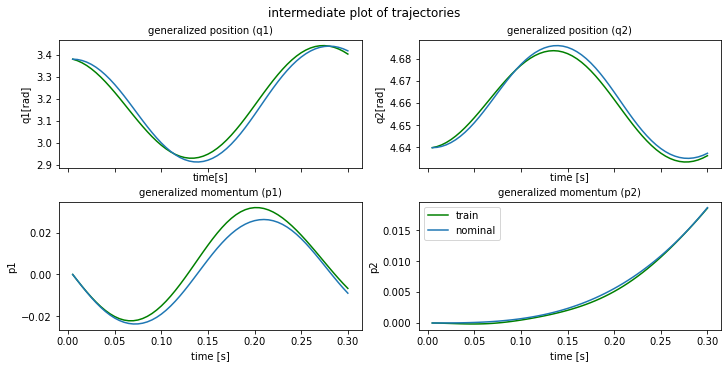

plot time : 0.7373971939086914


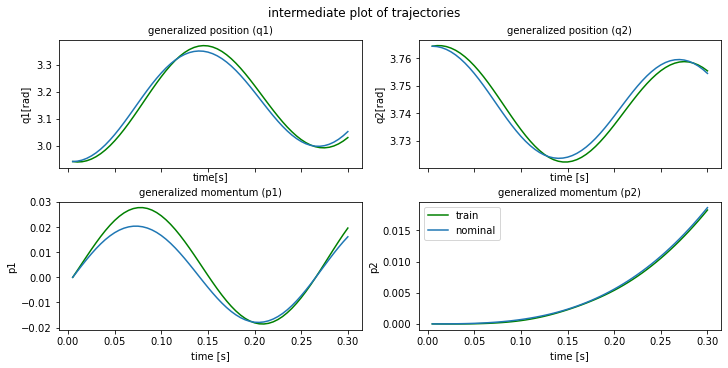

plot time : 0.5631623268127441
epoch  460 | train time 6.47 | train loss 3.307329e-03 
epoch  461 | train time 5.29 | train loss 4.141438e-03 
epoch  462 | train time 5.27 | train loss 3.258322e-03 
epoch  463 | train time 5.17 | train loss 4.137089e-03 
epoch  464 | train time 5.11 | train loss 3.208467e-03 
epoch  465 | train time 5.02 | train loss 4.138286e-03 
epoch  466 | train time 5.06 | train loss 3.157876e-03 
epoch  467 | train time 5.27 | train loss 4.140914e-03 
epoch  468 | train time 5.18 | train loss 3.108705e-03 
epoch  469 | train time 5.00 | train loss 4.142171e-03 


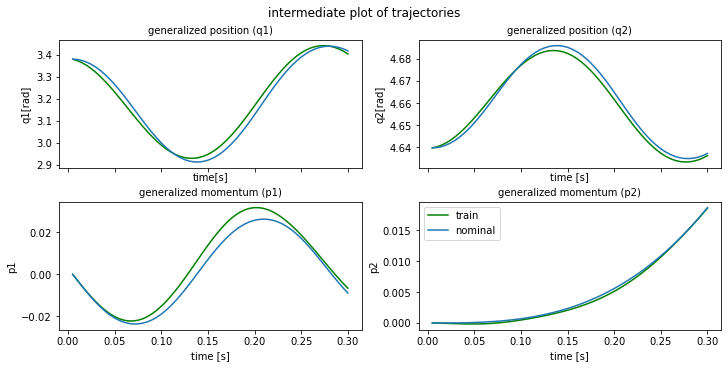

plot time : 0.6933815479278564


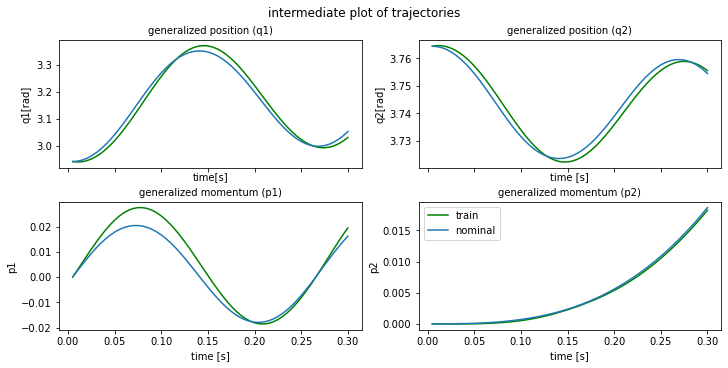

plot time : 0.6402125358581543
epoch  470 | train time 6.73 | train loss 3.062798e-03 
epoch  471 | train time 5.14 | train loss 4.138714e-03 
epoch  472 | train time 5.17 | train loss 3.023505e-03 
epoch  473 | train time 5.06 | train loss 4.128551e-03 
epoch  474 | train time 5.22 | train loss 2.991604e-03 
epoch  475 | train time 5.15 | train loss 4.110163e-03 
epoch  476 | train time 5.18 | train loss 2.968044e-03 
epoch  477 | train time 5.16 | train loss 4.082767e-03 
epoch  478 | train time 5.08 | train loss 2.952655e-03 
epoch  479 | train time 5.34 | train loss 4.046535e-03 


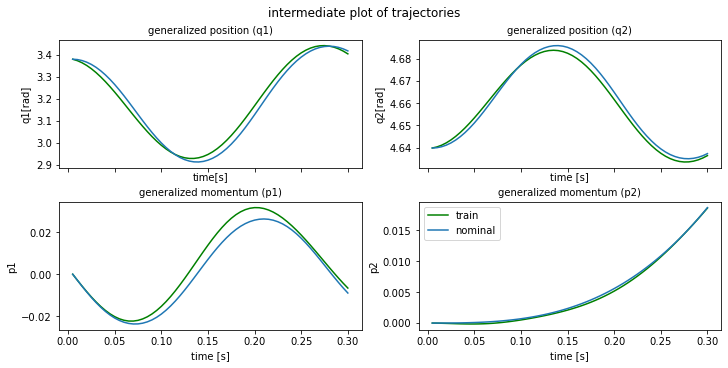

plot time : 0.7027745246887207


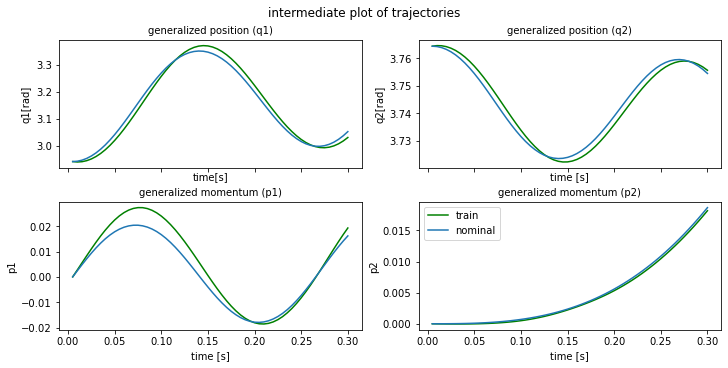

plot time : 0.5816917419433594
epoch  480 | train time 6.57 | train loss 2.945010e-03 
epoch  481 | train time 5.09 | train loss 4.002408e-03 
epoch  482 | train time 5.16 | train loss 2.944107e-03 
epoch  483 | train time 5.17 | train loss 3.951639e-03 
epoch  484 | train time 5.31 | train loss 2.948602e-03 
epoch  485 | train time 4.99 | train loss 3.896451e-03 
epoch  486 | train time 5.20 | train loss 2.956712e-03 
epoch  487 | train time 4.92 | train loss 3.839506e-03 
epoch  488 | train time 5.08 | train loss 2.966374e-03 
epoch  489 | train time 5.05 | train loss 3.783207e-03 


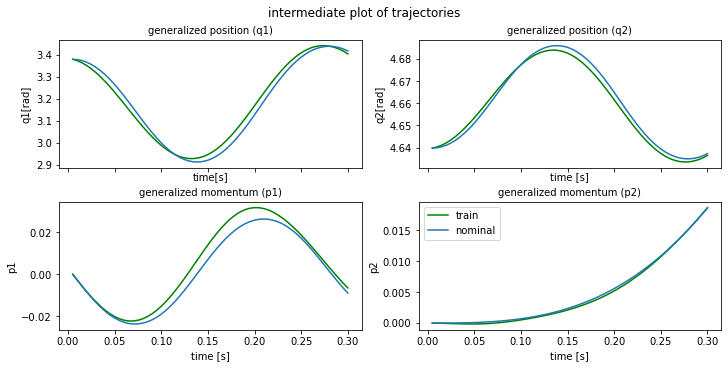

plot time : 0.7492349147796631


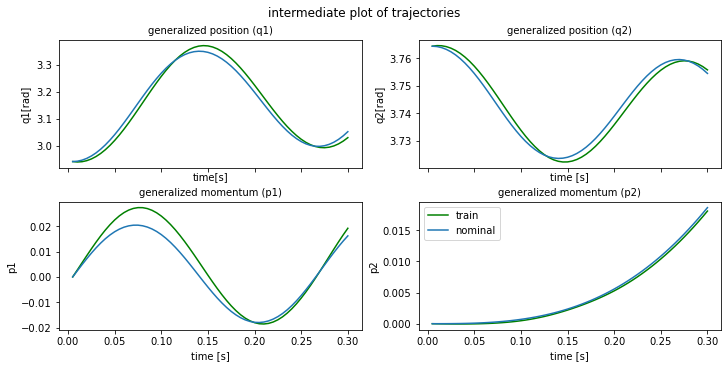

plot time : 0.5563404560089111
epoch  490 | train time 6.52 | train loss 2.975667e-03 
epoch  491 | train time 5.09 | train loss 3.729511e-03 
epoch  492 | train time 5.49 | train loss 2.983384e-03 
epoch  493 | train time 5.04 | train loss 3.680088e-03 
epoch  494 | train time 5.28 | train loss 2.988285e-03 
epoch  495 | train time 4.81 | train loss 3.635615e-03 
epoch  496 | train time 4.66 | train loss 2.990250e-03 
epoch  497 | train time 4.39 | train loss 3.595847e-03 
epoch  498 | train time 4.57 | train loss 2.989603e-03 
epoch  499 | train time 4.08 | train loss 3.560525e-03 


In [186]:
stats = train(model = model, 
            Ts = Ts, 
            train_loader = train_loader, 
            test_loader = test_loader, 
            w=torch.tensor(weights, device=device),
            grad_clip = True,
            lr_schedule = True,
            begin_decay = 2250, 
            resnet_config = 1,
            epoch_number = epoch_number, 
            alternating = False,
            horizon = False, 
            horizon_type = 'auto', 
            horizon_list = horizon_list, 
            switch_steps = switch_steps, 
            epochs = epoch_number, 
            loss_type = 'L2weighted2') # L2normalizedfixed3 0.5

#### Resnet config 2

In [321]:
switch_steps = [100,100,100,100]

In [322]:
H_net = ResNet_config2(resblock_list = [0,7], num_blocks = 8, input_dim=4, hidden_dim=25, nb_hidden_layers=2, output_dim=1, activation_res='x+sin(x)^2', activation_mlp='x+sin(x)^2')

model = Nes_HDNN(u_func=u_func, G_net=g_func, H_net=H_net, device=device)
model.to(device)

num_params = count_parameters(model)
print(num_params)
weights = [1.0, 5.0, 10.0, 15.0] 

weights_title = ' | weights = ' + str(weights)
print('weights',weights)

print(len(horizon_list))
print(len(switch_steps))
epoch_number = sum(switch_steps)
print('total number of epochs',epoch_number)
sum(switch_steps[:25])
save_prefix = '{:d}e_w_{:05.1f}_{:05.1f}_{:05.1f}_{:05.1f}_p{:d}k_ts_{:1.3f}__'.format(epoch_number,weights[0],weights[1],weights[2],weights[3],int((num_params-num_params%1000)/1000),Ts)
save_prefix = save_prefix+ '_'+ utype+ '_'
print(save_prefix)

1453
weights [1.0, 5.0, 10.0, 15.0]
3
4
total number of epochs 400
400e_w_001.0_005.0_010.0_015.0_p1k_ts_0.005___chirp_


In [323]:
model.H_net.resblock_list

[0, 7]

##### 100 trajectories batch = 100

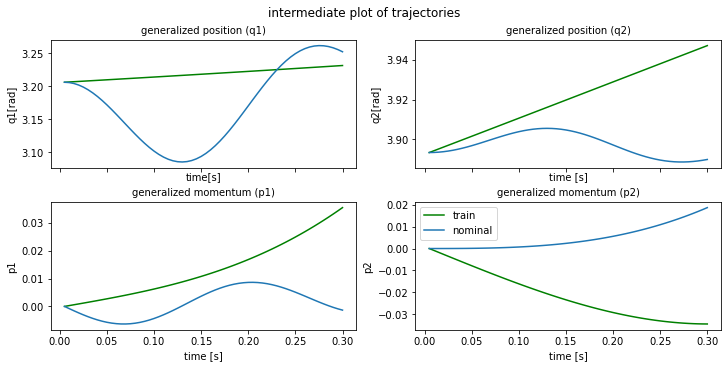

plot time : 0.5063319206237793
epoch    0 | train time 5.15 | train loss 8.592895e-01 | test loss 2.399924e-01 | test time 0.87  
epoch    1 | train time 5.38 | train loss 5.283059e-01 
epoch    2 | train time 4.92 | train loss 4.626826e-01 
epoch    3 | train time 5.09 | train loss 4.397715e-01 
epoch    4 | train time 5.23 | train loss 4.319118e-01 
epoch    5 | train time 5.49 | train loss 4.212187e-01 
epoch    6 | train time 5.01 | train loss 4.183979e-01 
epoch    7 | train time 5.29 | train loss 4.131575e-01 
epoch    8 | train time 6.12 | train loss 4.075112e-01 
epoch    9 | train time 4.97 | train loss 4.027440e-01 


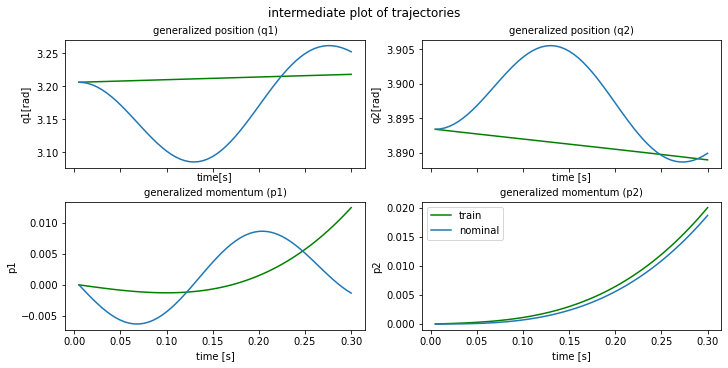

plot time : 0.5284640789031982
epoch   10 | train time 5.71 | train loss 3.977134e-01 | test loss 1.626323e-01 | test time 1.19  
epoch   11 | train time 4.92 | train loss 3.923234e-01 
epoch   12 | train time 4.96 | train loss 3.871130e-01 


KeyboardInterrupt: 

In [324]:
stats = train(model = model, 
            Ts = Ts, 
            train_loader = train_loader, 
            test_loader = test_loader, 
            w=torch.tensor(weights, device=device),
            grad_clip = True,
            lr_schedule = False,
            begin_decay = 2250, 
            resnet_config = 2,
            epoch_number = epoch_number, 
            alternating = False,
            horizon = 60, 
            horizon_type = False, 
            horizon_list = horizon_list, 
            switch_steps = switch_steps, 
            epochs = epoch_number, 
            loss_type = 'L2weighted2')

# Saving model and stats

In [ ]:
save_prefix = save_prefix +'multitrajwinput'

In [ ]:
stats_path = PATH+'data/stats/'+save_prefix+'stats.txt'

In [ ]:
import json

In [ ]:
# save the stats
save_stats(PATH, stats, stats_path)

In [ ]:
# loads the stats 
stats = read_dict(PATH, stats_path)

In [ ]:
model_name = 'models/'+save_prefix+'model_test_latest'

In [ ]:
# save model to disk
model_name = 'data/models/'+save_prefix+'model_test'
torch.save(model.state_dict(), PATH+model_name)

In [ ]:
# load the model from disk
model = load_model_nes_hdnn(device,utype=utype, u_func=u_func, hidden_dim=90, nb_hidden_layers=4) # load_model(hidden_dim=90, nb_hidden_layers=4)
#load_model(device, hidden_dim=90, nb_hidden_layers=4)
model.load_state_dict(torch.load(PATH+model_name))
model.eval()

In [ ]:
print(model.C2_dissip)
print(model.C1_dissip)

# Plots of results

In [218]:
horizon_steps = []
horizon_steps.append(0)
for i, number in enumerate(switch_steps) :
  horizon_steps.append(horizon_steps[i] +number) 
horizon_steps = horizon_steps[1:-1]
# horizon_steps

In [219]:
save_prefix = save_prefix+'winput'+'resnets'

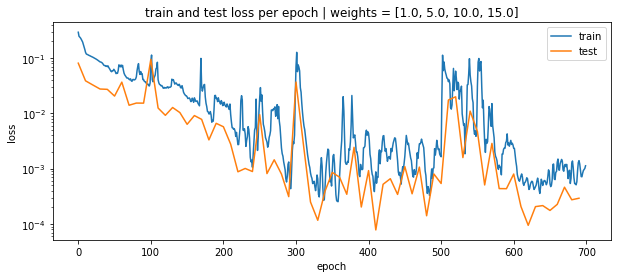

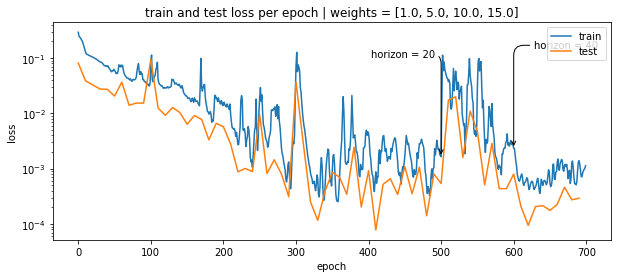

In [220]:
loss_train = stats['train_loss']
loss_test = stats['test_loss']
epochs = np.arange(len(loss_train))
train_test_loss_plot(loss_train, loss_test, epochs, file_path=PATH+'data/img/'+save_prefix+'LOSS_train_test_1.png', 
                     title='train and test loss per epoch'+ weights_title, horizons= False )

train_test_loss_plot(loss_train, loss_test, epochs, file_path=PATH+'data/img/'+save_prefix+'LOSS_train_test_2.png', 
                     title='train and test loss per epoch'+ weights_title, horizons= horizon_list[:-1], horizon_steps = horizon_steps )

In [ ]:
model.u_func = u_func
model.G_net = g_func

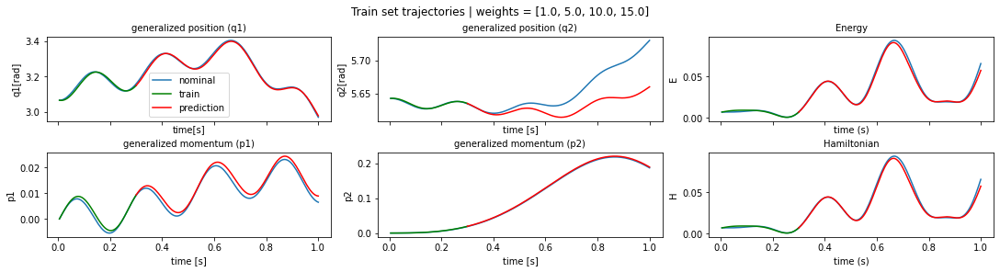

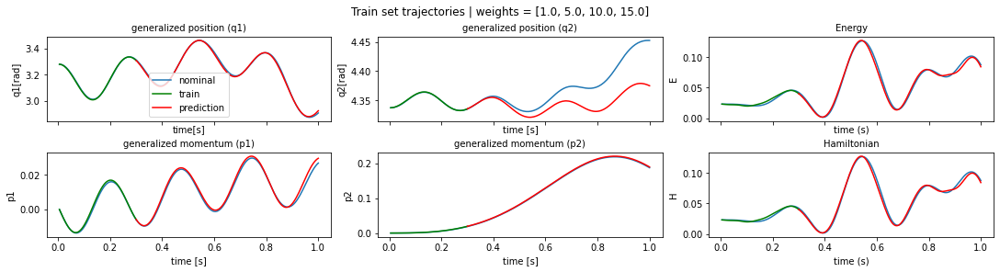

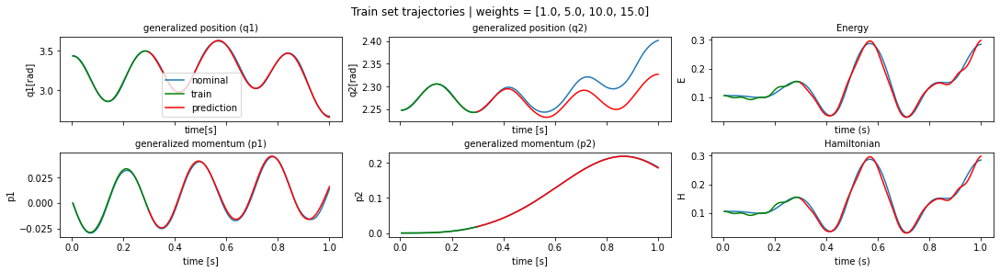

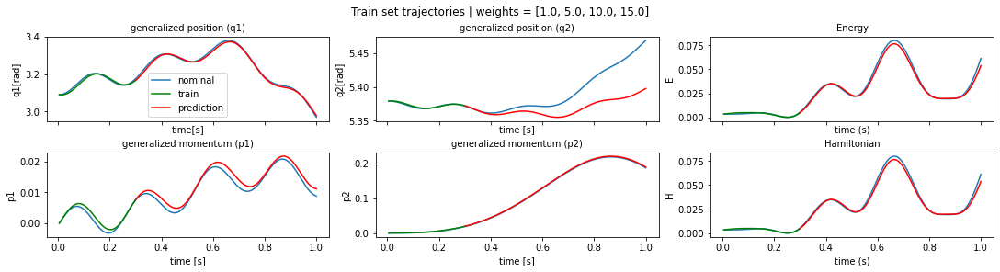

In [227]:
for n in [0,5,10,19]:
    plot_furuta_hat_nom(device, model, u_func, g_func, utype, gtype, data_loader_t=train_loader, 
                        t_max=60, n=n, C_q1=C_q1, C_q2=C_q2, g=g, Jr=Jr, Lr=Lr, Mp=Mp, Lp=Lp,
                        t_plot=200, show_pred=True,
                        title = 'Train set trajectories'+ weights_title, file_path=PATH+'data/img/'+save_prefix+'TRAJECTORIES_train_set'+str(n)+'_nopred.png')

In [ ]:
for n in [0,50,70,80]:
    plot_furuta_hat_nom(device, model, u_func, g_func, utype, gtype, data_loader_t=train_loader, t_max=300, n=n, C_q1=C_q1, C_q2=C_q2, g=g, Jr=Jr, Lr=Lr, Mp=Mp, Lp=Lp,
                        title = 'Train set trajectories'+ weights_title, file_path=PATH+'data/img/'+save_prefix+'TRAJECTORIES_train_set'+str(n)+'.png')

In [239]:
device = set_device()
Ts, noise_std, C_q1, C_q2, g, Jr, Lr, Mp, Lp = set_furuta_params(which = 'fake') # 'fake'
utype = None
u_func = U_FUNC(utype=utype)
u_func.params['T'] = 1.5
u_func.params['f0'] = 0
u_func.params['f1'] = 10 #4 # 1.4
u_func.params['scale'] = 1.0 # 0.1
gtype=None
g_func = G_FUNC(gtype=gtype)
init_method = 'random_closetopi' # 'random_nozero' # 'random_closetopi'
time_steps= 800
num_trajectories = 1

cpu


In [229]:
train_loader_2, test_loader_2 = load_data_device(device, init_method, 
                                            u_func, g_func, time_steps, 
                                            shuffle = False, 
                                            num_trajectories = 1, 
                                            coord_type = 'hamiltonian', 
                                            proportion = 0.0, batch_size = 100, 
                                            Ts=Ts, noise_std=noise_std, C_q1=C_q1, C_q2=C_q2, 
                                            g = g, Jr = Jr, Lr = Lr, Mp = Mp, Lp = Lp)

In [230]:
model.u_func = u_func
model.G_net = g_func

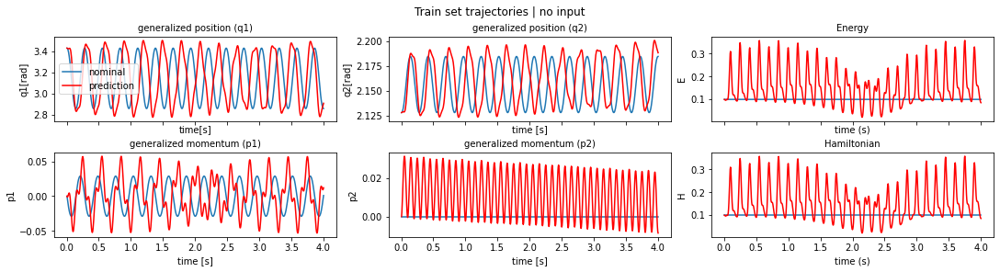

In [240]:
for n in [0]:
    plot_furuta_hat_nom(device, model, u_func, g_func, utype, gtype, data_loader_t=train_loader_2, t_max=300, n=n, C_q1=C_q1, C_q2=C_q2, g=g, Jr=Jr, Lr=Lr, Mp=Mp, Lp=Lp, only_pred = True,
                        title = 'Train set trajectories | no input', file_path=PATH+'data/img/'+save_prefix+'TRAJECTORIES_train_set'+str(n)+'_noinput.png')


In [241]:
device = set_device()
Ts, noise_std, C_q1, C_q2, g, Jr, Lr, Mp, Lp = set_furuta_params(which = 'fake') # 'fake'
utype = 'sine'
u_func = U_FUNC(utype=utype)

u_func.params['f1'] = 10 #4 # 1.4

gtype='simple'
g_func = G_FUNC(gtype=gtype)
init_method = 'random_closetopi' # 'random_nozero' # 'random_closetopi'
time_steps= 800
num_trajectories = 1

train_loader_3, test_loader_3 = load_data_device(device, init_method, 
                                            u_func, g_func, time_steps, 
                                            shuffle = False, 
                                            num_trajectories = 1, 
                                            coord_type = 'hamiltonian', 
                                            proportion = 0.0, batch_size = 100, 
                                            Ts=Ts, noise_std=noise_std, C_q1=C_q1, C_q2=C_q2, 
                                            g = g, Jr = Jr, Lr = Lr, Mp = Mp, Lp = Lp)

u_func = U_FUNC(utype=utype)
u_func.params['f1'] = 1 #4 # 1.4
u_func.params['scale'] = 0.5
gtype='simple'
g_func = G_FUNC(gtype=gtype)
model.u_func = u_func
model.G_net = g_func

cpu


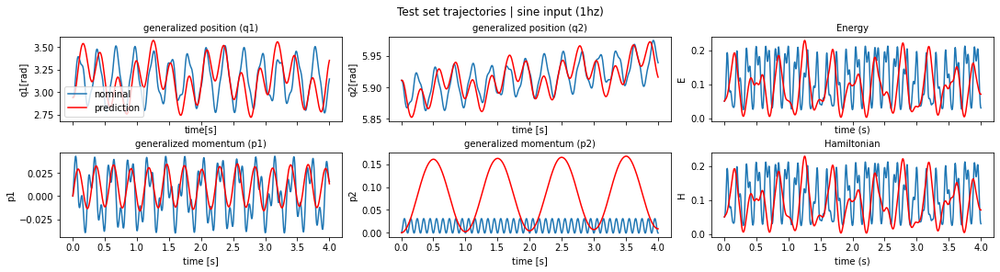

IndexError: index 5 is out of bounds for dimension 1 with size 1

In [242]:
for n in [0,5,9]:
    plot_furuta_hat_nom(device, model, u_func, g_func, utype, gtype, data_loader_t=train_loader_3, t_max=300, n=n, C_q1=C_q1, C_q2=C_q2, g=g, Jr=Jr, Lr=Lr, Mp=Mp, Lp=Lp, only_pred = True,
                        title = 'Test set trajectories | sine input (1hz)', file_path=PATH+'data/img/'+save_prefix+'TRAJECTORIES_train_set'+str(n)+'_sineinput.png')

In [236]:
device = set_device()
Ts, noise_std, C_q1, C_q2, g, Jr, Lr, Mp, Lp = set_furuta_params(which = 'fake') # 'fake'
utype = 'sine'
u_func = U_FUNC(utype=utype)

u_func.params['f1'] = 5 #4 # 1.4

gtype='simple'
g_func = G_FUNC(gtype=gtype)
init_method = 'random_closetopi' # 'random_nozero' # 'random_closetopi'
time_steps= 800
num_trajectories = 1

train_loader_4, test_loader_4 = load_data_device(device, init_method, 
                                            u_func, g_func, time_steps, 
                                            shuffle = False, 
                                            num_trajectories = 1, 
                                            coord_type = 'hamiltonian', 
                                            proportion = 0.0, batch_size = 100, 
                                            Ts=Ts, noise_std=noise_std, C_q1=C_q1, C_q2=C_q2, 
                                            g = g, Jr = Jr, Lr = Lr, Mp = Mp, Lp = Lp)
model.u_func = u_func
model.G_net = g_func

cpu


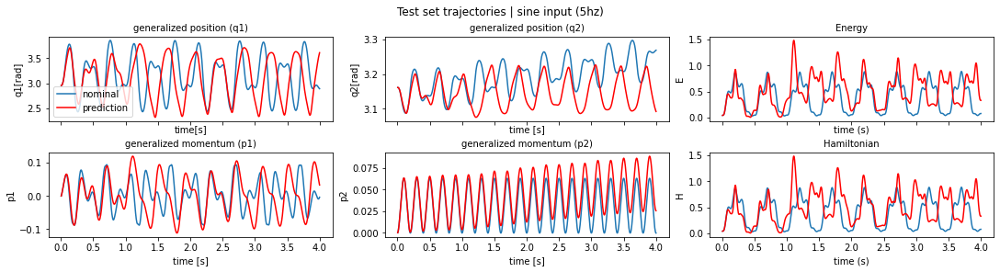

In [237]:
for n in [0]:
    plot_furuta_hat_nom(device, model, u_func, g_func, utype, gtype, data_loader_t=train_loader_4, t_max=300, n=n, C_q1=C_q1, C_q2=C_q2, g=g, Jr=Jr, Lr=Lr, Mp=Mp, Lp=Lp, only_pred=True,
                        title = 'Test set trajectories | sine input (5hz)', file_path=PATH+'data/img/'+save_prefix+'TRAJECTORIES_train_set'+str(n)+'_sineinput_5hz.png')


# Other

In [ ]:
n=20
plot_furuta_hat_nom(device, model, u_func, g_func, utype, gtype, data_loader_t=train_loader, t_max=300, n=n, C_q1=C_q1, C_q2=C_q2, g=g, Jr=Jr, Lr=Lr, Mp=Mp, Lp=Lp,
                     title = 'Train set trajectories'+ weights_title, file_path=PATH+'data/img/'+save_prefix+'TRAJECTORIES_train_set'+str(n)+'.png')

In [ ]:
n = 10 

plot_furuta_hat_nom(device, model, u_func, g_func, utype, gtype, data_loader_t=test_loader, t_max=300, n=n, C_q1=C_q1, C_q2=C_q2, g=g, Jr=Jr, Lr=Lr, Mp=Mp, Lp=Lp,
                     title = 'Test set trajectories'+ weights_title, file_path=PATH+'data/img/'+save_prefix+'TRAJECTORIES_test_set'+str(n)+'.png')

In [ ]:
n = 7
plot_furuta_hat_nom(device, model, u_func, g_func, utype, gtype, data_loader_t=test_loader, t_max=300, n=n, C_q1=C_q1, C_q2=C_q2, g=g, Jr=Jr, Lr=Lr, Mp=Mp, Lp=Lp,
                     title = 'Test set trajectories'+ weights_title, file_path=PATH+'data/img/'+save_prefix+'TRAJECTORIES_test_set'+str(n)+'.png')

In [ ]:
n = 12
plot_furuta_hat_nom(device, model, u_func, g_func, utype, gtype, data_loader_t=test_loader, t_max=300, n=n, C_q1=C_q1, C_q2=C_q2, g=g, Jr=Jr, Lr=Lr, Mp=Mp, Lp=Lp,
                     title = 'Test set trajectories'+ weights_title, file_path=None)#PATH+'data/img/'+save_prefix+'TRAJECTORIES_test_set'+str(n)+'.png')

In [ ]:
test_loader_3, _ , _ = load_data_device(device, utype, gtype, init_method=init_method,u_func=u_func, g_func=g_func, time_steps=100, num_trajectories=2,  coord_type='hamiltonian', proportion=0.0, batch_size=1,
                                        noise_std=noise_std, Ts=Ts,C_q1= C_q1, C_q2= C_q2, g= g, Jr= Jr, Lr= Lr, Mp= Mp, Lp= Lp)


In [ ]:
test_loader_path_3 = PATH + 'data/datasets/test_loader_longer_3' + suffix + '.pt'

In [ ]:
torch.save(test_loader_3, test_loader_path_3)

In [ ]:
test_loader_3 = torch.load(test_loader_path_3)

In [ ]:
plot_longer_horizon_furuta(device, model, u_func, g_func, utype, gtype, test_loader=test_loader_3,t1=0,t2=2000, C_q1= C_q1, C_q2= C_q2, g= g, Jr= Jr, Lr= Lr, Mp= Mp, Lp= Lp, title = 'Trajectory after longer horizon'+ weights_title,
                           file_path=PATH+'img/'+save_prefix+'TRAJ_longer_horizon1.png')

In [ ]:
plot_longer_horizon_furuta(device, model, u_func, g_func, utype, gtype, test_loader=test_loader_3,t1=2000,t2=10000, C_q1= C_q1, C_q2= C_q2, g= g, Jr= Jr, Lr= Lr, Mp= Mp, Lp= Lp, title = 'Trajectory after longer horizon'+ weights_title,
                           file_path=PATH+'img/'+save_prefix+'TRAJ_longer_horizon2.png')

In [ ]:
n = 0
plot_furuta_hat_nom(device, model, u_func, g_func, utype, gtype, data_loader_t=test_loader_3, t_max=300, n=n, C_q1=C_q1, C_q2=C_q2, g=g, Jr=Jr, Lr=Lr, Mp=Mp, Lp=Lp,
                     title = 'Test set trajectories'+ weights_title, file_path=PATH+'img/'+save_prefix+'TRAJECTORIES_test_set_longer'+str(n)+'.png')